In [1]:
# loading modules
using PyPlot, Printf, LinearAlgebra, FFTW, FileIO, JLD2

using CUDA

# include("../../LinStab/mjcl_stab.jl")
# using .LinStab

using FourierFlows: CPU, TwoDGrid

using GeophysicalFlows

using Glob

using Statistics

using Parameters

run_file_dir = "/scratch/cimes/ml1994/QG/julia/QG_topo/"
include(run_file_dir * "mjcl_gfjl_fcns.jl")


calc_Ld (generic function with 1 method)

In [2]:

@with_kw struct mod_params
    data_dir::String = "./"
    Nz::Int64 = 2
    Nx::Int64 = 562
    Ny::Int64 = 562
    Lx::Int64 = 1000.e3
    Ly::Int64 = 1000.e3
    Ld::Float64 = 25.e3
    f0::Float64 = 8.e-5
    H::Array{Float64} = ones(Nz) * (4000/Nz)
    g::Float64 = 9.81
    rho0::Float64 = 1025.
    rho::Array{Float64} = zeros(Nz)
    strat_str::String = "uni_strat"
    b::Array{Float64} = (g/rho0) .* (rho0 .- rho)
    shear_str::String = "uni_shear"
    U::Array{Float64} = ones(Nz)
    μ::Float64 = 0.
    κ::Float64 = 0.
    nν::Int64 = 4
    ν::Float64 = 0.
    q0_mag::Float64 = 1.e-7
    eta::Any = zeros(Nx,Ny) # eta::Array{Float64} = zeros(Nx,Ny)
    topographic_pv_gradient::Tuple{Float64, Float64} = (0., 0.)
    topo_type::String = "flat"
    h0::Tuple{Float64, Float64} = (0., 0.)
    kt::Float64 = 0.
    β::Float64 = 0.
    dt::Float64 = 1200.
    stepper::String = "ETDRK4"
    linear::Bool = false
    dev::Any = CPU()
    restart_bool::Bool = false
    restart_yr::Int = 0
    yr_increment::Float64 = 1.0
    ss_yr_max::Int = 100
    nsubs::Int64 = round(Int64, 5*(Ld / (U[1]/2))/dt)  # save psi field every 5 eddy periods
end

function jld_name(model_params, yr_cnt)

    @unpack_mod_params model_params

    # topo string
    if topo_type=="y_slope"
        h_str = "_" * topo_type * "_h0_" * (@sprintf "%.3E" h0[1])
    elseif topo_type=="rough"
        h_str = "_" * topo_type * "_hrms_" * string(round(h0[2]))*"_kt" * string(round(kt)) 
    elseif topo_type=="rand_slope"
        h_str = "_" * topo_type * "_hrms_"* string(round(h0[2]))*"_kt" * string(round(kt)) 
    elseif topo_type=="sin_sin"
        h_str = "_" * topo_type * "_h0_"* string(Int(h0[1]))  
    elseif topo_type=="flat"
        h_str = "_" * topo_type
    end

    # drag strings
    kap_str = @sprintf "%.3E" κ
    mu_str = @sprintf "%.3E" μ

    nu_str = @sprintf "%.3E" ν
    hv_str = "_nu" * nu_str

    drag_str = "_mu" * mu_str * "_kappa" * kap_str

    # misc.
    beta_str = "_beta" * (@sprintf "%.3E" β) * "_"

    res_str =  "_res" * string(Int(Nx))

    yr_str = "_yr" * string(yr_cnt)

    # geometry
    L_str = "_L_2pi" * (@sprintf "%.3E" Lx)

    thick_str = "layer" * string(Nz) * "_Htot_" * string(sum(H))
    
    return "/" * thick_str * L_str * h_str * beta_str * shear_str * "_" * strat_str * drag_str * hv_str * res_str * yr_str * ".jld"
end




jld_name (generic function with 1 method)

In [3]:
# using PlotUtils

# cm = cgrad(:coolwarm);
# clrs = [cm[i] for i in range(0,1,100)]

# hc_range = collect(range(h0s[1],h0s[end],100))

# function h_color(h_in,hc_range,colors)
#     c_ind = argmin(abs.(h_in .- (hc_range)))

#     color_out = [red(clrs[c_ind]),green(clrs[c_ind]),blue(clrs[c_ind])]

#     if h_in==0
#         color_out = [0.,0.,0.]
#     end
#     return color_out
# end

# Defining model parameters

In [72]:
###################################################################################
## Numerical details
###################################################################################

dev = CPU()     # device

# numerical params
Nx = Ny = 512                # 2D resolution = n²

###################################################################################
## Geometry and background fields
###################################################################################
L = Lx = Ly = 1000.e3                   # domain size [m]
β = 0. # 1e-11              # the y-gradient of planetary PV; beta = β = 0. * (U[1]/2) * Ld^-2

f0 = 8.0e-5  # 1.0e-4            # Coriolis param [s^-1]
g = 9.81                    # gravity
H = [2000., 2000.]     # the rest depths of each layer;
Nz = length(H)                 # number of layers

# background flow
shear_str = "uni_shear"
U_top = 0.015
U_bottom = 0.0
U_scale_depth = 1250.

U = vert_disc(shear_str, U_top, U_bottom, H, U_scale_depth)

# setting base density profile
strat_str = "uni_strat"

rho0 = 1025.
rho_top = 1025.
rho_bottom = 1026.
rho_scale_depth = 1250.

rho = vert_disc(strat_str, rho_top, rho_bottom, H, rho_scale_depth)

interim_params = mod_params(rho=rho,H=H, Nz=Nz)
Lds = calc_Ld(interim_params)
Ld = Lds[1]

###################################################################################
## Topography
###################################################################################

# set topography w/ current options:
topo_type = "y_slope"

# Defining a bulk slope parameter...should probably change this!
S32 = f0 * (U[1]-U[end]) / (g * (rho[end] - rho[1]) / rho0)

dyetab_over_S32 = collect(range(-1.5,1.5,13))
h0s = dyetab_over_S32 .* S32

# tuple of (bottom slope, h_rms)
h0 = (h0s[7], 0.)    # bottom slope [4e-4, 7.5e-4]

# central wavenumber for rough topo
kt = 0.

# defining GFJL topo params
interim_params = mod_params(topo_type=topo_type, h0=h0, kt=kt)

topographic_pv_gradient, eta = define_topo(interim_params)

###################################################################################
# Dissipation
###################################################################################

# biharmonic viscosity
nν = 4
νstar = 0. # 10^-13
ν = νstar * ((U[1]-U[end])/2) * (Lx/2/pi)^7

# Linear bottom drag
μstar = 0.5
μ = μstar * ((U[1] - U[end]) / 2) / Ld

# Quadratic bottom drag
κstar = 0.5
κ = κstar / Ld

###################################################################################
## Time stepping and sample rate
###################################################################################

if ν==0.
    stepper = "FilteredETDRK4"
    # af = 0.
    # global filt_order=4
    # global innerK = 2/3
else
    stepper = "ETDRK4"
    # af = 1/3
    # global filt_order=4
    # innerK = 2/3
end

# should I set dt via CFL condition instead?
dt = 1800.

###################################################################################
## Details of saving data
###################################################################################

data_dir_fric_nrg = "/scratch/cimes/ml1994/QG/julia/data/two_layer_drag_study/"

# where to save model output; frequency of output
data_dir = "/scratch/cimes/ml1994/QG/julia/data/multilayer_data/"

f_s = 10.0 * (Ld / (U[1]/2)) #  N eddy turnover periods

# sampling period in time steps (set above)
nsubs = round(Int64, f_s/dt)

###################################################################################
## Model run parameters
###################################################################################

# steady-state  parameters
ss_yr_max = ceil(250 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25)  # number of eddy periods converted to years for model run
yr_increment = 5.0 # how often to write to a save file

restart_bool = false

###################################################################################
## Define params struct
###################################################################################
model_params = mod_params(
data_dir = data_dir,
Nz = Nz, Nx = Nx, Ny = Ny, Lx = Lx, Ly = Ly, Ld = Ld,
H = H,
rho0 = rho0, rho = rho, strat_str = strat_str,
shear_str = shear_str, U = U,
μ = μ, κ = κ, nν = nν, ν = ν,
eta = eta, topographic_pv_gradient = topographic_pv_gradient, topo_type = topo_type, h0 = h0,
β = β,
dt = dt,
stepper = stepper,
dev = dev,
restart_bool = restart_bool,
ss_yr_max = ss_yr_max,
yr_increment = yr_increment,
nsubs = nsubs);

@unpack_mod_params model_params
nlayers=Nz

2

In [38]:
function redef_mu_kappa_topoPV_h0(model_params, mu, kappa, topo_PV, h0_new)
    @unpack_mod_params model_params

    mp_out = mod_params(
    data_dir = data_dir,
    Nz = Nz, Nx = Nx, Ny = Ny, Lx = Lx, Ly = Ly, Ld = Ld,
    H = H,
    rho0 = rho0, rho = rho, strat_str = strat_str,
    shear_str = shear_str, U = U,
    μ = mu , κ = kappa , nν = nν, ν = ν,
    eta = eta, topographic_pv_gradient = topographic_pv_gradient, topo_type = topo_type, h0 = h0,
    β = β,
    dt = dt,
    stepper = stepper,
    dev = dev,
    restart_bool = restart_bool,
    ss_yr_max = ss_yr_max,
    yr_increment = yr_increment,
    nsubs = nsubs);

    return mp_out
end

redef_mu_kappa (generic function with 1 method)

In [74]:
prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=Lx, f₀=f0, H, b = model_params.b, U, nν, ν, eta, topographic_pv_gradient,
        μ, κ, β, dt, stepper="ETDRK4", linear=false, aliased_fraction=1/3)

sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

# Layer-wise x-space energy budget

In [35]:
function layered_nrg(model_params,vars, params, grid, sol, ψ)

    @unpack_mod_params model_params

    nlayers = Nz
    
    g′ = b[1:nlayers-1] - b[2:nlayers] # reduced gravity at each interface

    Fm = @. f0^2 / (g′ * H[2:nlayers])
    # Fp = @. f0^2 / (g′ * H[1:nlayers-1])
    
    ψh = rfft(ψ)

    ∂ψ∂x = irfft(im * grid.kr .* ψh, grid.nx)
    ∂ψ∂y = irfft(im * grid.l  .* ψh, grid.nx)
    
    mod2∇ψ1 = @. ∂ψ∂x[:,:,1]^2 + ∂ψ∂y[:,:,1]^2
    mod2∇ψ2 = @. ∂ψ∂x[:,:,2]^2 + ∂ψ∂y[:,:,2]^2

    mod2u = @. ∂ψ∂y[:,:,1]^2 + ∂ψ∂y[:,:,2]^2
    mod2v = @. ∂ψ∂x[:,:,1]^2 + ∂ψ∂x[:,:,2]^2

    APE_d = @. 0.5 * Fm[1] * (ψ[:,:,1] - ψ[:,:,2])^2
    APE = sum(APE_d) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    KE_d = zeros(grid.nx, grid.ny, nlayers)
    KE_d[:,:,1] = @. 0.5 * mod2∇ψ1 
    KE_d[:,:,2] = @. 0.5 * mod2∇ψ2 
    KE = dropdims(sum(dropdims(sum(KE_d,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1

    KE_uv = zeros(grid.nx, grid.ny, nlayers)
    KE_uv[:,:,1] = @. 0.5 * mod2u
    KE_uv[:,:,2] = @. 0.5 * mod2v 
    KE_comp = dropdims(sum(dropdims(sum(KE_uv,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    return KE, KE_comp, APE

end

layered_nrg(model_params,prob, ψ) = layered_nrg(model_params,prob.vars, prob.params, prob.grid, prob.sol, ψ)


layered_nrg (generic function with 4 methods)

In [36]:

function nrg_budget12(model_params)

    @unpack_mod_params model_params

    nlayers=Nz
    
    EKE_out = zeros(length(h0s),2)
    EKE_uv_out = zeros(length(h0s),2)
    EAPE_out = zeros(length(h0s))

    prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=Lx, f₀=f0, H, b, U, nν, ν, eta, topographic_pv_gradient,
    μ, β, dt, stepper, aliased_fraction=1/3);

    sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

    for k in range(1,length(h0s))

        file1 = jld_name(model_params,1)
        files = glob(file1[2:findfirst("yr",file1)[2]]*"*", data_dir)
        
        N_files = round(Int, (length(files)))
        
        yr_output = zeros(N_files)
        for (i, file) in enumerate(files)
            yr_output[i] = parse(Float64,file[findfirst("yr",file)[2]+1:findfirst(".jld",file)[1]-1])
        end
        
        yr_output = sort(yr_output)
        
        ## pre-allocate
        window = Int(round(100 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times; in years
        N_window = yr_output[end] - window
        start_file_ind = argmin(abs.(yr_output .- N_window))
        
        nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output

        EKEh = zeros(nmax,2)
        EKE_uvh = zeros(nmax,2)
        EAPEh = zeros(nmax)

        n=1
        ##

        for i in range(start_file_ind,N_files)

            a = load(data_dir*jld_name(model_params,yr_output[i]))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                KE, KE_uv, APE = layered_nrg(model_params,prob,ψ)

                EKEh[n,:]    = KE'
                EKE_uvh[n,:] = KE_uv'
                EAPEh[n]     = APE
                    
                n+=1

            end

            GC.gc()

        end

        EKE_out[k,:]    = mean(EKEh[1:n-1,:],dims=1)
        EKE_uv_out[k,:] = mean(EKE_uvh[1:n-1,:],dims=1)
        EAPE_out[k]     = mean(EAPEh[1:n-1])

    end
    
    return EKE_out, EKE_uv_out, EAPE_out
end


nrg_budget12 (generic function with 1 method)

In [37]:
EKE12_nu0_kap1, EKEuv_nu0_kap1, EAPE12_nu0_kap1 = nrg_budget12(model_params);



In [44]:
EKE12_nu0_kap1

13×2 Matrix{Float64}:
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11
 9.14018e-9  2.68357e-11

In [30]:
fn = data_dir*"layered_nrgs_xspace_nu0_kap1.jld"

jld_data = Dict("EKE12_nu0_kap1" => EKE12_nu0_kap1, "EKEuv_nu0_kap1" => EKEuv_nu0_kap1, "EAPE12_nu0_kap1" => EAPE12_nu0_kap1)

jldsave(fn; jld_data)

# a = load(fn);

# for (k,v) in a["jld_data"]
#     @eval $(Symbol(k)) = $(v)
# end

In [62]:
fn = data_dir_fric_nrg*"layered_nrgs_xspace_nu0_kap0p5.jld"

# jld_data = Dict("EKE12_nu0_kap0p5" => EKE12_nu0_kap0p5, "EKEuv_nu0_kap0p5" => EKEuv_nu0_kap0p5, "EAPE12_nu0_kap0p5" => EAPE12_nu0_kap0p5)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [32]:
fn = data_dir*"layered_nrgs_xspace_nu0_kap2.jld"

jld_data = Dict("EKE12_nu0_kap2" => EKE12_nu0_kap2, "EKEuv_nu0_kap2" => EKEuv_nu0_kap2, "EAPE12_nu0_kap2" => EAPE12_nu0_kap2)

jldsave(fn; jld_data)

# a = load(fn);

# for (k,v) in a["jld_data"]
#     @eval $(Symbol(k)) = $(v)
# end

In [33]:
fn = data_dir*"layered_nrgs_xspace_nu0_kap4.jld"

jld_data = Dict("EKE12_nu0_kap4" => EKE12_nu0_kap4, "EKEuv_nu0_kap4" => EKEuv_nu0_kap4, "EAPE12_nu0_kap4" => EAPE12_nu0_kap4)

jldsave(fn; jld_data)

# a = load(fn);

# for (k,v) in a["jld_data"]
#     @eval $(Symbol(k)) = $(v)
# end

In [41]:
fn = data_dir_fric_nrg*"layered_nrgs_xspace_nu0_kap0p25.jld"
# fn = data_dir_fric_nrg*"layered_nrgs_xspace_nu0_mu0p25.jld"


# jld_data = Dict("EKE12_nu0_kap0p25" => EKE12_nu0_kap0p25, "EKEuv_nu0_kap0p25" => EKEuv_nu0_kap0p25, "EAPE12_nu0_kap0p25" => EAPE12_nu0_kap0p25)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [14]:
fn = data_dir*"layered_nrgs_xspace_nu0_kap0p125.jld"

# jld_data = Dict("EKE12_nu0_kap0p125" => EKE12_nu0_kap0p125,"EKEuv_nu0_kap0p125" => EKEuv_nu0_kap0p125,  "EAPE12_nu0_kap0p125" => EAPE12_nu0_kap0p125)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

# Everything for beta runs


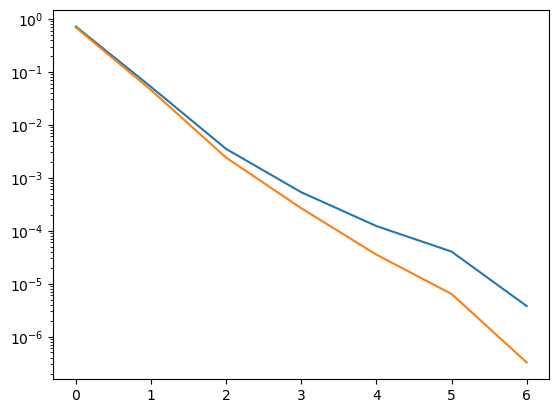

2-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x148a141c2cb0>
 PyObject <matplotlib.lines.Line2D object at 0x148a141c2ce0>

In [15]:
plt.semilogy(EKE12_nu0_kap0p125)

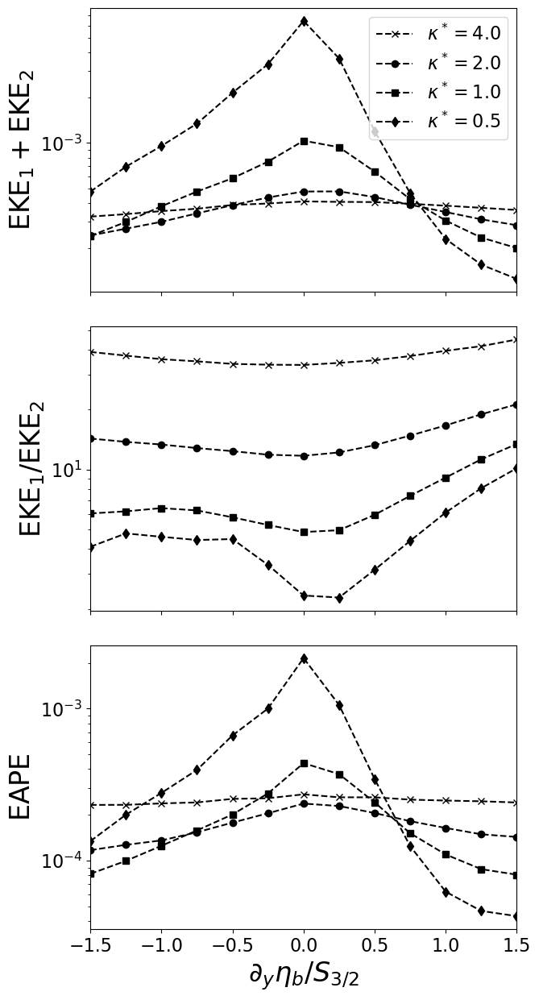

In [16]:
fig, ax = plt.subplots(3,1, figsize=(6,12))
fig.tight_layout(pad=1.0)

ax1=ax[1]; ax2=ax[2]; ax3=ax[3];

lsize = 24
tsize = 16

x = h0s ./ S32

############################################################################
ax1.plot(x, EKE12_nu0_kap4[:,1] .+ EKE12_nu0_kap4[:,2], color="k", marker="x", linestyle="--", label=L"\kappa^* = 4.0")
ax1.plot(x, EKE12_nu0_kap2[:,1] .+ EKE12_nu0_kap2[:,2], color="k", marker="o", linestyle="--", label=L"\kappa^* = 2.0")
ax1.plot(x, EKE12_nu0_kap1[:,1] .+ EKE12_nu0_kap1[:,2], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, EKE12_nu0_kap0p5[:,1] .+ EKE12_nu0_kap0p5[:,2], color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")

ax1.set_ylabel(L"\mathrm{EKE}_{1} + \mathrm{EKE}_{2}", fontsize=lsize)

ax1.set_xlim(x[1], x[end])

ax1.set_xticklabels([])
ax1.tick_params(labelsize=tsize)

ax1.legend(fontsize=tsize)

ax1.set_yscale("log")


###########################################################################
ax2.plot(x, EKE12_nu0_kap4[:,1] ./ EKE12_nu0_kap4[:,2], color="k", marker="x", linestyle="--", label=L"\kappa^* = 4.0")
ax2.plot(x, EKE12_nu0_kap2[:,1] ./ EKE12_nu0_kap2[:,2], color="k", marker="o", linestyle="--", label=L"\kappa^* = 2.0")
ax2.plot(x, EKE12_nu0_kap1[:,1] ./ EKE12_nu0_kap1[:,2], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax2.plot(x, EKE12_nu0_kap0p5[:,1] ./ EKE12_nu0_kap0p5[:,2], color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")

ax2.set_ylabel(L"\mathrm{EKE}_{1} / \mathrm{EKE}_{2}", fontsize=lsize)
ax2.set_xticklabels([])


ax2.set_xlim(x[1], x[end])

ax2.tick_params(labelsize=tsize)

ax2.set_yscale("log")

############################################################################
ax3.plot(x, EAPE12_nu0_kap4, color="k", marker="x", linestyle="--", label=L"\kappa^* = 4.0")
ax3.plot(x, EAPE12_nu0_kap2, color="k", marker="o", linestyle="--", label=L"\kappa^* = 2.0")
ax3.plot(x, EAPE12_nu0_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax3.plot(x, EAPE12_nu0_kap0p5, color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")


ax3.set_ylabel(L"\mathrm{EAPE}", fontsize=lsize)

ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax3.set_xlim(x[1], x[end])

ax3.tick_params(labelsize=tsize)

ax3.set_yscale("log")

############################################################################







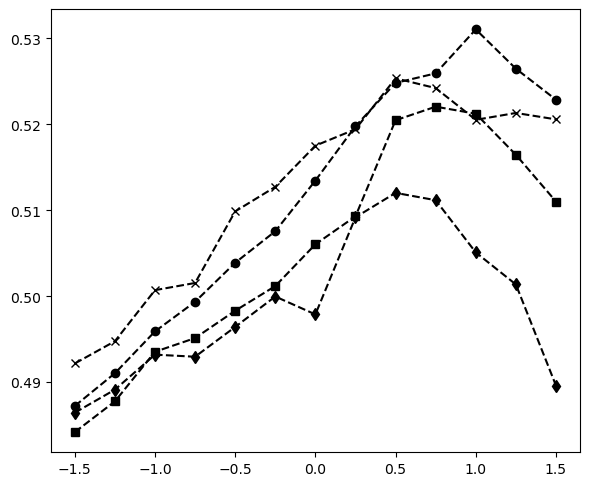

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x154410569510>

In [38]:
fig, ax1 = plt.subplots(1,1, figsize=(6,5))
fig.tight_layout(pad=1.0)

lsize = 24
tsize = 16

x = h0s ./ S32

function v_over_EKE(EKE_vec)
    return EKE_vec[:,2] ./ sum(EKE_vec, dims=2)
end

############################################################################
ax1.plot(x, v_over_EKE(EKEuv_nu0_kap4), color="k", marker="x", linestyle="--", label=L"\kappa^* = 4.0")
ax1.plot(x, v_over_EKE(EKEuv_nu0_kap2), color="k", marker="o", linestyle="--", label=L"\kappa^* = 2.0")
ax1.plot(x, v_over_EKE(EKEuv_nu0_kap1), color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, v_over_EKE(EKEuv_nu0_kap0p5), color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")


# Layer-wise k-space budget

In [5]:
using Statistics

function isotropic_mean(arr_in, grid)
    # arr_in: an nkr X nl array that is output of rfft
    # note that we only want real part of this
    
    dk = 2*pi/grid.Lx; dl = 2*pi/grid.Ly;
    
    dkr = sqrt(dk^2 + dl^2)
    
    wv = @. sqrt(grid.kr^2 + grid.l^2)
    
    iso = zeros(length(grid.kr))
    
    for i in range(1,length(grid.kr))
        # find 2D index values for a wavenumber magnitude
        if i==length(grid.kr)
            fkr = @. (wv>=grid.kr[i]) & (wv<=grid.kr[i]+dkr)
        else
            fkr = @. (wv>=grid.kr[i]) & (wv<grid.kr[i+1])
        end
        
        if sum(fkr) > 0
            iso[i] = mean(real(arr_in[fkr])) # this is average over all combinations of k_x and k_y that are the same, isotropic k
        end
        
    end

    return iso
end

isotropic_mean (generic function with 1 method)

In [31]:

function layerwise_spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool)

    nlayers=2
    topographic_pv_gradient = (0, (f₀/H[end]) * h0s[1])

    μ = μstar * (U[1]/2) / Ld
        
    prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
    μ, β, dt, stepper, aliased_fraction=1/3);

    sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

    Nh0 = length(h0s)
           
    NRGs_out = zeros(grid_jl.nkr, Nh0, 3)
    TKEh_out = zeros(grid_jl.nkr, Nh0,2)
    TPEh_out = zeros(grid_jl.nkr, Nh0,2)
    PPE1h_out = zeros(grid_jl.nkr, Nh0)
    L2PAh_out = zeros(grid_jl.nkr, Nh0,2)
    SPE1h_out = zeros(grid_jl.nkr, Nh0)
    BD2h_out = zeros(grid_jl.nkr, Nh0)
    
    for k in range(1,length(h0s))
        println(k)
            
        topographic_pv_gradient = (0, (f₀/H[end]) * h0s[k])
            
        prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
        μ, β, dt, stepper, aliased_fraction=1/3);

        sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

        GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        if μstar<1.55
            N_yr=90
        else
            N_yr = 90 # length(files)
        end
            
        ## pre-allocate
        window = Int(round(250 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 500 eddy-turnover times
        nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output
        
        NRGs_h0 = zeros(grid_jl.nkr, nmax, 3)
        TKEh_h0 = zeros(grid_jl.nkr, nmax, 2)
        TPEh_h0 = zeros(grid_jl.nkr, nmax, 2)
        PPE1h_h0 = zeros(grid_jl.nkr, nmax)
        L2PAh_h0 = zeros(grid_jl.nkr, nmax, 2)
        SPE1h_h0 = zeros(grid_jl.nkr, nmax)
        BD2h_h0 = zeros(grid_jl.nkr, nmax)

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)

            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                NRGs_h0[:,n,:], TKEh_h0[:,n,:], TPEh_h0[:,n,:], PPE1h_h0[:,n], L2PAh_h0[:,n,:], SPE1h_h0[:,n], BD2h_h0[:,n] = layer_spec_budget(prob, ψ,μstar, νstar, drag_bool);

                n+=1
            end
            GC.gc()
        end

        NRGs_out[:,k,:] = mean(NRGs_h0[:,1:n-1,:], dims=2)
        TKEh_out[:,k,:] = mean(TKEh_h0[:,1:n-1, :], dims=2)
        TPEh_out[:,k,:] = mean(TPEh_h0[:,1:n-1, :], dims=2)
        PPE1h_out[:,k] = mean(PPE1h_h0[:,1:n-1], dims=2)
        L2PAh_out[:,k,:] = mean(L2PAh_h0[:,1:n-1, :], dims=2)
        SPE1h_out[:,k] = mean(SPE1h_h0[:,1:n-1], dims=2)
        BD2h_out[:,k] = mean(BD2h_h0[:,1:n-1], dims=2)

    end
    
    return NRGs_out, TKEh_out, TPEh_out, PPE1h_out, L2PAh_out, SPE1h_out, BD2h_out
end


layerwise_spec_budget (generic function with 1 method)

In [32]:
function layer_spec_budget(vars, params, grid_jl, sol, ψ,μstar, νstar, drag_bool)

    # parameters
    nlayers = 2
    δ = [params.H[1]/sum(params.H), params.H[2]/sum(params.H)]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at each interface
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])
    H = sum(params.H)
    f0 = params.f₀ 
    
    # assigning basic variables
    vars.ψ .= ψ
    # vars.q .= q
    
    vars.ψh[:,:,1] .= rfft(vars.ψ[:,:,1])
    vars.ψh[:,:,2] .= rfft(vars.ψ[:,:,2])

    ψ1 = vars.ψ[:,:,1]
    ψ2 = vars.ψ[:,:,2]
    
    ψ1h = rfft(ψ1)
    ψ2h = rfft(ψ2)
    
    U₁, U₂, = view(params.U, :, :, 1), view(params.U, :, :, 2)
    
    S32 = params.f₀ * U₁[1,1] / g′

    # streamfunction stuff
    ∂xψ1h = im * grid_jl.kr .* ψ1h
    ∂yψ1h = im * grid_jl.l .* ψ1h
    
    ∂xψ1 = irfft(∂xψ1h, grid_jl.ny)
    ∂yψ1 = irfft(∂yψ1h, grid_jl.ny)

    ∂xψ2h = im * grid_jl.kr .* ψ2h
    ∂yψ2h = im * grid_jl.l .* ψ2h
    
    ∂xψ2 = irfft(∂xψ2h, grid_jl.ny)
    ∂yψ2 = irfft(∂yψ2h, grid_jl.ny)
    
    # nonlinear terms
    ζ = deepcopy(vars.v)
    ζ[:,:,1] .= irfft(-grid_jl.Krsq .* vars.ψh[:,:,1], grid_jl.ny)
    ζ[:,:,2] .= irfft(-grid_jl.Krsq .* vars.ψh[:,:,2], grid_jl.ny)
    ζ₁, ζ₂ = view(ζ, :, :, 1), view(ζ, :, :, 2)

    ζ1h = - grid_jl.Krsq .* ψ1h
    ζ2h = - grid_jl.Krsq .* ψ2h

    ζ1 = irfft(ζ1h,grid_jl.ny)
    ζ2 = irfft(ζ2h,grid_jl.ny)

    ∂xζ1h = im * grid_jl.kr .* ζ1h
    ∂xζ2h = im * grid_jl.kr .* ζ2h

    ∂yζ1h = im * grid_jl.l .* ζ1h
    ∂yζ2h = im * grid_jl.l .* ζ2h

    ∂xζ1 = irfft(∂xζ1h, grid_jl.ny)
    ∂xζ2 = irfft(∂xζ2h, grid_jl.ny)

    ∂yζ1 = irfft(∂yζ1h, grid_jl.ny)
    ∂yζ2 = irfft(∂yζ2h, grid_jl.ny)

    ########################################

    J_ψ1_ζ1 = @. ∂xψ1 * ∂yζ1 - ∂yψ1 * ∂xζ1
    J_ψ2_ζ2 = @. ∂xψ2 * ∂yζ2 - ∂yψ2 * ∂xζ2

    J_ψ1_ζ1h = rfft(J_ψ1_ζ1)
    J_ψ2_ζ2h = rfft(J_ψ2_ζ2)

    ########################################
    J_ψ1_ψ2 = @. ∂xψ1 * ∂yψ2 - ∂yψ1 * ∂xψ2

    J_ψ1_ψ2h = rfft(J_ψ1_ψ2)
    J_ψ2_ψ1h = -rfft(J_ψ1_ψ2)

    ########################################
    J_ψ2_ηb = @. ∂xψ2 .* ∂yηb

    J_ψ2_ηbh = rfft(J_ψ2_ηb)

    ############################################################################################
    EKE1 = @. 0.5 * (conj(ψ1h) * (grid_jl.kr^2 * ψ1h) + ψ1h * conj(grid_jl.kr^2 * ψ1h))

    EKE2 = @. 0.5 * grid_jl.kr^2 * (conj(ψ2h) * ψ2h + ψ2h * conj(ψ2h))
    EAPE = @. 0.5 * 2 * Ld1^-2 * (conj(ψ1h - ψ2h) * (ψ1h - ψ2h) + (ψ1h - ψ2h) * conj(ψ1h - ψ2h))

    
    ############################################################################################

    ############################################################################################
    # Layer-wise nonlinear KE transfer
    TKE = zeros(grid_jl.nkr,grid_jl.ny,2) .+ 0im
    TKE[:,:,1] = @. conj(ψ1h) * J_ψ1_ζ1h
    TKE[:,:,1] .+= conj.(TKE[:,:,1])

    TKE[:,:,2] = @. conj(ψ2h) * J_ψ2_ζ2h
    TKE[:,:,2] .+= conj.(TKE[:,:,2])

    ############################################################################################

    ############################################################################################
    # Layer-wise nonlinear PE transfer
    TPE = zeros(grid_jl.nkr,grid_jl.ny,2) .+ 0im
    TPE[:,:,1] = @. 0.5 * Ld^-2 * conj(ψ1h) * J_ψ1_ψ2h
    TPE[:,:,1] .+= conj.(TPE[:,:,1])

    TPE[:,:,2] = @. 0.5 * Ld^-2 * conj(ψ2h) * J_ψ2_ψ1h
    TPE[:,:,2] .+= conj.(TPE[:,:,2])

    ############################################################################################

    ############################################################################################
    # Upper layer linear PE production
    PPE1 = @. (2 * f0 * S32 / H) * conj(ψ1h) * ∂xψ2h
    PPE1 .+= conj.(PPE1)

    ############################################################################################

    ############################################################################################
    # Lower-layer perturbation advection of background PV gradient
    L2PA = zeros(grid_jl.nkr,grid_jl.ny,2) .+ 0im
    L2PA[:,:,1] = @. - (2 * f0 * S32 / H) * conj(ψ2h) * ∂xψ2h
    L2PA[:,:,1] .+= conj.(L2PA[:,:,1])

    L2PA[:,:,2] = @. (2 * f0 * ∂yηb / H) * conj(ψ2h) * ∂xψ2h
    L2PA[:,:,2] .+= conj.(L2PA[:,:,2])


    ############################################################################################

    ############################################################################################
    # Upper-layer linear PE production
    SPE1 = @. conj(ψ1h) * U₁ * ∂xζ1h
    SPE1 .+= conj.(SPE1)

    ###########################################################################################

    ############################################################################################
    # Bottom drag
    BD2 = @. conj(ψ2h) * params.μ * ζ2h
    BD2 .+= conj.(BD2)

    ############################################################################################
    # taking mean at each wavenumber magnitude, i.e., assuming isotropy
    TKEh = hcat(isotropic_mean(TKE[:,:,1], grid_jl), isotropic_mean(TKE[:,:,2], grid_jl))
    TKEh = dropdims(TKEh,dims=tuple(findall(size(TKEh).==1)...))

    TPEh = hcat(isotropic_mean(TPE[:,:,1], grid_jl), isotropic_mean(TPE[:,:,2], grid_jl))
    TPEh = dropdims(TPEh,dims=tuple(findall(size(TPEh).==1)...))

    PPE1h = isotropic_mean(PPE1[:,:,1], grid_jl)
    # PPE1h = dropdims(PPE1h,dims=tuple(findall(size(PPE1h).==1)...))

    L2PAh = hcat(isotropic_mean(L2PA[:,:,1], grid_jl), isotropic_mean(L2PA[:,:,2], grid_jl))
    L2PAh = dropdims(L2PAh,dims=tuple(findall(size(L2PAh).==1)...))    

    SPE1h = isotropic_mean(SPE1[:,:,1], grid_jl)
    # SPE1h = dropdims(SPE1h,dims=tuple(findall(size(SPE1h).==1)...))

    BD2h = isotropic_mean(BD2[:,:,1], grid_jl)

    NRGs = hcat(isotropic_mean(EKE1,grid_jl), isotropic_mean(EKE2,grid_jl), isotropic_mean(EAPE,grid_jl))
    NRGs = dropdims(NRGs,dims=tuple(findall(size(NRGs).==1)...))
    
    GC.gc()
   
  return NRGs, TKEh, TPEh, PPE1h, L2PAh, SPE1h, BD2h
end

layer_spec_budget(prob, ψ, μstar, νstar, drag_bool) = layer_spec_budget(prob.vars, prob.params, prob.grid, prob.sol, ψ,μstar, νstar, drag_bool)


layer_spec_budget (generic function with 2 methods)

In [38]:
μstar = 0.125
NRGs_nu0_kap0p125, TKEh_nu0_kap0p125, TPEh_nu0_kap0p125, PPE1h_nu0_kap0p125, L2PAh_nu0_kap0p125, SPE1h_nu0_kap0p125, BD2h_nu0_kap0p125 = layerwise_spec_budget(U,ρ,H,μ,h0s[7:end],μstar, νstar, drag_bool);


1
2
3
4
5
6
7


In [39]:
μstar = 0.25
NRGs_nu0_kap0p25, TKEh_nu0_kap0p25, TPEh_nu0_kap0p25, PPE1h_nu0_kap0p25, L2PAh_nu0_kap0p25, SPE1h_nu0_kap0p25, BD2h_nu0_kap0p25 = layerwise_spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [40]:
μstar = 0.5
NRGs_nu0_kap0p5, TKEh_nu0_kap0p5, TPEh_nu0_kap0p5, PPE1h_nu0_kap0p5, L2PAh_nu0_kap0p5, SPE1h_nu0_kap0p5, BD2h_nu0_kap0p5 = layerwise_spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [33]:
νstar = 0. # 10^-13
μstar = 1.0
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]

NRGs_nu0_kap1, TKEh_nu0_kap1, TPEh_nu0_kap1, PPE1h_nu0_kap1, L2PAh_nu0_kap1, SPE1h_nu0_kap1, BD2h_nu0_kap1 = layerwise_spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [41]:
μstar = 2.0
NRGs_nu0_kap2, TKEh_nu0_kap2, TPEh_nu0_kap2, PPE1h_nu0_kap2, L2PAh_nu0_kap2, SPE1h_nu0_kap2, BD2h_nu0_kap2 = layerwise_spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [42]:
μstar = 4.0
NRGs_nu0_kap4, TKEh_nu0_kap4, TPEh_nu0_kap4, PPE1h_nu0_kap4, L2PAh_nu0_kap4, SPE1h_nu0_kap4, BD2h_nu0_kap4 = layerwise_spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [26]:
using FileIO, JLD2

fn = data_dir*"layered_nrg_budget_kspace_nu0_kap0p125.jld"

# jld_data = Dict("NRGs_nu0_kap0p125" => NRGs_nu0_kap0p125,
#     "TKEh_nu0_kap0p125" => TKEh_nu0_kap0p125,
#     "TPEh_nu0_kap0p125" => TPEh_nu0_kap0p125,
#     "PPE1h_nu0_kap0p125" => PPE1h_nu0_kap0p125,
#     "L2PAh_nu0_kap0p125" => L2PAh_nu0_kap0p125,
#     "SPE1h_nu0_kap0p125" => SPE1h_nu0_kap0p125,
#     "BD2h_nu0_kap0p125" => BD2h_nu0_kap0p125)

# jldsave(fn; jld_data)


a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [27]:
using FileIO, JLD2

fn = data_dir*"layered_nrg_budget_kspace_nu0_kap0p25.jld"

# jld_data = Dict("NRGs_nu0_kap0p25" => NRGs_nu0_kap0p25,
#     "TKEh_nu0_kap0p25" => TKEh_nu0_kap0p25,
#     "TPEh_nu0_kap0p25" => TPEh_nu0_kap0p25,
#     "PPE1h_nu0_kap0p25" => PPE1h_nu0_kap0p25,
#     "L2PAh_nu0_kap0p25" => L2PAh_nu0_kap0p25,
#     "SPE1h_nu0_kap0p25" => SPE1h_nu0_kap0p25,
#     "BD2h_nu0_kap0p25" => BD2h_nu0_kap0p25)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [28]:
using FileIO, JLD2

fn = data_dir*"layered_nrg_budget_kspace_nu0_kap0p5.jld"

# jld_data = Dict("NRGs_nu0_kap0p5" => NRGs_nu0_kap0p5,
#     "TKEh_nu0_kap0p5" => TKEh_nu0_kap0p5,
#     "TPEh_nu0_kap0p5" => TPEh_nu0_kap0p5,
#     "PPE1h_nu0_kap0p5" => PPE1h_nu0_kap0p5,
#     "L2PAh_nu0_kap0p5" => L2PAh_nu0_kap0p5,
#     "SPE1h_nu0_kap0p5" => SPE1h_nu0_kap0p5,
#     "BD2h_nu0_kap0p5" => BD2h_nu0_kap0p5)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [29]:
using FileIO, JLD2

fn = data_dir*"layered_nrg_budget_kspace_nu0_kap1.jld"

# jld_data = Dict("NRGs_nu0_kap1" => NRGs_nu0_kap1,
#     "TKEh_nu0_kap1" => TKEh_nu0_kap1,
#     "TPEh_nu0_kap1" => TPEh_nu0_kap1,
#     "PPE1h_nu0_kap1" => PPE1h_nu0_kap1,
#     "L2PAh_nu0_kap1" => L2PAh_nu0_kap1,
#     "SPE1h_nu0_kap1" => SPE1h_nu0_kap1,
#     "BD2h_nu0_kap1" => BD2h_nu0_kap1)

# jldsave(fn; jld_data)


a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [30]:
using FileIO, JLD2

fn = data_dir*"layered_nrg_budget_kspace_nu0_kap2.jld"

# jld_data = Dict("NRGs_nu0_kap2" => NRGs_nu0_kap2,
#     "TKEh_nu0_kap2" => TKEh_nu0_kap2,
#     "TPEh_nu0_kap2" => TPEh_nu0_kap2,
#     "PPE1h_nu0_kap2" => PPE1h_nu0_kap2,
#     "L2PAh_nu0_kap2" => L2PAh_nu0_kap2,
#     "SPE1h_nu0_kap2" => SPE1h_nu0_kap2,
#     "BD2h_nu0_kap2" => BD2h_nu0_kap2)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [31]:
using FileIO, JLD2

fn = data_dir*"layered_nrg_budget_kspace_nu0_kap4.jld"

# jld_data = Dict("NRGs_nu0_kap4" => NRGs_nu0_kap4,
#     "TKEh_nu0_kap4" => TKEh_nu0_kap4,
#     "TPEh_nu0_kap4" => TPEh_nu0_kap4,
#     "PPE1h_nu0_kap4" => PPE1h_nu0_kap4,
#     "L2PAh_nu0_kap4" => L2PAh_nu0_kap4,
#     "SPE1h_nu0_kap4" => SPE1h_nu0_kap4,
#     "BD2h_nu0_kap4" => BD2h_nu0_kap4)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

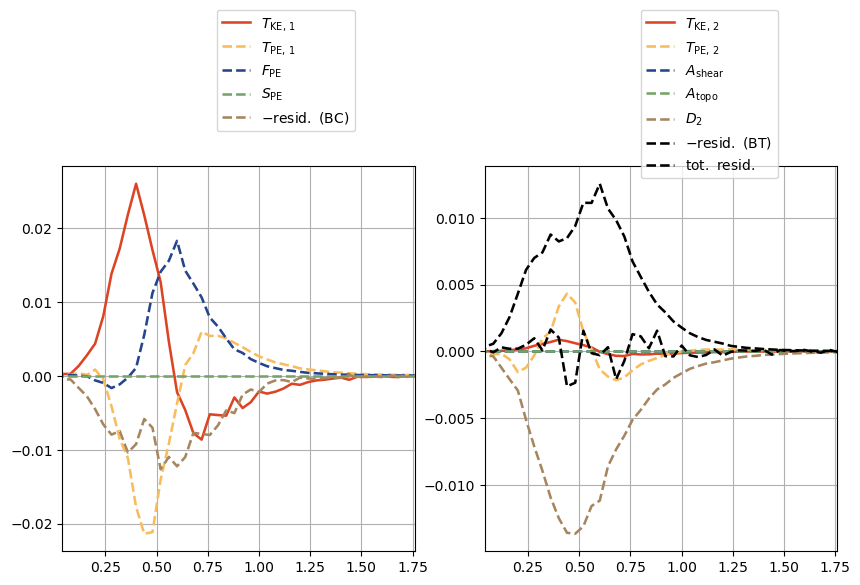

PyObject <matplotlib.legend.Legend object at 0x147e76fef820>

In [21]:
ls = ["-","--","-."]
lw = collect(range(0.5,5,11))
NLa = 1.0

cols2 = ["#dc4424", "#f8bc5c", "#24448c", "#74a466", "#a6865f", "black", "gray", "#cca4a0", "#756c8c", "#229943","#af01f3", "#53db00"];

h1_ind = 12

x = grid_jl.kr*Ld

xmax_ind = 45


# Layer1 energy budget
fig,ax = plt.subplots(1, 2, figsize=(10,5))
ax1=ax[1]; ax2=ax[2]; # mu=45^-1


##################################################################################################################
##################################################################################################################
# NRGs_nu0_kap1, TKEh_nu0_kap1, TPEh_nu0_kap1, PPE1h_nu0_kap1, L2PAh_nu0_kap1, SPE1h_nu0_kap1

ax1.plot(x, TKEh_nu0_kap1[:, h1_ind, 1], label=L"T_\mathrm{KE, \, 1}",linestyle=ls[1],color=cols2[1], linewidth=lw[4])
ax1.plot(x, TPEh_nu0_kap1[:, h1_ind, 1], label=L"T_\mathrm{PE, \, 1}",linestyle=ls[2],color=cols2[2], linewidth=lw[4])
ax1.plot(x, PPE1h_nu0_kap1[:, h1_ind, 1], label=L"F_\mathrm{PE}",linestyle=ls[2],color=cols2[3], linewidth=lw[4])
ax1.plot(x, SPE1h_nu0_kap1[:, h1_ind], label=L"S_\mathrm{PE}",linestyle=ls[2],color=cols2[4], linewidth=lw[4])


BC_resid = TKEh_nu0_kap1[:, h1_ind, 1] .+ TPEh_nu0_kap1[:, h1_ind, 1] .+ PPE1h_nu0_kap1[:, h1_ind] .+ SPE1h_nu0_kap1[:, h1_ind]
ax1.plot(x, -BC_resid, label=L"\mathrm{-resid. \ (BC) }",linestyle=ls[2],color=cols2[5], linewidth=lw[4])

ax1.set_xlim(x[2],x[xmax_ind])

ax1.grid()
ax1.legend(loc="upper right", bbox_to_anchor=(0.85,1.425))

# ax4.set_xscale("log")

################################################################################

########################################################################################

ax2.plot(x, TKEh_nu0_kap1[:, h1_ind, 2], label=L"T_\mathrm{KE, \, 2}",linestyle=ls[1],color=cols2[1], linewidth=lw[4])
ax2.plot(x, TPEh_nu0_kap1[:, h1_ind, 2], label=L"T_\mathrm{PE, \, 2}",linestyle=ls[2],color=cols2[2], linewidth=lw[4])
ax2.plot(x, L2PAh_nu0_kap1[:, h1_ind, 1], label=L"A_\mathrm{shear}",linestyle=ls[2],color=cols2[3], linewidth=lw[4])
ax2.plot(x, L2PAh_nu0_kap1[:, h1_ind, 2], label=L"A_\mathrm{topo}",linestyle=ls[2],color=cols2[4], linewidth=lw[4])

ax2.plot(x, BD2h_nu0_kap1[:, h1_ind], label=L"D_\mathrm{2}",linestyle=ls[2],color=cols2[5], linewidth=lw[4])

BT_resid = @. TKEh_nu0_kap1[:, h1_ind, 2] + TPEh_nu0_kap1[:, h1_ind, 2] + L2PAh_nu0_kap1[:, h1_ind, 1]+ L2PAh_nu0_kap1[:, h1_ind, 2] + BD2h_nu0_kap1[:, h1_ind]
ax2.plot(x, -BT_resid, label=L"\mathrm{-resid. \ (BT)}",linestyle=ls[2],color=cols2[6], linewidth=lw[4])

ax2.plot(x, BC_resid .+ BT_resid, label=L"\mathrm{tot. \ resid.}",linestyle=ls[2],color=cols2[6], linewidth=lw[4])

ax2.set_xlim(x[2],x[xmax_ind])

ax2.grid()
ax2.legend(loc="upper right", bbox_to_anchor=(0.85,1.425))


# ymax = maximum([ax4.get_ylim()[2], ax6.get_ylim()[2]])
# ymin = minimum([ax4.get_ylim()[1], ax6.get_ylim()[1]])

# ax1.set_ylim(ymin,ymax);
# ax6.set_ylim(ymin,ymax);

# ax4.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
# ax6.set_yticklabels([])


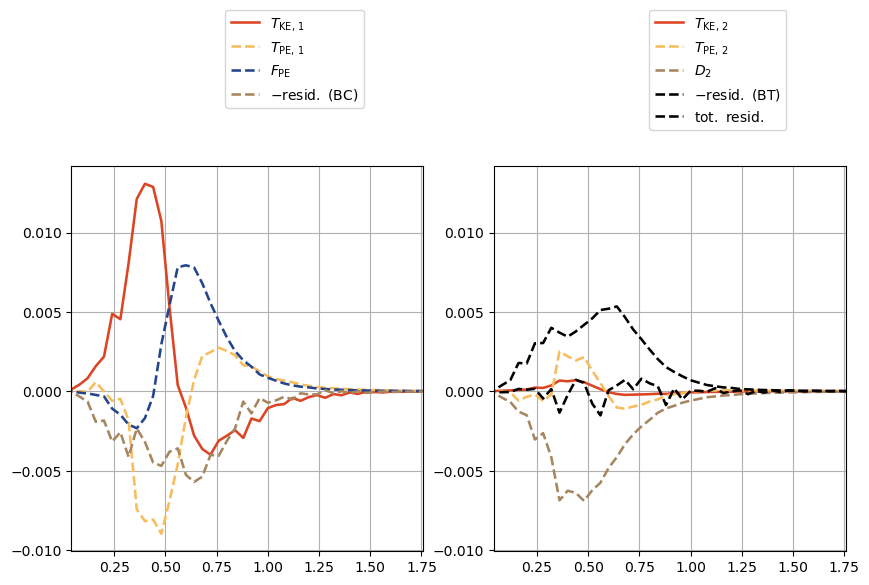

In [20]:
ls = ["-","--","-."]
lw = collect(range(0.5,5,11))
NLa = 1.0

cols2 = ["#dc4424", "#f8bc5c", "#24448c", "#74a466", "#a6865f", "black", "gray", "#cca4a0", "#756c8c", "#229943","#af01f3", "#53db00"];

h1_ind = 12

x = grid_jl.kr*Ld

xmax_ind = 45


# Layer1 energy budget
fig,ax = plt.subplots(1, 2, figsize=(10,5))
ax1=ax[1]; ax2=ax[2]; # mu=45^-1


##################################################################################################################
##################################################################################################################
# NRGs_nu0_kap0p5, TKEh_nu0_kap0p5, TPEh_nu0_kap0p5, PPE1h_nu0_kap0p5, L2PAh_nu0_kap0p5, SPE1h_nu0_kap0p5

ax1.plot(x, TKEh_nu0_kap0p5[:, h1_ind, 1], label=L"T_\mathrm{KE, \, 1}",linestyle=ls[1],color=cols2[1], linewidth=lw[4])
ax1.plot(x, TPEh_nu0_kap0p5[:, h1_ind, 1], label=L"T_\mathrm{PE, \, 1}",linestyle=ls[2],color=cols2[2], linewidth=lw[4])
ax1.plot(x, PPE1h_nu0_kap0p5[:, h1_ind, 1], label=L"F_\mathrm{PE}",linestyle=ls[2],color=cols2[3], linewidth=lw[4])
# ax1.plot(x, SPE1h_nu0_kap0p5[:, h1_ind], label=L"S_\mathrm{PE}",linestyle=ls[2],color=cols2[4], linewidth=lw[4])


BC_resid = TKEh_nu0_kap0p5[:, h1_ind, 1] .+ TPEh_nu0_kap0p5[:, h1_ind, 1] .+ PPE1h_nu0_kap0p5[:, h1_ind] .+ SPE1h_nu0_kap0p5[:, h1_ind]
ax1.plot(x, -BC_resid, label=L"\mathrm{-resid. \ (BC)}",linestyle=ls[2],color=cols2[5], linewidth=lw[4])

# EAPE_resid = CBC_nu0_kap4[:, h1_ind] .+ 2 * Drag_nu0_kap4[:, h1_ind,2] .+ NLBC_nu0_kap4[:,h1_ind,3]
# EKE_resid = -LF_nu0_kap4[:, h1_ind,1] .- LF_nu0_kap4[:, h1_ind,2] .- Drag_nu0_kap4[:, h1_ind,2] .+ NLBC_nu0_kap4[:,h1_ind,1] .+ NLBC_nu0_kap4[:,h1_ind,2]

# BC_resid = EAPE_resid .+ EKE_resid

# ax1.plot(x, BC_resid .* U[1]^-3, color=cols2[7], label=L"\mathrm{resid.}", linestyle=ls[3], linewidth=lw[2])

ax1.set_xlim(x[2],x[xmax_ind])

ax1.grid()
ax1.legend(loc="upper right", bbox_to_anchor=(0.85,1.425))

# ax4.set_xscale("log")

################################################################################

########################################################################################

ax2.plot(x, TKEh_nu0_kap0p5[:, h1_ind, 2], label=L"T_\mathrm{KE, \, 2}",linestyle=ls[1],color=cols2[1], linewidth=lw[4])
ax2.plot(x, TPEh_nu0_kap0p5[:, h1_ind, 2], label=L"T_\mathrm{PE, \, 2}",linestyle=ls[2],color=cols2[2], linewidth=lw[4])
# ax2.plot(x, L2PAh_nu0_kap0p5[:, h1_ind, 1], label=L"A_\mathrm{shear}",linestyle=ls[2],color=cols2[3], linewidth=lw[4])
# ax2.plot(x, L2PAh_nu0_kap0p5[:, h1_ind, 2], label=L"A_\mathrm{topo}",linestyle=ls[2],color=cols2[4], linewidth=lw[4])

ax2.plot(x, BD2h_nu0_kap0p5[:, h1_ind], label=L"D_\mathrm{2}",linestyle=ls[2],color=cols2[5], linewidth=lw[4])

BT_resid = @. TKEh_nu0_kap0p5[:, h1_ind, 2] + TPEh_nu0_kap0p5[:, h1_ind, 2] + L2PAh_nu0_kap0p5[:, h1_ind, 1]+ L2PAh_nu0_kap0p5[:, h1_ind, 2] + BD2h_nu0_kap0p5[:, h1_ind]
ax2.plot(x, -BT_resid, label=L"\mathrm{-resid. \ (BT)}",linestyle=ls[2],color=cols2[6], linewidth=lw[4])
ax2.plot(x, BC_resid .+ BT_resid, label=L"\mathrm{tot. \ resid.}",linestyle=ls[2],color=cols2[6], linewidth=lw[4])


ax2.set_xlim(x[2],x[xmax_ind])

ax2.grid()
ax2.legend(loc="upper right", bbox_to_anchor=(0.85,1.425))


ymax = maximum([ax1.get_ylim()[2], ax2.get_ylim()[2]])
ymin = minimum([ax1.get_ylim()[1], ax2.get_ylim()[1]])

ax1.set_ylim(ymin,ymax);
ax2.set_ylim(ymin,ymax);

# ax4.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
# ax6.set_yticklabels([])


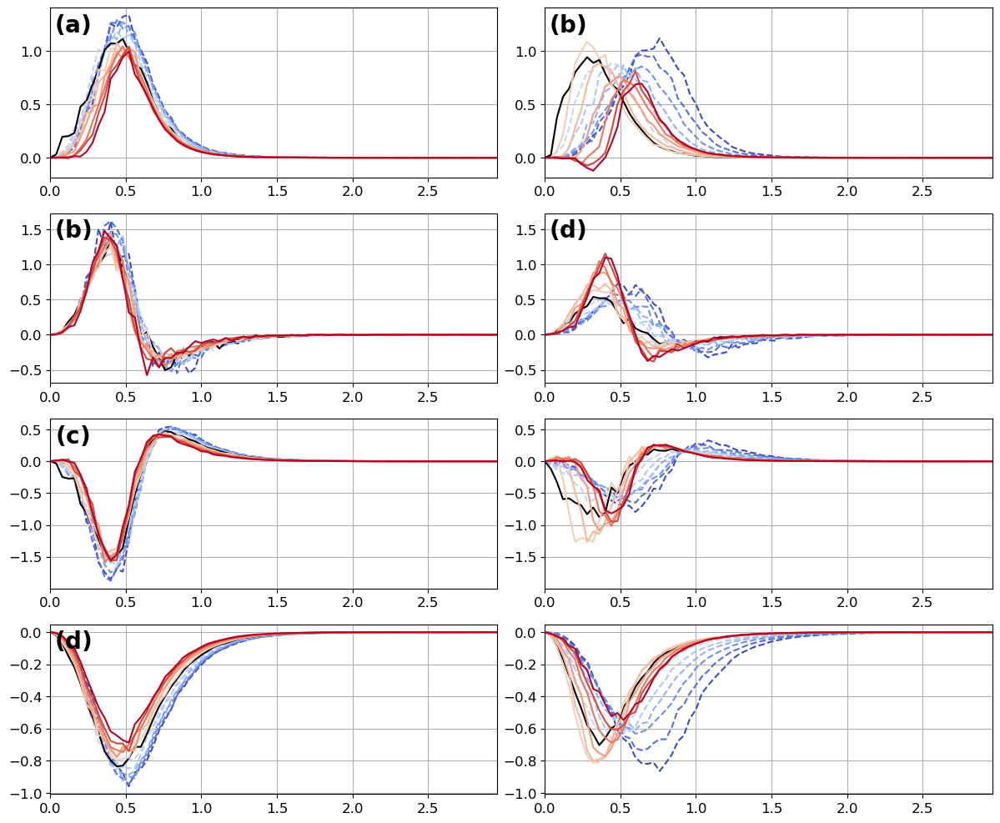

In [33]:

# a plot of KE_1 from all six combos of rho and U
fig,ax = PyPlot.subplots(4,2,figsize=(12,10))
fig.tight_layout(pad=1.0)

# ax1=ax[1]; ax2=ax[2];
# ax3=ax[3]; ax4=ax[4];


# h_ind=17

x = grid_jl.kr[1:75] .* 28325

fsize = 20
lsize = 12


####################################################################
h_ind = 7


# ax1.plot(x,ph12_kap0p5[h_ind,:],"k-", label=L"\kappa^* = 0.5")

# ax1.plot(x,ph12_kap1p0[h_ind,:],"k--", label=L"\kappa^* = 1.0")

# ax1.plot(x,ph12_kap2p0[h_ind,:],"k-.", label=L"\kappa^* = 2.0")

# ax1.plot(x,ph12_kap4p0[h_ind,:],"k", linestyle="dotted", label=L"\kappa^* = 4.0")

ax1.grid()

ax1.set_xlim(x[1], x[end])



####################################################################


# ax3.plot(x,phm_kap0p5[h_ind,:],"k-", label=L"\kappa^* = 0.5")

# ax3.plot(x,phm_kap1p0[h_ind,:],"k--", label=L"\kappa^* = 1.0")

# ax3.plot(x,phm_kap2p0[h_ind,:],"k-.", label=L"\kappa^* = 2.0")

# ax3.plot(x,phm_kap4p0[h_ind,:],"k", linestyle="dotted", label=L"\kappa^* = 4.0")

ax3.grid()

ax3.set_xlim(x[1], x[end])

# ax1.legend()



####################################################################
for i in range(1,length(ax))
    axn = ax[i]
    for h_ind in range(1,length(h0s))
        if h_ind<7
            lt = "dashed"
        elseif h_ind>=7
            lt="solid"
        end

        if i==1
            axn.plot(x, PPE1h_nu0_kap4[1:75,h_ind] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==2
            axn.plot(x, TKEh_nu0_kap4[1:75,h_ind, 1] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        elseif i==3
            axn.plot(x, TPEh_nu0_kap4[1:75,h_ind, 1] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==4
            axn.plot(x, BD2h_nu0_kap4[1:75,h_ind] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==5
              axn.plot(x, PPE1h_nu0_kap1[1:75,h_ind] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)         

        elseif i==6

            axn.plot(x, TKEh_nu0_kap1[1:75,h_ind, 1] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        elseif i==7
            axn.plot(x, TPEh_nu0_kap1[1:75,h_ind, 1] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==8
            axn.plot(x, BD2h_nu0_kap1[1:75,h_ind] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        end

    GC.gc()
    end
    axn.grid()
    axn.set_xlim(x[1], x[end])
    
end


####################################################################################
ax1.set_xticklabels([])
ax3.set_xticklabels([])

ax1.legend(fontsize=lsize)


# ax1.set_title(L"\Delta \phi_{1,2; \, k_{x}}", fontsize=fsize)
# ax2.set_ylabel(L"\Delta \phi_{1,2; \, k_{x}}")

# ax3.set_title(L"\Delta \phi_{\tau, \psi; \, k_{x}}", fontsize=fsize)
# ax4.set_ylabel(L"\Delta \phi_{\tau, \psi; \, k_{x}}")


ax2.set_xlabel(L" k_{x} \cdot \lambda", fontsize=fsize)

ax4.set_xlabel(L" k_{x} \cdot \lambda", fontsize=fsize)


ax3.set_ylim(ax3.get_ylim()[1],1.2)

ax[1].text(0.05, 0.9, L"\mathbf{(a)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[2].text(0.05, 0.9, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[2].transAxes);
ax[3].text(0.05, 0.9, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[3].transAxes);
ax[4].text(0.05, 0.9, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[4].transAxes);
ax[5].text(0.05, 0.9, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[5].transAxes);
ax[6].text(0.05, 0.9, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[6].transAxes);

for a in ax
    # a.set_xlim(x[2],x[end])
    # a.set_xscale("log")
    a.tick_params(labelsize=lsize)
end

for i in range(1,size(ax)[1])
    ymax = maximum([ax[i].get_ylim()[2], ax[i+size(ax)[1]].get_ylim()[2]])
    ymin = minimum([ax[i].get_ylim()[1], ax[i+size(ax)[1]].get_ylim()[1]])

    ax[i].set_ylim(ymin, ymax)
    ax[i+size(ax)[1]].set_ylim(ymin, ymax)
end
# ax4.set_yscale("symlog")
# savefig("./figs/dd_paper_figs/phase_shift_panels.pdf",bbox_inches="tight", transparent=true)


# negative phase shifts for the positive slopes at large wavenumbers corresponds
# to the slight forward cascade seen in their spectra

# will we see same thing for flat-bottom as drag is varied?

In [39]:
sum(EKEuv_nu0_kap1, dims=2)

13×1 Matrix{Float64}:
 0.0002422659211992333
 0.00029959140236415186
 0.00038068648746033396
 0.00047644750024647886
 0.0005837899120296193
 0.0007522510100048988
 0.001035145938251554
 0.0009371317633905048
 0.0006461013084296882
 0.00042399734329639187
 0.0003059327346014988
 0.00023606838480532324
 0.0002013117324650224

# Modal x-space energy budget

In [7]:
νstar = 0.
μstar = 0.125   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

    
for k in range(1,length(h0s))

    file1 = jld_name2(data_dir,μstar, νstar, drag_bool,L, h0s[k],ρ,U,Nx,H,1)
    files = glob(file1[34:end-5]*"*", data_dir)

    N_yr = length(files)


    
    println(N_yr)
end
    

0
0
0
0
94
0
14
90
90
90
90
90
90


In [5]:
using Statistics

function modal_nrgfluxes(vars, params, grid, sol, ψ)

    nlayers = 2
    δ = params.H[1]/params.H[2]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at the interface
    μ = params.μ
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])

    vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    vars.ψh[:,:,2] = rfft(ψ[:,:,2])

    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])

    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)

    ∂xψBC = irfft(im * grid.kr .* ψBCh, grid.ny)
    ∂xψBT = irfft(im * grid.kr .* ψBTh, grid.ny)

    ∂yψBC = irfft(im * grid.l .* ψBCh, grid.ny)
    ∂yψBT = irfft(im * grid.l .* ψBTh, grid.ny)
    
    ζ = zeros(grid.nx, grid.ny, 2)   # irfft(- grid.Krsq .* ψh, grid.nx)
    ζ[:,:,1] = irfft(- grid.Krsq .* vars.ψh[:,:,1], grid.nx)
    ζ[:,:,2] = irfft(- grid.Krsq .* vars.ψh[:,:,2], grid.nx)

    ∂xζ1 = irfft(im * grid.kr .* rfft(ζ[:,:,1]), grid.ny)

    ζBC = irfft(- grid.Krsq .* ψBCh, grid.nx)  # BC
    ζBT = irfft(- grid.Krsq .* ψBTh, grid.nx)   # BT

    ∂xζBC = irfft(im * grid.kr .* rfft(ζBC), grid.ny)
    ∂yζBC = irfft(im * grid.l  .* rfft(ζBC), grid.ny)
    
    ∂xζBT = irfft(im * grid.kr .* rfft(ζBT), grid.ny)
    ∂yζBT = irfft(im * grid.l  .* rfft(ζBT), grid.ny)
    
    
#     vertfluxes, dragfluxes = zeros(grid.nkr,nlayers), zeros(grid.nkr,nlayers+1)

    U₁, U₂ = view(params.U, :, :, 1), view(params.U, :, :, 2)
    
    S32 = params.f₀ * U₁[1,1] ./ g′

    # Linear modal transfer terms
    LT = zeros(grid.nx,grid.ny,2)
    LT[:,:,1] = @. 0.5 * ψBT * U₁ * ∂xζ1   # BC to BT
    LT[:,:,2] = @. 0.5 * U₁ * ψBC * ∂xζBT # alternate def. of line above; checking for equality
    
    # LT[:,:,2] = @. 0.5 * ψBC * U₁ * ∂xζ1   # BT to BC

    # Topo transfer term
    TT = - 0.5 * ∂yηb * (params.f₀ / params.H[2]) .* ψBT .* ∂xψBC
    # k-space version: -0.5 * (params.f₀ / params.H[2]) * ∂yηb * (conj(ψBTh) * ∂xψBCh + ψBTh * conj(∂xψBCh))
    
    # Baroclinic production term
    BC = (params.f₀ / params.H[1]) * S32 .* ψBC .* ∂xψBT

    # Nonlinear terms, 
    # psi J(tau, zetaBC)
    NL = zeros(grid.nx,grid.ny,4)
    
    NL[:,:,1] = ψBT .* (∂xψBC .* ∂yζBC .- ∂yψBC .* ∂xζBC)  # NL BT <--> BC (EKE)
    NL[:,:,2] = ψBT .* (∂xψBT .* ∂yζBT .- ∂yψBT .* ∂xζBT)   # NL BT (EKE)
    NL[:,:,3] = ψBC .* (∂xψBC .* ∂yζBT .- ∂yψBC .* ∂xζBT)   # NL BC 2 (EKE)
    NL[:,:,3] = ψBC .* Ld^-2 .* (∂xψBT .* ∂yψBC .- ∂yψBT .* ∂xψBC)    # NL BC 3 (EAPE)
    
    
    # Drag terms
    DS = zeros(grid.nx,grid.ny,2)
    DS[:,:,1] = @. - (μ/2) * ψBT .* (ζBC .- ζBT)     # BT drag term
    DS[:,:,2] = @. (μ/2) * ψBC .* (ζBC .- ζBT)      # BC drag term    
    
    # integrating in y
    LT = dropdims(sum(dropdims(sum(LT,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    TT = sum(TT) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    BC = sum(BC) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    NL = dropdims(sum(dropdims(sum(NL,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    DS = dropdims(sum(dropdims(sum(DS,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    resid = BC + sum(DS)
    
    # energies
    BTKE = 0.5 * sum(∂xψBT.^2 .+ ∂yψBT.^2) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    BCKE = 0.5 * sum(∂xψBC.^2 .+ ∂yψBC.^2) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    BCEAPE = 2 * Ld1^-2 * sum(ψBC .* ψBC)  * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    return LT, TT, BC, NL, DS, BTKE, BCKE, BCEAPE, resid

end

modal_nrgfluxes(prob, ψ) = modal_nrgfluxes(prob.vars, prob.params, prob.grid, prob.sol, ψ)


modal_nrgfluxes (generic function with 2 methods)

In [6]:
filt_order = 4
innerK= 2/3


function nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx)

    LT_out = zeros(length(h0s),2)
    TT_out = zeros(length(h0s))
    BC_out = zeros(length(h0s))
    NL_out = zeros(length(h0s), 4)
    DS_out = zeros(length(h0s),2)
    BTEKE_out = zeros(length(h0s))
    BCEKE_out = zeros(length(h0s))
    BCEAPE_out = zeros(length(h0s))
    resid_out = zeros(length(h0s))

    if drag_bool==false
        mm = μstar * (U[1] / 2) / Ld
    else
        mm = μstar / Ld
    end
    
    for k in range(1,length(h0s))
        
        topographic_pv_gradient = (0, (f₀/H[end]) * h0s[k])
            
        prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
        μ=mm, β, dt, stepper, aliased_fraction=1/3,drag_bool, filt_order, innerK)

        sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

        GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool,L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        if μstar < 1.55
            N_yr = 90 # round(Int, (length(files)-2)/2)
        else
            N_yr = 90 #length(files)
        end

        
        println(N_yr)
        # yrs = collect(range(1,N_yr))
            
        ## pre-allocate
        window = Int(round(250 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times
        nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output
        
        LT0 = zeros(nmax,2)
        TT0 = zeros(nmax)
        BC0 = zeros(nmax)
        NL0 = zeros(nmax,4)
        DS0 = zeros(nmax,2)
        BTEKE0 = zeros(nmax)
        BCEKE0 = zeros(nmax)
        BCEAPE0 = zeros(nmax)
        resid0 = zeros(nmax)

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)
            
            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                LT, TT, BC, NL, DS, BTEKE, BCEKE, BCEAPE, resid = modal_nrgfluxes(prob,ψ)

                LT0[n,:] = LT'
                TT0[n] = TT
                BC0[n] = BC
                NL0[n,:] = NL'
                DS0[n,:] = DS'
                BTEKE0[n] = BTEKE
                BCEKE0[n] = BCEKE
                BCEAPE0[n] = BCEAPE
                resid0[n] = resid               
                    
                n+=1
            end

            GC.gc()

        end

        LT_out[k,:] = mean(LT0[1:n-1,:],dims=1)
        TT_out[k] = mean(TT0[1:n-1])
        BC_out[k] = mean(BC0[1:n-1])
        NL_out[k,:] = mean(NL0[1:n-1,:],dims=1)
        DS_out[k,:] = mean(DS0[1:n-1,:],dims=1)
        BTEKE_out[k] = mean(BTEKE0[1:n-1])
        BCEKE_out[k] = mean(BCEKE0[1:n-1])
        BCEAPE_out[k] = mean(BCEAPE0[1:n-1])
        resid_out[k] = mean(resid0[1:n-1])

        GC.gc()

    end
    
    return LT_out, TT_out, BC_out, NL_out, DS_out, BTEKE_out, BCEKE_out, BCEAPE_out, resid_out
end


nrg_budget (generic function with 1 method)

## Analysis for paper figure

In [31]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

# LT_nu0_kap1, TT_nu0_kap1, BC_nu0_kap1, NL_nu0_kap1, DS_nu0_kap1, BTEKE_nu0_kap1, BCEKE_nu0_kap1, BCEAPE_nu0_kap1, resx_nu0_kap1 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);



4.449286275031877e6

In [40]:
μstar = 0.5

LT_nu0_kap0p5, TT_nu0_kap0p5, BC_nu0_kap0p5, NL_nu0_kap0p5, DS_nu0_kap0p5, BTEKE_nu0_kap0p5, BCEKE_nu0_kap0p5, BCEAPE_nu0_kap0p5, resx_nu0_kap0p5 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90
90
90
90
90
90
90


In [41]:
νstar = 10^-15
μstar = 1.0

LT_nu1Em15_kap1, TT_nu1Em15_kap1, BC_nu1Em15_kap1, NL_nu1Em15_kap1, DS_nu1Em15_kap1, BTEKE_nu1Em15_kap1, BCEKE_nu1Em15_kap1, BCEAPE_nu1Em15_kap1, resx_nu1Em15_kap1 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);



90
90
90
90
90
90
90
90
90
90
90
90
90


In [47]:
νstar = 0.

μstar = 2.0

LT_nu0_kap2, TT_nu0_kap2, BC_nu0_kap2, NL_nu0_kap2, DS_nu0_kap2, BTEKE_nu0_kap2, BCEKE_nu0_kap2, BCEAPE_nu0_kap2, resx_nu0_kap2 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90
90
90
90
90
90
90


In [20]:
μstar = 4.0

LT_nu0_kap4, TT_nu0_kap4, BC_nu0_kap4, NL_nu0_kap4, DS_nu0_kap4, BTEKE_nu0_kap4, BCEKE_nu0_kap4, BCEAPE_nu0_kap4, resx_nu0_kap4 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);



90
90
90
90
90
90
90
90
90
90
90
90
90


In [14]:
μstar = 0.125

LT_nu0_kap0p125, TT_nu0_kap0p125, BC_nu0_kap0p125, NL_nu0_kap0p125, DS_nu0_kap0p125, BTEKE_nu0_kap0p125, BCEKE_nu0_kap0p125, BCEAPE_nu0_kap0p125, resx_nu0_kap0p125 = nrg_budget(U,ρ,H,h0s[7:end],μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90


In [9]:
νstar = 0.
μstar = 0.25  # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

LT_nu0_kap0p25, TT_nu0_kap0p25, BC_nu0_kap0p25, NL_nu0_kap0p25, DS_nu0_kap0p25, BTEKE_nu0_kap0p25, BCEKE_nu0_kap0p25, BCEAPE_nu0_kap0p25, resx_nu0_kap0p25 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90
90
90
90
90
90
90


In [34]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = true

Nx=1024

L=Lx=25*2*pi*Ld

# LT_nu0_mu1, TT_nu0_mu1, BC_nu0_mu1, NL_nu0_mu1, DS_nu0_mu1, BTEKE_nu0_mu1, BCEKE_nu0_mu1, BCEAPE_nu0_mu1, resx_nu0_mu1 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);



4.449286275031877e6

In [7]:
νstar = 0.
μstar = 0.5   # 1.0 # 
drag_bool = true

Nx=1024

L=Lx=25*2*pi*Ld

LT_nu0_mu0p5, TT_nu0_mu0p5, BC_nu0_mu0p5, NL_nu0_mu0p5, DS_nu0_mu0p5, BTEKE_nu0_mu0p5, BCEKE_nu0_mu0p5, BCEAPE_nu0_mu0p5, resx_nu0_mu0p5 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90
90
90
90
90
90
90


In [8]:
νstar = 0.
μstar = 0.25   # 1.0 # 
drag_bool = true

Nx=1024

L=Lx=25*2*pi*Ld

LT_nu0_mu0p25, TT_nu0_mu0p25, BC_nu0_mu0p25, NL_nu0_mu0p25, DS_nu0_mu0p25, BTEKE_nu0_mu0p25, BCEKE_nu0_mu0p25, BCEAPE_nu0_mu0p25, resx_nu0_mu0p25 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90
90
90
90
90
90
90


In [45]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_kap1.jld"

# jld_data = Dict("LT_nu0_kap1" => LT_nu0_kap1, "TT_nu0_kap1" => TT_nu0_kap1, "BC_nu0_kap1" => BC_nu0_kap1,
#     "DS_nu0_kap1" => DS_nu0_kap1, "BTEKE_nu0_kap1" => BTEKE_nu0_kap1, "BCEKE_nu0_kap1" => BCEKE_nu0_kap1,
#     "NL_nu0_kap1" => NL_nu0_kap1, "BCEAPE_nu0_kap1" => BCEAPE_nu0_kap1, "resx_nu0_kap1" => resx_nu0_kap1)

# jldsave(fn; jld_data)


a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [38]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_kap0p5.jld"

# jld_data = Dict("LT_nu0_kap0p5" => LT_nu0_kap0p5, "TT_nu0_kap0p5" => TT_nu0_kap0p5, "BC_nu0_kap0p5" => BC_nu0_kap0p5,
#     "DS_nu0_kap0p5" => DS_nu0_kap0p5, "BTEKE_nu0_kap0p5" => BTEKE_nu0_kap0p5, "BCEKE_nu0_kap0p5" => BCEKE_nu0_kap0p5,
#     "NL_nu0_kap0p5" => NL_nu0_kap0p5, "BCEAPE_nu0_kap0p5" => BCEAPE_nu0_kap0p5, "resx_nu0_kap0p5" => resx_nu0_kap0p5)
    
# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [37]:
# using FileIO, JLD2

# fn = data_dir*"modal_nrg_budget_xspace_nu1Em15_kap1.jld"

# # jld_data = Dict("LT_nu1Em15_kap1" => LT_nu1Em15_kap1, "TT_nu1Em15_kap1" => TT_nu1Em15_kap1, "BC_nu1Em15_kap1" => BC_nu1Em15_kap1,
# #     "DS_nu1Em15_kap1" => DS_nu1Em15_kap1, "BTEKE_nu1Em15_kap1" => BTEKE_nu1Em15_kap1, "BCEKE_nu1Em15_kap1" => BCEKE_nu1Em15_kap1,
# #     "NL_nu1Em15_kap1" => NL_nu1Em15_kap1, "BCEAPE_nu1Em15_kap1" => BCEAPE_nu1Em15_kap1, "resx_nu1Em15_kap1" => resx_nu1Em15_kap1)
    
# # jldsave(fn; jld_data)

# a = load(fn);

# for (k,v) in a["jld_data"]
#     @eval $(Symbol(k)) = $(v)
# end


In [33]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_kap2.jld"

# jld_data = Dict("LT_nu0_kap2" => LT_nu0_kap2, "TT_nu0_kap2" => TT_nu0_kap2, "BC_nu0_kap2" => BC_nu0_kap2,
#     "DS_nu0_kap2" => DS_nu0_kap2, "BTEKE_nu0_kap2" => BTEKE_nu0_kap2, "BCEKE_nu0_kap2" => BCEKE_nu0_kap2,
#     "NL_nu0_kap2" => NL_nu0_kap2, "BCEAPE_nu0_kap2" => BCEAPE_nu0_kap2, "resx_nu0_kap2" => resx_nu0_kap2)
    
# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [34]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_kap4.jld"

# jld_data = Dict("LT_nu0_kap4" => LT_nu0_kap4, "TT_nu0_kap4" => TT_nu0_kap4, "BC_nu0_kap4" => BC_nu0_kap4,
#     "DS_nu0_kap4" => DS_nu0_kap4, "BTEKE_nu0_kap4" => BTEKE_nu0_kap4, "BCEKE_nu0_kap4" => BCEKE_nu0_kap4,
#     "NL_nu0_kap4" => NL_nu0_kap4, "BCEAPE_nu0_kap4" => BCEAPE_nu0_kap4, "resx_nu0_kap4" => resx_nu0_kap4)
    
# jldsave(fn; jld_data)


a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [35]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_kap0p25.jld"

# jld_data = Dict("LT_nu0_kap0p25" => LT_nu0_kap0p25, "TT_nu0_kap0p25" => TT_nu0_kap0p25, "BC_nu0_kap0p25" => BC_nu0_kap0p25,
#     "DS_nu0_kap0p25" => DS_nu0_kap0p25, "BTEKE_nu0_kap0p25" => BTEKE_nu0_kap0p25, "BCEKE_nu0_kap0p25" => BCEKE_nu0_kap0p25,
#     "NL_nu0_kap0p25" => NL_nu0_kap0p25, "BCEAPE_nu0_kap0p25" => BCEAPE_nu0_kap0p25, "resx_nu0_kap0p25" => resx_nu0_kap0p25)
    
# jldsave(fn; jld_data)


a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [36]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_kap0p125.jld"

# jld_data = Dict("LT_nu0_kap0p125" => LT_nu0_kap0p125, "TT_nu0_kap0p125" => TT_nu0_kap0p125, "BC_nu0_kap0p125" => BC_nu0_kap0p125,
#     "DS_nu0_kap0p125" => DS_nu0_kap0p125, "BTEKE_nu0_kap0p125" => BTEKE_nu0_kap0p125, "BCEKE_nu0_kap0p125" => BCEKE_nu0_kap0p125,
#     "NL_nu0_kap0p125" => NL_nu0_kap0p125, "BCEAPE_nu0_kap0p125" => BCEAPE_nu0_kap0p125, "resx_nu0_kap0p125" => resx_nu0_kap0p125)
    
# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end



In [11]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_mu1.jld"

# jld_data = Dict("LT_nu0_mu1" => LT_nu0_mu1, "TT_nu0_mu1" => TT_nu0_mu1, "BC_nu0_mu1" => BC_nu0_mu1,
#     "DS_nu0_mu1" => DS_nu0_mu1, "BTEKE_nu0_mu1" => BTEKE_nu0_mu1, "BCEKE_nu0_mu1" => BCEKE_nu0_mu1,
#     "NL_nu0_mu1" => NL_nu0_mu1, "BCEAPE_nu0_mu1" => BCEAPE_nu0_mu1, "resx_nu0_mu1" => resx_nu0_mu1)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [11]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_mu0p5.jld"

jld_data = Dict("LT_nu0_mu0p5" => LT_nu0_mu0p5, "TT_nu0_mu0p5" => TT_nu0_mu0p5, "BC_nu0_mu0p5" => BC_nu0_mu0p5,
    "DS_nu0_mu0p5" => DS_nu0_mu0p5, "BTEKE_nu0_mu0p5" => BTEKE_nu0_mu0p5, "BCEKE_nu0_mu0p5" => BCEKE_nu0_mu0p5,
    "NL_nu0_mu0p5" => NL_nu0_mu0p5, "BCEAPE_nu0_mu0p5" => BCEAPE_nu0_mu0p5, "resx_nu0_mu0p5" => resx_nu0_mu0p5)

jldsave(fn; jld_data)


In [12]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_xspace_nu0_mu0p25.jld"

jld_data = Dict("LT_nu0_mu0p25" => LT_nu0_mu0p25, "TT_nu0_mu0p25" => TT_nu0_mu0p25, "BC_nu0_mu0p25" => BC_nu0_mu0p25,
    "DS_nu0_mu0p25" => DS_nu0_mu0p25, "BTEKE_nu0_mu0p25" => BTEKE_nu0_mu0p25, "BCEKE_nu0_mu0p25" => BCEKE_nu0_mu0p25,
    "NL_nu0_mu0p25" => NL_nu0_mu0p25, "BCEAPE_nu0_mu0p25" => BCEAPE_nu0_mu0p25, "resx_nu0_mu0p25" => resx_nu0_mu0p25)

jldsave(fn; jld_data)


# Modal x-space archive

In [18]:
νstar = 10^-13
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=512

L=Lx=25*2*pi*Ld


# have to change jld_name2() to #jld_name()

LT_nu1em13_kap1, TT_nu1em13_kap1, BC_nu1em13_kap1, DS_nu1em13_kap1, BTEKE_nu1em13_kap1, BCEKE_nu1em13_kap1, BCEAPE_nu1em13_kap1, resid_nu1em13_kap1 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


# a = load(jld_name(data_dir,μstar, νstar, drag_bool, L, h0s[5],ρ,U,Nx,H,1))

# a["jld_data"]["L"]/2/pi/Ld

105
102
100
98
98
98
98
98
98
98
99
104
109


In [17]:
νstar = 10^-14
μstar = 1.0   # 1.0 # 
drag_bool = false

LT_nu1em14_kap1, TT_nu1em14_kap1, BC_nu1em14_kap1, DS_nu1em14_kap1, BTEKE_nu1em14_kap1, BCEKE_nu1em14_kap1, BCEAPE_nu1em14_kap1, resid_nu1em14_kap1 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


In [24]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=512

L=Lx=50*2*pi*Ld

# println(now())
LT_nu0_kap1, TT_nu0_kap1, BC_nu0_kap1, DS_nu0_kap1, BTEKE_nu0_kap1, BCEKE_nu0_kap1, BCEAPE_nu0_kap1, resid_nu0_kap1 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);
# println(now())


104
102
102
100
99
98
98
98
98
98
100
104
109


In [71]:
using Dates

In [47]:
ρ

2-element Vector{Float64}:
 1025.1725
 1025.75

In [17]:
νstar = 0. # 10^-13
μstar = 0.5   # 0.003 # 
drag_bool = false
L=Lx=25*2*pi*Ld

Nx=1024
# this with drag_bool false versus true shows difference between linear versus quad drag for EKE BC/BT.

LT_nu1em13_mu1, TT_nu1em13_mu1, BC_nu1em13_mu1, DS_nu1em13_mu1, BTEKE_nu1em13_mu1, BCEKE_nu1em13_mu1, BCEAPE_nu1em13_mu1, resid_nu1em13_mu1 = nrg_budget(U,ρ,H,h0s[1:5],μstar, νstar, drag_bool,L,Nx);


70
70
70
70
70


In [7]:
νstar = 0. # 10^-13
μstar = 0.003 # 1.0   # 
drag_bool = true

# this with drag_bool false versus true shows difference between linear versus quad drag for EKE BC/BT.

LT_nu1em13_mu0p003, TT_nu1em13_mu0p003, BC_nu1em13_mu0p003, DS_nu1em13_mu0p003, BTEKE_nu1em13_mu0p003, BCEKE_nu1em13_mu0p003, BCEAPE_nu1em13_mu0p003, resid_nu1em13_mu0p003 = nrg_budget(U,ρ,H,h0s,μstar, νstar, drag_bool, L);


In [21]:
function nrg_norm(h0s, μstar, νstar, drag_bool, L)

    norm = zeros(length(h0s),)
    
    for k in range(1,length(h0s))
        file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)
        
        if μstar < 1.55
            N_yr = 90 # round(Int, (length(files)-2)/2)
        else
            N_yr = length(files)
        end
        
        a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,N_yr))
            
        s = size(a["jld_data"]["psi_ot"])
        
        if length(s)>3
            ψ = a["jld_data"]["psi_ot"][:,:,:,end]
        else
            ψ = a["jld_data"]["psi_ot"]
        end   
        
        ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
        ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])
    
        ψBCh = rfft(ψBC)
        ψBTh = rfft(ψBT)
    
        ∂xψBC = irfft(im * grid_jl.kr .* ψBCh, grid_jl.ny)
        ∂xψBT = irfft(im * grid_jl.kr .* ψBTh, grid_jl.ny)
    
        ∂yψBC = irfft(im * grid_jl.l .* ψBCh, grid_jl.ny)
        ∂yψBT = irfft(im * grid_jl.l .* ψBTh, grid_jl.ny)
    
        uBT = irfft(- im * grid_jl.l .* rfft(ψBT), grid_jl.ny)

        vBT = irfft( im * grid_jl.kr .* rfft(ψBT), grid_jl.ny)
    
        norm[k] = (sqrt(mean(uBT.^2 .+ vBT.^2))^3 / Ld)^-1
        
        ########################################################################################### 
    
    end
    return norm
end


nrg_norm (generic function with 1 method)

In [22]:
νstar = 0. # 10^-13
μstar = 1.0   # 0.003 # 
drag_bool = false
L=Lx=25*2*pi*Ld

Nx=1024

norm_nu0_kappa1 = nrg_norm(h0s, μstar, νstar, drag_bool, L)

13-element Vector{Float64}:
 1.6591089390582542e10
 1.1707664177808582e10
 7.720291756127766e9
 5.551353416468977e9
 3.8857113580388417e9
 2.4368179194438024e9
 1.445958669036832e9
 1.5694600239599845e9
 2.7432872387841763e9
 5.299642706227015e9
 9.010794840332123e9
 1.3758817818367743e10
 1.8383353652401623e10

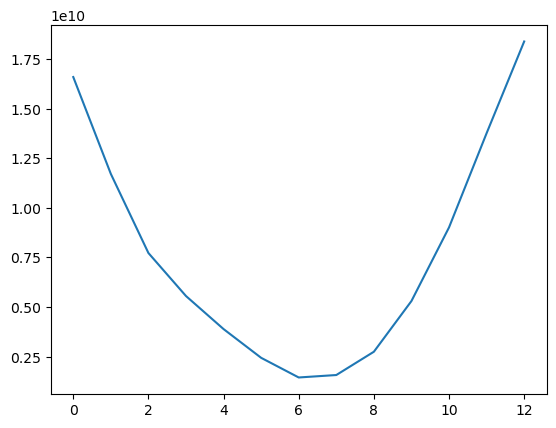

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x152bb4137eb0>

In [23]:
plt.plot(norm_nu0_kappa1)

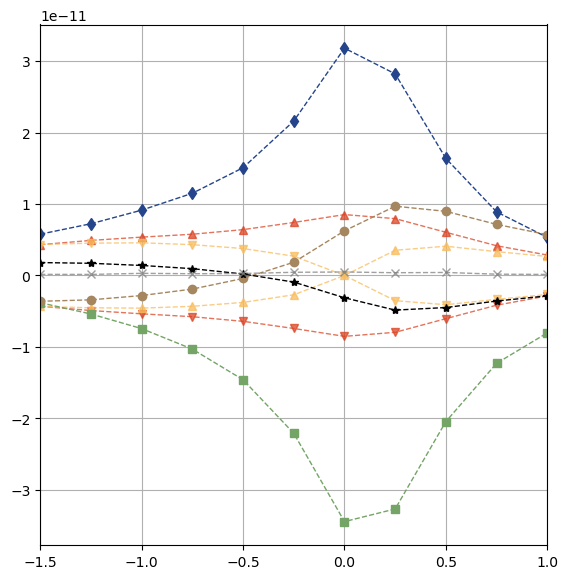

In [8]:
cols2 = ["#dc4424", "#f8bc5c", "#24448c", "#74a466", "#a6865f", "black", "gray", "#cca4a0", "#756c8c", "#229943"];

# fig,ax1 = PyPlot.subplots(1,1,figsize=(4.5, 4))
fig,ax2 = PyPlot.subplots(1,1,figsize=(5.5, 5.5))

fig.tight_layout(pad=0.0)



Nalp = 0.75

#############################################################################################
# U1
U[1] = Us[1]

x = collect(range(-1.5,1.5,13))



# #############################################################################################
ax2.plot(x,LT_nu1Em15_kap1[:,1], marker="^", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)
ax2.plot(x,LT_nu1Em15_kap1[:,2],label=L"\mathrm{BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)

ax2.plot(x,TT_nu1Em15_kap1, marker="^", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)
ax2.plot(x,-TT_nu1Em15_kap1,label=L"\mathrm{Topo: \ BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)

ax2.plot(x,BC_nu1Em15_kap1,label=L"C_\mathrm{BC}", marker="d", linestyle="--", linewidth=1., color=cols2[3])

# ax2.plot(x,DS_mu45[:,1],label=L"D_\mathrm{BT}", marker="s", linestyle="--", linewidth=1., color=cols2[4])
# ax2.plot(x,DS_mu45[:,2],label=L"D_\mathrm{BC}", marker="o", linestyle="--", linewidth=1., color=cols2[5])
ax2.plot(x, DS_nu1Em15_kap1[:, 1], label=L"D_\mathrm{BT, \ EKE}", marker="s", linestyle="--",color=cols2[4], linewidth=1)
ax2.plot(x, 2 * DS_nu1Em15_kap1[:, 2], label=L"D_\mathrm{BC, \ EAPE}", marker="o", linestyle="--",color=cols2[5], linewidth=1)
ax2.plot(x, - DS_nu1Em15_kap1[:, 2], label=L"D_\mathrm{BC, \ EKE}", marker="*", linestyle="--",color=cols2[6], linewidth=1)

ax2.plot(x,resx_nu1Em15_kap1,label=L"\mathrm{resid.}", marker="x", linestyle="--", linewidth=1., color=cols2[7], alpha=Nalp)

ax2.set_xlim([x[1], x[end]])
# ax1.set_xticklabels([])
ax2.grid()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


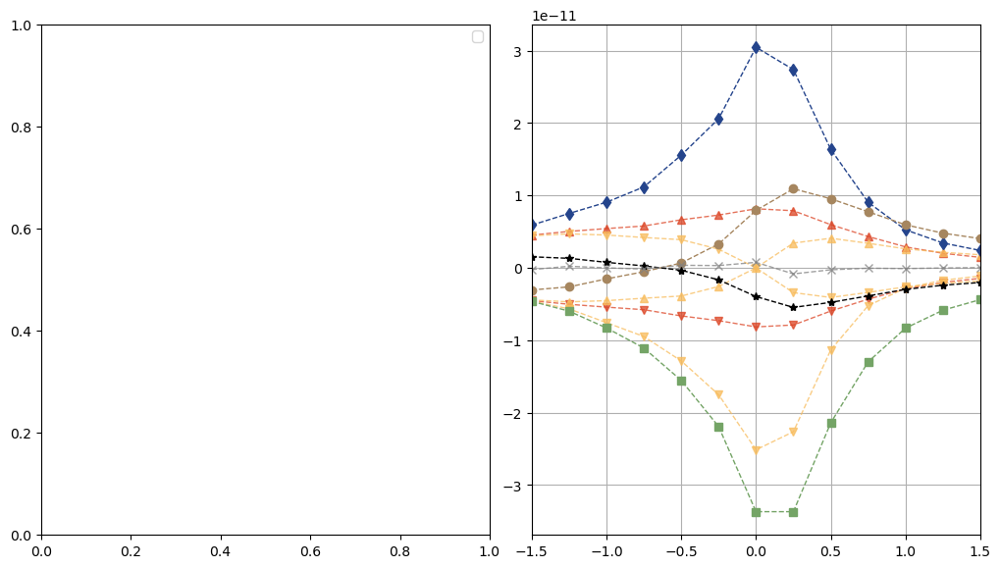

PyObject <matplotlib.legend.Legend object at 0x153f0c0cd2a0>

In [35]:
cols2 = ["#dc4424", "#f8bc5c", "#24448c", "#74a466", "#a6865f", "black", "gray", "#cca4a0", "#756c8c", "#229943"];

# fig,ax1 = PyPlot.subplots(1,1,figsize=(4.5, 4))
fig,ax = PyPlot.subplots(1,2,figsize=(10, 5.5))
ax1=ax[1]; ax2=ax[2];

fig.tight_layout(pad=0.0)



Nalp = 0.75

#############################################################################################
# U1
U[1] = Us[1]

x = collect(range(-1.5,1.5,13))
# x2 = collect(range(-1.5,-0.75,5))
x2=deepcopy(x)

# #############################################################################################
# ax1.plot(x,LT_nu1em13_kap1[:,1], marker="^", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)
# ax1.plot(x,LT_nu1em13_kap1[:,2],label=L"\mathrm{BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)

# ax1.plot(x,TT_nu1em13_kap1, marker="^", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)
# ax1.plot(x,-TT_nu1em13_kap1,label=L"\mathrm{Topo: \ BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)

# ax1.plot(x,BC_nu1em13_kap1,label=L"C_\mathrm{BC}", marker="d", linestyle="--", linewidth=1., color=cols2[3])

# # ax1.plot(x,DS_nu1em13_kap1[:,1],label=L"D_\mathrm{BT}", marker="s", linestyle="--", linewidth=1., color=cols2[4])
# # ax1.plot(x,DS_nu1em13_kap1[:,2],label=L"D_\mathrm{BC}", marker="o", linestyle="--", linewidth=1., color=cols2[5])
# ax1.plot(x, DS_nu1em13_kap1[:, 1], label=L"D_\mathrm{BT, \ EKE}", marker="s", linestyle="--",color=cols2[4], linewidth=1)
# ax1.plot(x, 2 * DS_nu1em13_kap1[:, 2], label=L"D_\mathrm{BC, \ EAPE}", marker="o", linestyle="--",color=cols2[5], linewidth=1)
# ax1.plot(x, - DS_nu1em13_kap1[:, 2], label=L"D_\mathrm{BC, \ EKE}", marker="*", linestyle="--",color=cols2[6], linewidth=1)

# ax1.plot(x,resid_nu1em13_kap1,label=L"\mathrm{resid.}", marker="x", linestyle="--", linewidth=1., color=cols2[7], alpha=Nalp)

# ax1.set_xlim([x[1], x[end]])
# # ax1.set_xticklabels([])
# ax1.grid()


# #############################################################################################
ax2.plot(x2,LT_nu0_kap1[:,1], marker="^", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)
ax2.plot(x2,LT_nu0_kap1[:,2],label=L"\mathrm{BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)

ax2.plot(x2,TT_nu0_kap1, marker="^", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)
ax2.plot(x2,-TT_nu0_kap1,label=L"\mathrm{Topo: \ BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)

ax2.plot(x2,-NL_nu0_kap1[:,1],label=L"\mathrm{Topo: \ BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)

ax2.plot(x2,BC_nu0_kap1,label=L"C_\mathrm{BC}", marker="d", linestyle="--", linewidth=1., color=cols2[3])

# ax2.plot(x,DS_nu0_kap1[:,1],label=L"D_\mathrm{BT}", marker="s", linestyle="--", linewidth=1., color=cols2[4])
# ax2.plot(x,DS_nu0_kap1[:,2],label=L"D_\mathrm{BC}", marker="o", linestyle="--", linewidth=1., color=cols2[5])
ax2.plot(x2, DS_nu0_kap1[:, 1], label=L"D_\mathrm{BT, \ EKE}", marker="s", linestyle="--",color=cols2[4], linewidth=1)
ax2.plot(x2, 2 * DS_nu0_kap1[:, 2], label=L"D_\mathrm{BC, \ EAPE}", marker="o", linestyle="--",color=cols2[5], linewidth=1)
ax2.plot(x2, - DS_nu0_kap1[:, 2], label=L"D_\mathrm{BC, \ EKE}", marker="*", linestyle="--",color=cols2[6], linewidth=1)

ax2.plot(x2,resx_nu0_kap1,label=L"\mathrm{resid.}", marker="x", linestyle="--", linewidth=1., color=cols2[7], alpha=Nalp)

ax2.set_xlim([x[1], x[end]])
# ax1.set_xticklabels([])
ax2.grid()

ax1.legend()

In [16]:
cols2 = ["#dc4424", "#f8bc5c", "#24448c", "#74a466", "#a6865f", "black", "gray", "#cca4a0", "#756c8c", "#229943"];

# fig,ax1 = PyPlot.subplots(1,1,figsize=(4.5, 4))
fig,ax = PyPlot.subplots(1,2,figsize=(10, 5.5))
ax1=ax[1]; ax2=ax[2];

fig.tight_layout(pad=0.0)



Nalp = 0.75

#############################################################################################
# U1
U[1] = Us[1]

x = collect(range(-1.5,1.5,13))
# x = collect(range(-1.5,-0.5,5))

# #############################################################################################
# ax1.plot(x,LT_nu1em13_mu1[:,1], marker="^", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)
# ax1.plot(x,LT_nu1em13_mu1[:,2],label=L"\mathrm{BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)

# ax1.plot(x,TT_nu1em13_mu1, marker="^", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)
# ax1.plot(x,-TT_nu1em13_mu1,label=L"\mathrm{Topo: \ BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)

# ax1.plot(x,BC_nu1em13_mu1,label=L"C_\mathrm{BC}", marker="d", linestyle="--", linewidth=1., color=cols2[3])

# # ax1.plot(x,DS_nu1em13_mu1[:,1],label=L"D_\mathrm{BT}", marker="s", linestyle="--", linewidth=1., color=cols2[4])
# # ax1.plot(x,DS_nu1em13_mu1[:,2],label=L"D_\mathrm{BC}", marker="o", linestyle="--", linewidth=1., color=cols2[5])
# ax1.plot(x, DS_nu1em13_mu1[:, 1], label=L"D_\mathrm{BT, \ EKE}", marker="s", linestyle="--",color=cols2[4], linewidth=1)
# ax1.plot(x, 2 * DS_nu1em13_mu1[:, 2], label=L"D_\mathrm{BC, \ EAPE}", marker="o", linestyle="--",color=cols2[5], linewidth=1)
# ax1.plot(x, - DS_nu1em13_mu1[:, 2], label=L"D_\mathrm{BC, \ EKE}", marker="*", linestyle="--",color=cols2[6], linewidth=1)

# ax1.plot(x,resid_nu1em13_mu1,label=L"\mathrm{resid.}", marker="x", linestyle="--", linewidth=1., color=cols2[7], alpha=Nalp)

# ax1.set_xlim([x[1], x[end]])
# # ax1.set_xticklabels([])
# ax1.grid()


# # #############################################################################################
ax2.plot(x,LT_nu0_kap2[:,1], marker="^", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)
ax2.plot(x,LT_nu0_kap2[:,2],label=L"\mathrm{BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[1], alpha=Nalp)

ax2.plot(x,TT_nu0_kap2, marker="^", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)
ax2.plot(x,-TT_nu0_kap2,label=L"\mathrm{Topo: \ BC} \leftrightarrow \mathrm{BT}", marker="v", linestyle="--", linewidth=1., color=cols2[2], alpha=Nalp)



ax2.plot(x,BC_nu0_kap2,label=L"C_\mathrm{BC}", marker="d", linestyle="--", linewidth=1., color=cols2[3])

# ax2.plot(x,DS_nu0_kap2[:,1],label=L"D_\mathrm{BT}", marker="s", linestyle="--", linewidth=1., color=cols2[4])
# ax2.plot(x,DS_nu0_kap2[:,2],label=L"D_\mathrm{BC}", marker="o", linestyle="--", linewidth=1., color=cols2[5])
ax2.plot(x, DS_nu0_kap2[:, 1], label=L"D_\mathrm{BT, \ EKE}", marker="s", linestyle="--",color=cols2[4], linewidth=1)
ax2.plot(x, 2 * DS_nu0_kap2[:, 2], label=L"D_\mathrm{BC, \ EAPE}", marker="o", linestyle="--",color=cols2[5], linewidth=1)
ax2.plot(x, - DS_nu0_kap2[:, 2], label=L"D_\mathrm{BC, \ EKE}", marker="*", linestyle="--",color=cols2[6], linewidth=1)

ax2.plot(x,resx_nu0_kap2,label=L"\mathrm{resid.}", marker="x", linestyle="--", linewidth=1., color=cols2[7], alpha=Nalp)

# ax2.set_xlim([x[1], x[end]])
# # ax1.set_xticklabels([])
# ax2.grid()

ax1.legend()

LoadError: UndefVarError: `LT_nu0_kap2` not defined

In [18]:
using FileIO, JLD2

fn = data_dir*"modal_nrg_budget_Ld40km_mus_U0p01_L5000km.jld"

jld_data = Dict("LT_mu15" => LT_mu15, "TT_mu15" => TT_mu15, "BC_mu15" => BC_mu15, "DS_mu15" => DS_mu15, 
    "BTEKE_mu15" => BTEKE_mu15, "BCEKE_mu15" => BCEKE_mu15, "BCEAPE_mu15" => BCEAPE_mu15, "resid_mu15" => resid_mu15,
    "LT_mu30" => LT_mu30, "TT_mu30" => TT_mu30, "BC_mu30" => BC_mu30, "DS_mu30" => DS_mu30, 
    "BTEKE_mu30" => BTEKE_mu30, "BCEKE_mu30" => BCEKE_mu30, "BCEAPE_mu30" => BCEAPE_mu30, "resid_mu30" => resid_mu30,
    "LT_mu45" => LT_mu45, "TT_mu45" => TT_mu45, "BC_mu45" => BC_mu45, "DS_mu45" => DS_mu45, 
    "BTEKE_mu45" => BTEKE_mu45, "BCEKE_mu45" => BCEKE_mu45, "BCEAPE_mu45" => BCEAPE_mu45, "resid_mu45" => resid_mu45,
    "LT_mu95" => LT_mu95, "TT_mu95" => TT_mu95, "BC_mu95" => BC_mu95, "DS_mu95" => DS_mu95, 
    "BTEKE_mu95" => BTEKE_mu95, "BCEKE_mu95" => BCEKE_mu95, "BCEAPE_mu95" => BCEAPE_mu95, "resid_mu95" => resid_mu95,
    "LT_mu145" => LT_mu145, "TT_mu145" => TT_mu145, "BC_mu145" => BC_mu145, "DS_mu145" => DS_mu145, 
    "BTEKE_mu145" => BTEKE_mu145, "BCEKE_mu145" => BCEKE_mu145, "BCEAPE_mu145" => BCEAPE_mu145, "resid_mu145" => resid_mu145)
    
    


jldsave(fn; jld_data)

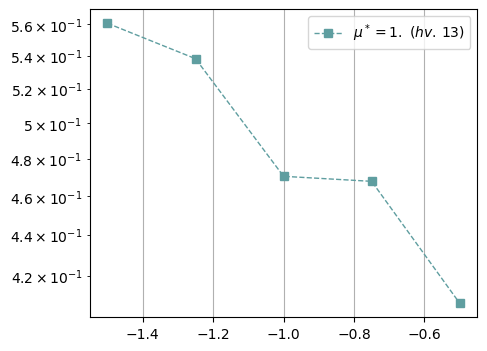

In [19]:
cols = ["#AC78BA", "orange", "#be1e2d", "#5f9ea0", "#21409a", "black"];

################################################################################################

fig,ax1 = plt.subplots(1,1,figsize=(5,4))

# fig,ax = plt.subplots(2,1,figsize=(5,8))
# ax1=ax[1]; ax2=ax[2];

x = collect(range(-1.5,1.5,13))
x = collect(range(-1.5,-0.5,5))


# QD
ax1.plot(x,(BCEKE_nu1em13_mu1 ./ BTEKE_nu1em13_mu1), marker="s", linestyle="--", linewidth=1., color=cols[4], label=L"\mu^* = 1. \ (hv. \, 13)")
# ax1.plot(x,(BCEKE_nu1em13_mu0p003 ./ BTEKE_nu1em13_mu0p003), marker="*", linestyle="--", linewidth=1., color=cols[5], label=L"\mu^* = 0.003 \ (hv \, 13.)")

# # LD
# ax1.plot(x,(BCEKE_nu1em13_kap1 ./ BTEKE_nu1em13_kap1), marker="^", linestyle="--", linewidth=1., color=cols[1], label=L"\kappa^* = 1. \ (hv.)")
# ax1.plot(x2,(BCEKE_nu0_kap1 ./ BTEKE_nu0_kap1), marker="o", linestyle="--", linewidth=1., color=cols[2], label=L"\kappa^* = 1 \ (exp.)")
# ax1.plot(x,(BCEKE_nu1em14_kap1 ./ BTEKE_nu1em14_kap1), marker="d", linestyle="--", linewidth=1., color=cols[3], label=L"\kappa^* = 1. \ (hv \, 14.)")


ax1.grid()
ax1.legend()

ax1.set_yscale("log")


# Modal wavenumber energy budget

In [5]:
using Statistics

function isotropic_mean(arr_in, grid)
    # arr_in: an nkr X nl array that is output of rfft
    # note that we only want real part of this
    
    dk = 2*pi/grid.Lx; dl = 2*pi/grid.Ly;
    
    dkr = sqrt(dk^2 + dl^2)
    
    wv = @. sqrt(grid.kr^2 + grid.l^2)
    
    iso = zeros(length(grid.kr))
    
    for i in range(1,length(grid.kr))
        # find 2D index values for a wavenumber magnitude
        if i==length(grid.kr)
            fkr = @. (wv>=grid.kr[i]) & (wv<=grid.kr[i]+dkr)
        else
            fkr = @. (wv>=grid.kr[i]) & (wv<grid.kr[i+1])
        end
        
        if sum(fkr) > 0
            iso[i] = mean(real(arr_in[fkr])) # this is average over all combinations of k_x and k_y that are the same, isotropic k
        end
        
    end

    return iso
end

isotropic_mean (generic function with 1 method)

In [6]:

function spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool; iso_mean=true)

    nlayers=2
    topographic_pv_gradient = (0, (f₀/H[end]) * h0s[1])

    μ = μstar * (U[1]/2) / Ld
        
    prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
    μ, β, dt, stepper, aliased_fraction=1/3);

    sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

    Nh0 = length(h0s)
    
    NRGs_out = zeros(grid_jl.nkr, Nh0, 3)
    CBC_out = zeros(grid_jl.nkr, Nh0, nlayers-1)
    LF_out = zeros(grid_jl.nkr, Nh0,2)
    Drag_out = zeros(grid_jl.nkr, Nh0,2)
    NLBT_out = zeros(grid_jl.nkr, Nh0, 2)
    NLBC_out = zeros(grid_jl.nkr, Nh0, 3)
    resid_out = zeros(grid_jl.nkr, Nh0)
    
    for k in range(1,length(h0s))
        println(k)
            
        topographic_pv_gradient = (0, (f₀/H[end]) * h0s[k])
            
        prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
        μ, β, dt, stepper, aliased_fraction=1/3);

        sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

        GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        if μstar<1.55
            N_yr=90
        else
            N_yr = 90 # length(files)
        end
            
        ## pre-allocate
        window = Int(round(250 * (Ld / U[1]) / 3600 / 24 / 365.25))   # analyze last 500 eddy-turnover times
        nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output
        
        NRGs_h0 = zeros(grid_jl.nkr, nmax, 3)
        CBC_h0 = zeros(grid_jl.nkr, nmax, nlayers-1)
        LF_h0 = zeros(grid_jl.nkr, nmax,2)
        Drag_h0 = zeros(grid_jl.nkr, nmax,2)
        NLBT_h0 = zeros(grid_jl.nkr, nmax, 2)
        NLBC_h0 = zeros(grid_jl.nkr, nmax, 3)
        resid_h0 = zeros(grid_jl.nkr, nmax)

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)

            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                NRGs_h0[:,n,:], CBC_h0[:,n], LF_h0[:,n,:], Drag_h0[:,n,:], NLBT_h0[:,n,:], NLBC_h0[:,n,:], resid_h0[:,n] = modal_spec_budget(prob, ψ,μstar, νstar, drag_bool, iso_mean);

                n+=1
            end
            GC.gc()
        end

        NRGs_out[:,k,:] = mean(NRGs_h0[:,1:n-1,:], dims=2)
        CBC_out[:,k] = mean(CBC_h0[:,1:n-1], dims=2)
        LF_out[:,k,:] = mean(LF_h0[:,1:n-1,:], dims=2)
        Drag_out[:,k,:] = mean(Drag_h0[:,1:n-1,:], dims=2)
        NLBT_out[:,k,:] = mean(NLBT_h0[:,1:n-1,:], dims=2)
        NLBC_out[:,k,:] = mean(NLBC_h0[:,1:n-1,:], dims=2)
        resid_out[:,k] = mean(resid_h0[:,1:n-1], dims=2)

    end
    
    return NRGs_out, CBC_out, LF_out, Drag_out, NLBT_out, NLBC_out, resid_out
end


spec_budget (generic function with 1 method)

In [7]:
function modal_spec_budget(vars, params, grid_jl, sol, ψ,μstar, νstar, drag_bool, iso_mean)

    # parameters
    nlayers = 2
    δ = [params.H[1]/sum(params.H), params.H[2]/sum(params.H)]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at each interface
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])
    
    # assigning basic variables
    vars.ψ .= ψ
    # vars.q .= q
    
    vars.ψh[:,:,1] .= rfft(vars.ψ[:,:,1])
    vars.ψh[:,:,2] .= rfft(vars.ψ[:,:,2])

    ψBC = 0.5 * (vars.ψ[:,:,1] .- vars.ψ[:,:,2])
    ψBT = 0.5 * (vars.ψ[:,:,1] .+ vars.ψ[:,:,2])
    
    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)
    
    U₁, U₂, = view(params.U, :, :, 1), view(params.U, :, :, 2)
    
    S32 = params.f₀ * U₁[1,1] / g′

    # streamfunction stuff
    ∂xψBTh = im * grid_jl.kr .* ψBTh
    ∂yψBTh = im * grid_jl.l .* ψBTh
    
    ∂xψBT = irfft(∂xψBTh, grid_jl.ny)
    ∂yψBT = irfft(∂yψBTh, grid_jl.ny)

    ∂xψBCh = im * grid_jl.kr .* ψBCh
    ∂yψBCh = im * grid_jl.l .* ψBCh
    
    ∂xψBC = irfft(∂xψBCh, grid_jl.ny)
    ∂yψBC = irfft(∂yψBCh, grid_jl.ny)
    
    # nonlinear terms
    ζ = deepcopy(vars.v)
    ζ[:,:,1] .= irfft(-grid_jl.Krsq .* vars.ψh[:,:,1], grid_jl.ny)
    ζ[:,:,2] .= irfft(-grid_jl.Krsq .* vars.ψh[:,:,2], grid_jl.ny)
    ζ₁, ζ₂ = view(ζ, :, :, 1), view(ζ, :, :, 2)

    ζBCh = - grid_jl.Krsq .* ψBCh
    ζBTh = - grid_jl.Krsq .* ψBTh

    ζBC = irfft(ζBCh,grid_jl.ny)
    ζBT = irfft(ζBTh,grid_jl.ny)

    ∂xζBCh = im * grid_jl.kr .* ζBCh
    ∂xζBTh = im * grid_jl.kr .* ζBTh

    ∂yζBCh = im * grid_jl.l .* ζBCh
    ∂yζBTh = im * grid_jl.l .* ζBTh

    ∂xζBC = irfft(∂xζBCh, grid_jl.ny)
    ∂xζBT = irfft(∂xζBTh, grid_jl.ny)

    ∂yζBC = irfft(∂yζBCh, grid_jl.ny)
    ∂yζBT = irfft(∂yζBTh, grid_jl.ny)
    
    ζBT∂xψBTh = rfft(ζBT .* ∂xψBT)
    ζBT∂yψBTh = rfft(ζBT .* ∂yψBT)

    ζBC∂xψBCh = rfft(ζBC .* ∂xψBC)
    ζBC∂yψBCh = rfft(ζBC .* ∂yψBC)

    ζBC∂xψBTh = rfft(ζBC .* ∂xψBT)
    ζBC∂yψBTh = rfft(ζBC .* ∂yψBT)

    ζBT∂xψBCh = rfft(ζBT .* ∂xψBC)
    ζBT∂yψBCh = rfft(ζBT .* ∂yψBC)

    ψBC∂xψBT = rfft(ψBC .* ∂xψBT)
    ψBC∂yψBT = rfft(ψBC .* ∂yψBT)

    J_ψBT_ζBT = ∂xψBT .* ∂yζBT .- ∂yψBT .* ∂xζBT

    J_ψBT_ζBTh = rfft(J_ψBT_ζBT)

    ζ₁h = rfft(ζ₁)
    
    ζ₂h = rfft(ζ₂)
    
    ∂xζ1h = im * grid_jl.kr .* ζ₁h 
    ∂xζ1 = irfft(∂xζ1h, grid_jl.ny)

    ############################################################################################
    BTEKE = @. 0.5 * (conj(ψBTh) * (grid_jl.kr^2 * ψBTh) + ψBTh * conj(grid_jl.kr^2 * ψBTh))

    BCEKE = @. 0.5 * grid_jl.kr^2 * (conj(ψBCh) * ψBCh + ψBCh * conj(ψBCh))
    BCEAPE = @. 0.5 * 2 * Ld1^-2 * (conj(ψBCh) * ψBCh + ψBCh * conj(ψBCh))

    ############################################################################################
    # Baroclinic conversion term
    CBC = @. S32 * (params.f₀ / params.H[1]) * ( conj(ψBCh) * ∂xψBTh + ψBCh * conj(∂xψBTh)) # these are equivalent!

    # CBC = @. U₁ * Ld1^-2 * (conj(ψBCh) * ∂xψBTh)
    # CBC .+= conj(CBC)
    
    ############################################################################################
    # Linear BC-BT flux (flat-bottom) term
    BC2BT = @. 0.5 * U₁ * (conj(ψBTh) * ∂xζ1h + ψBTh * conj(∂xζ1h))

    ############################################################################################
    # Nonlinear terms in BT budget
    NLBT = zeros(grid_jl.nkr,grid_jl.ny,2) .+ 0im
    NLBT[:,:,1] = @. conj(ψBTh) * J_ψBT_ζBTh + ψBTh * conj(J_ψBT_ζBTh)  # im * (grid_jl.l * ζBT∂xψBTh - grid_jl.kr * ζBT∂yψBTh)
    # NLBT[:,:,1] .+= conj.(NLBT[:,:,1])

    NLBT[:,:,2] = @. conj(ψBTh) * im * (grid_jl.l * ζBC∂xψBCh - grid_jl.kr * ζBC∂yψBCh)
    NLBT[:,:,2] .+= conj.(NLBT[:,:,2])

    ############################################################################################
    # Nonlinear terms in BC budget
    NLBC = zeros(grid_jl.nkr,grid_jl.ny,3) .+ 0im
    NLBC[:,:,1] = @. conj(ψBCh) * im * (grid_jl.l * ζBC∂xψBTh - grid_jl.kr * ζBC∂yψBTh)
    NLBC[:,:,1] .+= conj.(NLBC[:,:,1])

    NLBC[:,:,2] = @. conj(ψBCh) * im * (grid_jl.l * ζBT∂xψBCh - grid_jl.kr * ζBT∂yψBCh)
    NLBC[:,:,2] .+= conj.(NLBC[:,:,2])

    NLBC[:,:,3] = @. - 2 * Ld1^-2 * conj(ψBCh) * im * (grid_jl.l * ψBC∂xψBT - grid_jl.kr * ψBC∂yψBT)
    NLBC[:,:,3] .+= conj.(NLBC[:,:,3])

    ############################################################################################
    TopoT = @. -0.5 * (params.f₀ / params.H[2]) * ∂yηb * (conj(ψBTh) * ∂xψBCh + ψBTh * conj(∂xψBCh))

    ############################################################################################
    # BT drag
    DBT = @. - 0.5 * params.μ * (conj(ψBTh) * (ζBCh - ζBTh) + ψBTh * conj(ζBCh - ζBTh))

    ############################################################################################
    # BC drag
    DBC = @. 0.5 * params.μ * (conj(ψBCh) * (ζBCh - ζBTh) + ψBCh * conj(ζBCh - ζBTh) )

    ############################################################################################
    # taking mean at each wavenumber magnitude, i.e., assuming isotropy
    NRGs = hcat(isotropic_mean(BTEKE,grid_jl), isotropic_mean(BCEKE,grid_jl), isotropic_mean(BCEAPE,grid_jl))
    CBCh = isotropic_mean(CBC, grid_jl)
    LF = hcat(isotropic_mean(BC2BT, grid_jl), isotropic_mean(TopoT, grid_jl))
    Drag = hcat(isotropic_mean(DBT, grid_jl), isotropic_mean(DBC, grid_jl))
    NLBTh = hcat(isotropic_mean(NLBT[:,:,1], grid_jl), isotropic_mean(NLBT[:,:,2], grid_jl))
    NLBCh = hcat(isotropic_mean(NLBC[:,:,1], grid_jl), isotropic_mean(NLBC[:,:,2], grid_jl), isotropic_mean(NLBC[:,:,3], grid_jl))

    NRGs = dropdims(NRGs,dims=tuple(findall(size(NRGs).==1)...))
    CBCh = dropdims(CBCh,dims=tuple(findall(size(CBCh).==1)...))
    LF = dropdims(LF,dims=tuple(findall(size(LF).==1)...))
    Drag = dropdims(Drag,dims=tuple(findall(size(Drag).==1)...))
    NLBTh = dropdims(NLBTh,dims=tuple(findall(size(NLBTh).==1)...))
    NLBCh = dropdims(NLBCh,dims=tuple(findall(size(NLBCh).==1)...))

    resid = CBCh .+ sum(Drag, dims=2) .+ sum(NLBTh, dims=2) .+ sum(NLBCh, dims=2)
    
    GC.gc()
   
  return NRGs, CBCh, LF, Drag, NLBTh, NLBCh, resid
end

modal_spec_budget(prob, ψ, μstar, νstar, drag_bool, iso_mean) = modal_spec_budget(prob.vars, prob.params, prob.grid, prob.sol, ψ,μstar, νstar, drag_bool, iso_mean)


modal_spec_budget (generic function with 2 methods)

In [19]:
νstar = 0. # 10^-13
μstar = 1.0
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]


# NRGs_nu0_kap1, CBC_nu0_kap1, LF_nu0_kap1, Drag_nu0_kap1, NLBT_nu0_kap1, NLBC_nu0_kap1, resid_nu0_kap1 = spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);

4.449286275031877e6

In [18]:
μstar = 0.5

NRGs_nu0_kap0p5, CBC_nu0_kap0p5, LF_nu0_kap0p5, Drag_nu0_kap0p5, NLBT_nu0_kap0p5, NLBC_nu0_kap0p5, resid_nu0_kap0p5 = spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [16]:
νstar = 0. # 10^-13
μstar = 0.25
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]


NRGs_nu0_kap0p25, CBC_nu0_kap0p25, LF_nu0_kap0p25, Drag_nu0_kap0p25, NLBT_nu0_kap0p25, NLBC_nu0_kap0p25, resid_nu0_kap0p25 = spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [17]:
μstar = 2.0

NRGs_nu0_kap2, CBC_nu0_kap2, LF_nu0_kap2, Drag_nu0_kap2, NLBT_nu0_kap2, NLBC_nu0_kap2, resid_nu0_kap2 = spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [26]:
μstar = 4.0

NRGs_nu0_kap4, CBC_nu0_kap4, LF_nu0_kap4, Drag_nu0_kap4, NLBT_nu0_kap4, NLBC_nu0_kap4, resid_nu0_kap4 = spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [20]:
μstar = 0.125

NRGs_nu0_kap0p125, CBC_nu0_kap0p125, LF_nu0_kap0p125, Drag_nu0_kap0p125, NLBT_nu0_kap0p125, NLBC_nu0_kap0p125, resid_nu0_kap0p125 = spec_budget(U,ρ,H,μ,h0s[7:end],μstar, νstar, drag_bool);


1
2
3
4
5
6
7


In [15]:
νstar = 0. # 10^-13
μstar = 1.0
drag_bool = true

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]


NRGs_nu0_mu1, CBC_nu0_mu1, LF_nu0_mu1, Drag_nu0_mu1, NLBT_nu0_mu1, NLBC_nu0_mu1, resid_nu0_mu1 = spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [17]:
νstar = 0. # 10^-13
μstar = 0.5
drag_bool = true

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]


NRGs_nu0_mu0p5, CBC_nu0_mu0p5, LF_nu0_mu0p5, Drag_nu0_mu0p5, NLBT_nu0_mu0p5, NLBC_nu0_mu0p5, resid_nu0_mu0p5 = spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [8]:
νstar = 0. # 10^-13
μstar = 0.25
drag_bool = true

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]


NRGs_nu0_mu0p25, CBC_nu0_mu0p25, LF_nu0_mu0p25, Drag_nu0_mu0p25, NLBT_nu0_mu0p25, NLBC_nu0_mu0p25, resid_nu0_mu0p25 = spec_budget(U,ρ,H,μ,h0s,μstar, νstar, drag_bool);

1
2
3


LoadError: InterruptException:

In [16]:

fn = data_dir*"modal_spec_budget_nu0_mu1.jld"

jld_data = Dict("NRGs_nu0_mu1" => NRGs_nu0_mu1,
    "CBC_nu0_mu1" => CBC_nu0_mu1,
    "LF_nu0_mu1" => LF_nu0_mu1,
    "Drag_nu0_mu1" => Drag_nu0_mu1,
    "NLBT_nu0_mu1" => NLBT_nu0_mu1,
    "NLBC_nu0_mu1" => NLBC_nu0_mu1,
    "resid_nu0_mu1" => resid_nu0_mu1,
    "kr" => grid_jl.kr)

jldsave(fn; jld_data)

In [23]:

fn = data_dir*"modal_spec_budget_nu0_mu0p5.jld"

jld_data = Dict("NRGs_nu0_mu0p5" => NRGs_nu0_mu0p5,
    "CBC_nu0_mu0p5" => CBC_nu0_mu0p5,
    "LF_nu0_mu0p5" => LF_nu0_mu0p5,
    "Drag_nu0_mu0p5" => Drag_nu0_mu0p5,
    "NLBT_nu0_mu0p5" => NLBT_nu0_mu0p5,
    "NLBC_nu0_mu0p5" => NLBC_nu0_mu0p5,
    "resid_nu0_mu0p5" => resid_nu0_mu0p5,
    "kr" => grid_jl.kr)

jldsave(fn; jld_data)

In [9]:

fn = data_dir*"modal_spec_budget_nu0_mu0p25.jld"

jld_data = Dict("NRGs_nu0_mu0p25" => NRGs_nu0_mu0p25,
    "CBC_nu0_mu0p25" => CBC_nu0_mu0p25,
    "LF_nu0_mu0p25" => LF_nu0_mu0p25,
    "Drag_nu0_mu0p25" => Drag_nu0_mu0p25,
    "NLBT_nu0_mu0p25" => NLBT_nu0_mu0p25,
    "NLBC_nu0_mu0p25" => NLBC_nu0_mu0p25,
    "resid_nu0_mu0p25" => resid_nu0_mu0p25,
    "kr" => grid_jl.kr)

jldsave(fn; jld_data)

LoadError: UndefVarError: `NRGs_nu0_mu0p25` not defined

In [5]:

fn = data_dir*"modal_spec_budget_nu0_kap1.jld"

# jld_data = Dict("NRGs_nu0_kap1" => NRGs_nu0_kap1,
#     "CBC_nu0_kap1" => CBC_nu0_kap1,
#     "LF_nu0_kap1" => LF_nu0_kap1,
#     "Drag_nu0_kap1" => Drag_nu0_kap1,
#     "NLBT_nu0_kap1" => NLBT_nu0_kap1,
#     "NLBC_nu0_kap1" => NLBC_nu0_kap1,
#     "resid_nu0_kap1" => resid_nu0_kap1,
#     "kr" => grid_jl.kr)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [6]:

fn = data_dir*"modal_spec_budget_nu0_kap0p5.jld"

# jld_data = Dict("NRGs_nu0_kap0p5" => NRGs_nu0_kap0p5,
#     "CBC_nu0_kap0p5" => CBC_nu0_kap0p5,
#     "LF_nu0_kap0p5" => LF_nu0_kap0p5,
#     "Drag_nu0_kap0p5" => Drag_nu0_kap0p5,
#     "NLBT_nu0_kap0p5" => NLBT_nu0_kap0p5,
#     "NLBC_nu0_kap0p5" => NLBC_nu0_kap0p5,
#     "resid_nu0_kap0p5" => resid_nu0_kap0p5,
#     "kr" => grid_jl.kr)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [7]:

fn = data_dir*"modal_spec_budget_nu0_kap0p25.jld"

# jld_data = Dict("NRGs_nu0_kap0p25" => NRGs_nu0_kap0p25,
#     "CBC_nu0_kap0p25" => CBC_nu0_kap0p25,
#     "LF_nu0_kap0p25" => LF_nu0_kap0p25,
#     "Drag_nu0_kap0p25" => Drag_nu0_kap0p25,
#     "NLBT_nu0_kap0p25" => NLBT_nu0_kap0p25,
#     "NLBC_nu0_kap0p25" => NLBC_nu0_kap0p25,
#     "resid_nu0_kap0p25" => resid_nu0_kap0p25,
#     "kr" => grid_jl.kr)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [8]:
fn = data_dir*"modal_spec_budget_nu0_kap2.jld"

# jld_data = Dict("NRGs_nu0_kap2" => NRGs_nu0_kap2,
#     "CBC_nu0_kap2" => CBC_nu0_kap2,
#     "LF_nu0_kap2" => LF_nu0_kap2,
#     "Drag_nu0_kap2" => Drag_nu0_kap2,
#     "NLBT_nu0_kap2" => NLBT_nu0_kap2,
#     "NLBC_nu0_kap2" => NLBC_nu0_kap2,
#     "resid_nu0_kap2" => resid_nu0_kap2,
#     "kr" => grid_jl.kr)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [9]:
fn = data_dir*"modal_spec_budget_nu0_kap4.jld"

# jld_data = Dict("NRGs_nu0_kap4" => NRGs_nu0_kap4,
#     "CBC_nu0_kap4" => CBC_nu0_kap4,
#     "LF_nu0_kap4" => LF_nu0_kap4,
#     "Drag_nu0_kap4" => Drag_nu0_kap4,
#     "NLBT_nu0_kap4" => NLBT_nu0_kap4,
#     "NLBC_nu0_kap4" => NLBC_nu0_kap4,
#     "resid_nu0_kap4" => resid_nu0_kap4,
#     "kr" => grid_jl.kr)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [10]:

fn = data_dir*"modal_spec_budget_nu0_kap0p125.jld"

# jld_data = Dict("NRGs_nu0_kap0p125" => NRGs_nu0_kap0p125,
#     "CBC_nu0_kap0p125" => CBC_nu0_kap0p125,
#     "LF_nu0_kap0p125" => LF_nu0_kap0p125,
#     "Drag_nu0_kap0p125" => Drag_nu0_kap0p125,
#     "NLBT_nu0_kap0p125" => NLBT_nu0_kap0p125,
#     "NLBC_nu0_kap0p125" => NLBC_nu0_kap0p125,
#     "resid_nu0_kap0p125" => resid_nu0_kap0p125,
#     "kr" => grid_jl.kr)

# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

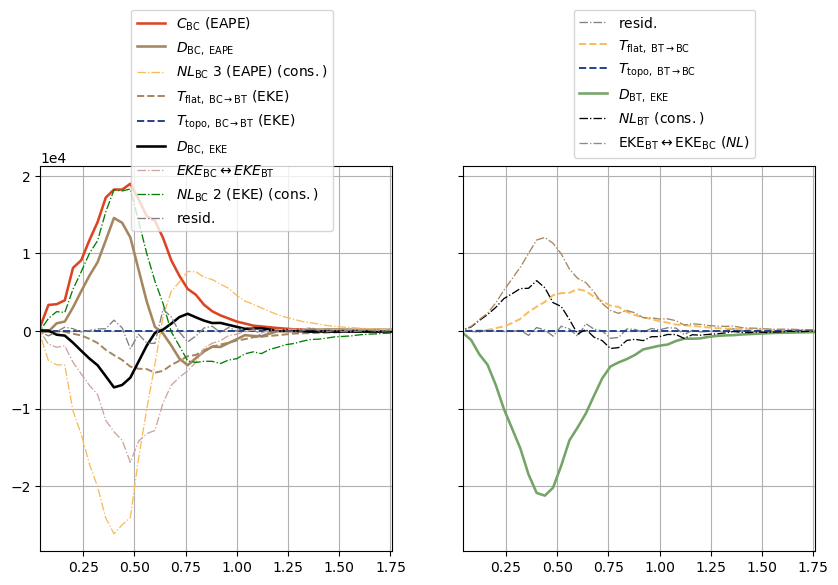

7-element Vector{PyCall.PyObject}:
 PyObject Text(0, -30000.0, '')
 PyObject Text(0, -20000.0, '')
 PyObject Text(0, -10000.0, '')
 PyObject Text(0, 0.0, '')
 PyObject Text(0, 10000.0, '')
 PyObject Text(0, 20000.0, '')
 PyObject Text(0, 30000.0, '')

In [12]:
ls = ["-","--","-."]
lw = collect(range(0.5,5,11))
NLa = 1.0

cols2 = ["#dc4424", "#f8bc5c", "#24448c", "#74a466", "#a6865f", "black", "gray", "#cca4a0", "#756c8c", "#229943","#af01f3", "#53db00"];

h1_ind = 7

x = grid_jl.kr*Ld

xmax_ind = 45


# BC energy budget
fig,ax = plt.subplots(1, 2, figsize=(10,5))
ax4=ax[1]; ax6=ax[2]; # mu=45^-1


##################################################################################################################
##################################################################################################################

ax4.plot(x, CBC_nu0_kap4[:, h1_ind] .* U[1]^-3, label=L"C_\mathrm{BC} \ \mathrm{(EAPE)}",linestyle=ls[1],color=cols2[1], linewidth=lw[4])
ax4.plot(x, 2 * Drag_nu0_kap4[:, h1_ind,2] .* U[1]^-3, label=L"D_\mathrm{BC, \ EAPE}",linestyle=ls[1],color=cols2[5], linewidth=lw[4])
ax4.plot(x, NLBC_nu0_kap4[:,h1_ind,3] .* U[1]^-3, label=L"NL_\mathrm{BC} \ 3 \ \mathrm{(EAPE)} \ \mathrm{(cons.)}", linestyle=ls[3], linewidth=lw[2],color=cols2[2])

ax4.plot(x, -LF_nu0_kap4[:, h1_ind,1] .* U[1]^-3, label=L"T_{\mathrm{flat,} \ \mathrm{BC} \rightarrow \mathrm{BT}} \ \mathrm{(EKE)}",linestyle=ls[2],color=cols2[5], linewidth=lw[3], alpha=NLa) # flat-bottom BC2BT
ax4.plot(x, -LF_nu0_kap4[:, h1_ind,2] .* U[1]^-3, label=L"T_{\mathrm{topo,} \ \mathrm{BC} \rightarrow \mathrm{BT}} \ \mathrm{(EKE)}",linestyle=ls[2],color=cols2[3], linewidth=lw[3], alpha=NLa) # sloping BC2BT
ax4.plot(x, - Drag_nu0_kap4[:, h1_ind,2] .* U[1]^-3, label=L"D_\mathrm{BC, \ EKE}",linestyle=ls[1],color=cols2[6], linewidth=lw[4])
ax4.plot(x, NLBC_nu0_kap4[:,h1_ind,1] .* U[1]^-3, label=L"EKE_\mathrm{BC} \leftrightarrow EKE_\mathrm{BT}", linestyle=ls[3], linewidth=lw[2],color=cols2[8])
ax4.plot(x, NLBC_nu0_kap4[:,h1_ind,2] .* U[1]^-3, label=L"NL_\mathrm{BC} \ 2 \ \mathrm{(EKE)} \ \mathrm{(cons.)}", linestyle=ls[3], linewidth=lw[2],color="green")


EAPE_resid = CBC_nu0_kap4[:, h1_ind] .+ 2 * Drag_nu0_kap4[:, h1_ind,2] .+ NLBC_nu0_kap4[:,h1_ind,3]
EKE_resid = -LF_nu0_kap4[:, h1_ind,1] .- LF_nu0_kap4[:, h1_ind,2] .- Drag_nu0_kap4[:, h1_ind,2] .+ NLBC_nu0_kap4[:,h1_ind,1] .+ NLBC_nu0_kap4[:,h1_ind,2]

BC_resid = EAPE_resid .+ EKE_resid

ax4.plot(x, BC_resid .* U[1]^-3, color=cols2[7], label=L"\mathrm{resid.}", linestyle=ls[3], linewidth=lw[2])

ax4.set_xlim(x[2],x[xmax_ind])

ax4.grid()
ax4.legend(loc="upper right", bbox_to_anchor=(0.85,1.425))

# ax4.set_xscale("log")

################################################################################

# ax5.plot(x, -LF_nu0_kap1[:, h1_ind,1] .* U[1]^-3, label=L"T_{\mathrm{flat,} \ \mathrm{BC} \rightarrow \mathrm{BT}} \ \mathrm{(EKE)}",linestyle=ls[2],color=cols2[2], linewidth=lw[3], alpha=NLa) # flat-bottom BC2BT
# ax5.plot(x, -LF_nu0_kap1[:, h1_ind,2] .* U[1]^-3, label=L"T_{\mathrm{topo,} \ \mathrm{BC} \rightarrow \mathrm{BT}} \ \mathrm{(EKE)}",linestyle=ls[2],color=cols2[3], linewidth=lw[3], alpha=NLa) # sloping BC2BT
# ax5.plot(x, - Drag_nu0_kap1[:, h1_ind,2] .* U[1]^-3, label=L"D_\mathrm{BC, \ EKE}",linestyle=ls[1],color=cols2[6], linewidth=lw[4])
# ax5.plot(x, NLBC_nu0_kap1[:,h1_ind,1] .* U[1]^-3, label=L"EKE_\mathrm{BC} \leftrightarrow EKE_\mathrm{BT}", linestyle=ls[3], linewidth=lw[2],color=cols2[5])
# ax5.plot(x, NLBC_nu0_kap1[:,h1_ind,2] .* U[1]^-3, label=L"NL_\mathrm{BC} \ 2 \ \mathrm{(EKE)} \ \mathrm{(cons.)}", linestyle=ls[3], linewidth=lw[2],color=cols2[6])

# EKE_resid = -LF_nu0_kap1[:, h1_ind,1] .- LF_nu0_kap1[:, h1_ind,2] .- Drag_nu0_kap1[:, h1_ind,2] .+ NLBC_nu0_kap1[:,h1_ind,1] .+ NLBC_nu0_kap1[:,h1_ind,2]
# ax5.plot(x, EKE_resid .* U[1]^-3, color=cols2[7], label=L"\mathrm{resid.}", linestyle=ls[3], linewidth=lw[2])

# ax5.set_xscale("log")
# ax5.set_xlim(x[2],x[xmax_ind])

# ax5.grid()

# ax5.legend(loc="upper right", bbox_to_anchor=(0.85,1.425))

########################################################################################

BT_resid = LF_nu0_kap4[:, h1_ind,1] .+ LF_nu0_kap4[:, h1_ind,2] .+ NLBT_nu0_kap4[:,h1_ind,1] .+ NLBT_nu0_kap4[:,h1_ind,2] .+ Drag_nu0_kap4[:, h1_ind,1] 
ax6.plot(x, BT_resid .* U[1]^-3, color=cols2[7], label=L"\mathrm{resid.}", linestyle=ls[3], linewidth=lw[2])

ax6.plot(x, LF_nu0_kap4[:, h1_ind,1] .* U[1]^-3, label=L"T_{\mathrm{flat,} \ \mathrm{BT} \rightarrow \mathrm{BC}}",linestyle=ls[2],color=cols2[2], linewidth=lw[3], alpha=NLa) # flat-bottom BC2BT
ax6.plot(x, LF_nu0_kap4[:, h1_ind,2] .* U[1]^-3, label=L"T_{\mathrm{topo,} \ \mathrm{BT} \rightarrow \mathrm{BC}}",linestyle=ls[2],color=cols2[3], linewidth=lw[3], alpha=NLa) # sloping BC2BT
ax6.plot(x, Drag_nu0_kap4[:, h1_ind,1] .* U[1]^-3, label=L"D_\mathrm{BT, \ EKE}",linestyle=ls[1],color=cols2[4], linewidth=lw[4])
ax6.plot(x, NLBT_nu0_kap4[:,h1_ind,1] .* U[1]^-3, label=L"NL_\mathrm{BT} \ \mathrm{(cons.)}", linestyle=ls[3], linewidth=lw[2],color=cols2[6])
ax6.plot(x, NLBT_nu0_kap4[:,h1_ind,2] .* U[1]^-3, label=L"\mathrm{EKE}_\mathrm{BT} \leftrightarrow \mathrm{EKE}_\mathrm{BC} \ (NL)", linestyle=ls[3], linewidth=lw[2],color=cols2[5])

ax6.set_xlim(x[2],x[xmax_ind])

# ax6.set_xscale("log")

# ax6.plot(x, (EAPE_resid .+ EKE_resid .+ BT_resid) .* U[1]^-3)


ax6.grid()
ax6.legend(loc="upper right", bbox_to_anchor=(0.85,1.425))

# ymax = maximum([ax4.get_ylim()[2], ax5.get_ylim()[2], ax6.get_ylim()[2]])
# ymin = minimum([ax4.get_ylim()[1], ax5.get_ylim()[1], ax6.get_ylim()[1]])

ymax = maximum([ax4.get_ylim()[2], ax6.get_ylim()[2]])
ymin = minimum([ax4.get_ylim()[1], ax6.get_ylim()[1]])

ax4.set_ylim(ymin,ymax);
# ax5.set_ylim(ymin,ymax);
ax6.set_ylim(ymin,ymax);

ax4.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
# ax5.set_yticklabels([])
ax6.set_yticklabels([])


40000.0

# Calculating phase offsets

In [5]:
using FileIO, JLD2, FFTW, Statistics

function phases_12(U,ρ,H,μstar, νstar, drag_bool, L, h0s,k_max_ind)
    ph_out = zeros(length(h0s), k_max_ind)
    ph_wt_out = zeros(length(h0s),)
    D_BC_EAPE_ph_out = zeros(length(h0s), k_max_ind)
    mi_out = zeros(length(h0s),)

    μ = μstar * (U[1]/2) / Ld
    
    for k in range(1,length(h0s))
        
        file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        if μstar<1.1
            N_yr=90
        else
            N_yr = 90 #length(files)
        end
            
        ## pre-allocate
        window = Int(round(250 * (Ld / U[1]) / 3600 / 24 / 365.25)) 
        nstep = 25
        
        nmax = window*13*60*nstep  # assume 13 outputs per year, 60 outputs per domain sweep (see step in st) i.e., more than possible with monthly output
        
        ph = zeros(nmax,k_max_ind)
        ph_wt = zeros(nmax,)
        D_BC_EAPE_ph = zeros(nmax,k_max_ind)
        mi = zeros(nmax)

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)

            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end 

            for j in range(1,s)
                psi = a["jld_data"]["psi_ot"][:,:,:,j]

                st = collect(range(1,1024,step=nstep));

                for k in st   # for each zonal slice where you take an FFT
                    psi1 = rfft(psi[:,k,1])
                    psi2 = rfft(psi[:,k,2])

                    # l = argmax(abs.(psi1))
                    # l = argmax(abs.(psi2))
                    mi[n] = argmax(abs.(psi1))

                    wts = abs2.(psi1[1:k_max_ind]) .+ abs2.(psi2[1:k_max_ind])
                    wts = wts ./ sum(wts)
                    
                    for l in range(1,k_max_ind)
                        ph[n,l] = angle(psi1[l]/psi2[l])

                        ph_wt[n] += wts[l] * angle(psi1[l]/psi2[l]) # amplitude-weighted phase at each wavenumber for nth slice

                        D_BC_EAPE_ph[n,l] = μ * grid_jl.kr[l]^2 * ((abs(psi1[l])*abs(psi2[l])) * cos(ph[n,l]) - abs(psi2[l])^2) / 2
                    end
                    n+=1 
                end

                # ψ1h = rfft(psi[:,:,1])

                # ψ2h = rfft(psi[:,:,2])

                # iso_ph = isotropic_mean(angle.(ψ1h ./ ψ2h), grid_jl)

                # iso_p1_mag = isotropic_mean(abs.(ψ1h), grid_jl)
                # iso_p2_mag = isotropic_mean(abs.(ψ2h), grid_jl)

                # wts = iso_p1_mag[1:k_max_ind] .+ iso_p2_mag[1:k_max_ind]
                # wts = wts ./ sum(wts)
                
                # for l in range(1,k_max_ind)
                #     ph[n,l] = 1.2
                    
                #     ph_wt[n] += wts[l] * iso_ph[l] # amplitude-weighted phase at each wavenumber for nth slice
                # end
                # n+=1
                
            end
            GC.gc()
        end   # end of calcs for a given bottom slope

        ph_out[k,:] = median(ph[1:n-1,:],dims=1)

        ph_wt_out[k] = mean(ph_wt[1:n-1])
        D_BC_EAPE_ph_out[k,:] = mean(D_BC_EAPE_ph[1:n-1,:],dims=1)
        
        mi_out[k] = round(Int,mean(mi[1:n-1]))

    end

    ph_max = zeros(length(h0s),)

    for i in range(1,length(ph_max))
        ph_max[i] = ph_out[i,Int(mi_out[i])]
    end
    
    # return ph_max, ph_out, mi_out, D_BC_EAPE_ph_out
    return ph_max, ph_wt_out, mi_out
end


phases_12 (generic function with 1 method)

In [10]:
using FileIO, JLD2, FFTW, Statistics

function phases_modes(U,ρ,H,μstar, νstar, drag_bool, L, h0s,k_max_ind)
    ph_out = zeros(length(h0s), k_max_ind)
    ph_wt_out = zeros(length(h0s),)
    mi_out = zeros(length(h0s),)

    μ = μstar * (U[1]/2) / Ld
    
    for k in range(1,length(h0s))
            
        # topographic_pv_gradient = (0, (f₀/H[end]) * h0s[k])
            
        # prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
        # μ, β, dt, stepper, aliased_fraction=1/3);

        # sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        N_yr = 90 # length(files)
        yrs = collect(range(1,N_yr))
            
        ## pre-allocate
        window = Int(round(250 * (Ld / U[1]) / 3600 / 24 / 365.25)) 

        nstep=5
        
        nmax = window*13*60*nstep  # assume 13 outputs per year, 60 outputs per domain sweep (see step in st) i.e., more than possible with monthly output
        
        ph = zeros(nmax,k_max_ind)
        ph_wt = zeros(nmax,)
        mi = zeros(nmax)

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)

            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end 

            for j in range(1,s)   # for each snapshot
                psi = a["jld_data"]["psi_ot"][:,:,:,j]

                st = collect(range(1,1024,step=nstep));

                for k in st
                    
                    psiBT = rfft(0.5 * (psi[:,k,1] .+ psi[:,k,2]))
                    psiBC = rfft(0.5 * (psi[:,k,1] .- psi[:,k,2]))

                    mi[n] = argmax(abs.(psiBC))

                    wts = abs2.(psiBT[1:k_max_ind]) .+ abs2.(psiBC[1:k_max_ind])
                    wts = wts ./ sum(wts)
                    
                    for l in range(1,k_max_ind)

                        ph[n,l] = angle(psiBC[l]/psiBT[l])

                        ph_wt[n] += wts[l] * angle(psiBC[l]/psiBT[l]) # amplitude-weighted phase at each wavenumber for nth slice
                    end

                    n+=1
                    
                end


                # psiBTh = rfft(0.5 * (psi[:,:,1] .+ psi[:,:,2]))
                # psiBCh = rfft(0.5 * (psi[:,:,1] .- psi[:,:,2]))

                # iso_ph = isotropic_mean(angle.(psiBCh ./ psiBTh), grid_jl)

                # iso_pBC_mag = isotropic_mean(abs.(psiBCh), grid_jl)
                # iso_pBT_mag = isotropic_mean(abs.(psiBTh), grid_jl)

                # wts = iso_pBC_mag[1:k_max_ind] .+ iso_pBT_mag[1:k_max_ind]
                # wts = wts ./ sum(wts)

                # for l in range(1,k_max_ind)

                #     # ph[n,l] = angle(psiBCh[l]/psiBTh[l])

                #     ph_wt[n] += wts[l] * angle(psiBCh[l]/psiBTh[l]) # amplitude-weighted phase at each wavenumber for nth slice
                #     # ph_wt[n] += wts[l] * iso_ph[l] # amplitude-weighted phase at each wavenumber for nth slice
                # end

                # n+=1

            end

            GC.gc()

        end

        ph_out[k,:] = median(ph[1:n-1,:],dims=1)
        ph_wt_out[k] = mean(ph_wt[1:n-1])
        mi_out[k] = round(Int,mean(mi[1:n-1]))

    end

    ph_max = zeros(length(h0s),)

    for i in range(1,length(ph_max))
        ph_max[i] = ph_out[i,Int(mi_out[i])]
    end
    
    # return ph_max, ph_out, mi_out
    return ph_max, ph_wt_out, mi_out
end


phases_modes (generic function with 1 method)

In [8]:
using StatsBase

In [7]:
νstar = 0. # 
μstar = 0.5
drag_bool = false

Nx=1024

L=Lx=Ly=25*2*pi*Ld

# # layer-wise phase shift
# ph12_max_kap0p5, ph12_kap0p5, mi12_kap0p5, D_BC_EAPE_ph_kap0p5 = phases_12(U,ρ,H, μstar, νstar, drag_bool, L, h0s,75);

# # modal phase shift
# phm_max_kap0p5, phm_kap0p5, mim_kap0p5 = phases_modes(U, ρ, H, μstar, νstar, drag_bool, L, h0s, 75);


4.449286275031877e6

In [9]:
μstar = 1.0

# layer-wise phase shift
ph12_max_kap1p0, ph12_kap1p0, mi12_kap1p0, D_BC_EAPE_ph_kap1p0 = phases_12(U,ρ,H, μstar, νstar, drag_bool, L, h0s,75);

# # modal phase shift
# phm_max_kap1p0, phm_kap1p0, mim_kap1p0 = phases_modes(U, ρ, H, μstar, νstar, drag_bool, L, h0s, 75);


In [22]:
μstar = 2.0

# layer-wise phase shift
ph12_max_kap2p0, ph12_kap2p0, mi12_kap2p0 = phases_12(U,ρ,H, μstar, νstar, drag_bool, L, h0s,75);

# # modal phase shift
phm_max_kap2p0, phm_kap2p0, mim_kap2p0 = phases_modes(U, ρ, H, μstar, νstar, drag_bool, L, h0s, 75);


In [23]:
μstar = 4.0

# layer-wise phase shift
ph12_max_kap4p0, ph12_kap4p0, mi12_kap4p0, cond_kap4p0 = phases_12(U,ρ,H, μstar, νstar, drag_bool, L, h0s,75);

# # modal phase shift
phm_max_kap4p0, phm_kap4p0, mim_kap4p0 = phases_modes(U, ρ, H, μstar, νstar, drag_bool, L, h0s, 75);


In [24]:
μstar = 0.125

# layer-wise phase shift
ph12_max_kap0p125, ph12_kap0p125, mi12_kap0p125 = phases_12(U,ρ,H, μstar, νstar, drag_bool, L, h0s[7:end],75);

# # modal phase shift
phm_max_kap0p125, phm_kap0p125, mim_kap0p125 = phases_modes(U, ρ, H, μstar, νstar, drag_bool, L, h0s[7:end], 75);


In [11]:
μstar = 0.25

# layer-wise phase shift
ph12_max_kap0p25, ph12_kap0p25, mi12_kap0p25 = phases_12(U,ρ,H, μstar, νstar, drag_bool, L, h0s,75);

# # modal phase shift
phm_max_kap0p25, phm_kap0p25, mim_kap0p25 = phases_modes(U, ρ, H, μstar, νstar, drag_bool, L, h0s, 75);


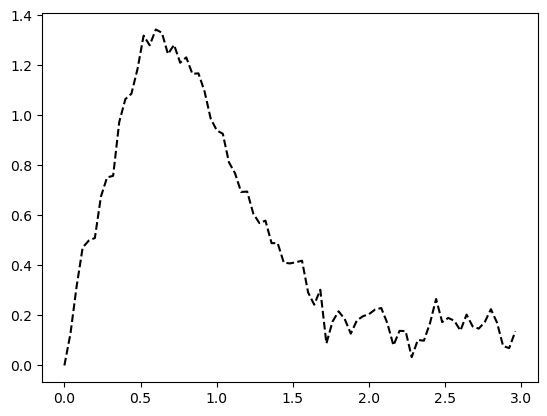

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x153e1c14b7f0>

In [17]:
h_ind=2
x = grid_jl.kr[1:75] .* Ld


plt.plot(x,ph12_kap1p0[h_ind,:],"k--", label=L"\kappa^* = 1.0")


In [20]:
νstar = 0. # 
μstar = 1.0
drag_bool = true

Nx=1024

L=Lx=Ly=25*2*pi*Ld

# layer-wise phase shift
ph12_max_mu1, ph12_mu1, mi12_mu1 = phases_12(U,ρ,H, μstar, νstar, drag_bool, L, h0s,75);

# # modal phase shift
phm_max_mu1, phm_mu1, mim_mu1 = phases_modes(U, ρ, H, μstar, νstar, drag_bool, L, h0s, 75);


In [21]:
using FileIO, JLD2

fn = data_dir*"phases_kappas.jld"

jld_data = Dict("ph12_mu1" => ph12_mu1, "phm_mu1" => phm_mu1)

Dict{String, Vector{Float64}} with 2 entries:
  "phm_mu1"  => [0.343523, 0.351737, 0.355917, 0.360365, 0.358394, 0.347713, 0.…
  "ph12_mu1" => [1.00724, 0.965966, 0.912069, 0.868573, 0.826475, 0.76909, 0.70…

In [5]:
fn = data_dir*"phases_kappas.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

LoadError: ArgumentError: No file exists at given path: ../../data/two_layer_drag_study/phases_unweighted_kappas.jld

In [12]:
using FileIO, JLD2

# fn = data_dir*"phases_unweighted_kap0p25.jld"
fn = data_dir*"phases_weighted_kap0p25.jld"


jld_data = Dict("ph12_kap0p25" => ph12_kap0p25,
    "mi12_kap0p25" => mi12_kap0p25,
    "phm_kap0p25" => phm_kap0p25,
    "mim_kap0p25" => mim_kap0p25)

jldsave(fn; jld_data)

In [15]:
using FileIO, JLD2

fn = data_dir*"phases_unweighted_kappas.jld"

jld_data = Dict("ph12_kap0p125" => ph12_kap0p125,
    "ph12_kap0p125" => ph12_kap0p125,
    "mi12_kap0p125" => mi12_kap0p125,
    "phm_kap0p125" => phm_kap0p125,
    "phm_kap0p125" => phm_kap0p125,
    "mim_kap0p125" => mim_kap0p125,
    "ph12_kap0p5" => ph12_kap0p5,
    "ph12_kap0p5" => ph12_kap0p5,
    "mi12_kap0p5" => mi12_kap0p5,
    "phm_kap0p5" => phm_kap0p5,
    "phm_kap0p5" => phm_kap0p5,
    "mim_kap0p5" => mim_kap0p5,
    "ph12_kap1p0" => ph12_kap1p0,
    "ph12_kap1p0" => ph12_kap1p0,
    "mi12_kap1p0" => mi12_kap1p0,
    "phm_kap1p0" => phm_kap1p0,
    "phm_kap1p0" => phm_kap1p0,
    "mim_kap1p0" => mim_kap1p0,
    "ph12_kap2p0" => ph12_kap2p0,
    "ph12_kap2p0" => ph12_kap2p0,
    "mi12_kap2p0" => mi12_kap2p0,
    "phm_kap2p0" => phm_kap2p0,
    "phm_kap2p0" => phm_kap2p0,
    "mim_kap2p0" => mim_kap2p0,
    "ph12_kap4p0" => ph12_kap4p0,
    "ph12_kap4p0" => ph12_kap4p0,
    "mi12_kap4p0" => mi12_kap4p0,
    "phm_kap4p0" => phm_kap4p0,
    "phm_kap4p0" => phm_kap4p0,
    "mim_kap4p0" => mim_kap4p0)


jldsave(fn; jld_data)



LoadError: UndefVarError: `mim_kap4p0` not defined

In [ ]:
using FileIO, JLD2

fn = data_dir*"phases_kappas_12.jld"

jld_data = Dict("ph12_kap0p125" => ph12_kap0p125,
"ph12_kap0p5" => ph12_kap0p5,
"ph12_kap1p0" => ph12_kap1p0,
"ph12_kap2p0" => ph12_kap2p0,
"ph12_kap4p0" => ph12_kap4p0)


jldsave(fn; jld_data)

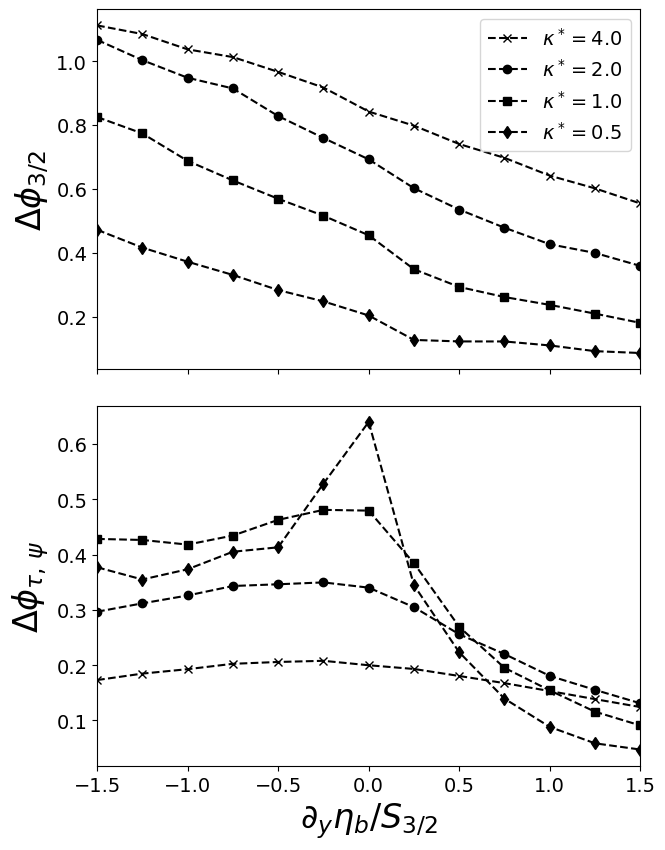

In [11]:
fig, ax = plt.subplots(2,1,figsize=(6,8))
fig.tight_layout(pad=0.5)
ax1=ax[1]; ax2=ax[2];

lsize = 24
tsize = 14

x = h0s./ S32

#######################################################################################################
# ax1.plot(x, ph12_max_kap2p0, color="k", marker="o", linestyle="--", label=L"\kappa^* = 2.0")
# ax1.plot(x, ph12_max_kap1p0, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax1.plot(x, ph12_max_kap0p5, color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")
ax1.plot(x, ph12_kap4p0, color="k", marker="x", linestyle="--", label=L"\kappa^* = 4.0")
ax1.plot(x, ph12_kap2p0, color="k", marker="o", linestyle="--", label=L"\kappa^* = 2.0")
ax1.plot(x, ph12_kap1p0, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, ph12_kap0p5, color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")


ax1.set_ylabel(L"\Delta \phi_{3/2}", fontsize=lsize)

ax1.set_xlim(x[1], x[end])

ax1.set_xticklabels([])
ax1.tick_params(labelsize=tsize)

ax1.legend(fontsize=tsize)

#######################################################################################################
# ax2.plot(x, phm_max_kap2p0, color="k", marker="o", linestyle="--")
# ax2.plot(x, phm_max_kap0p5, color="k", marker="d", linestyle="--")
# ax2.plot(x, phm_max_kap1p0, color="k", marker="s", linestyle="--")

ax2.plot(x, phm_kap4p0, color="k", marker="x", linestyle="--")
ax2.plot(x, phm_kap2p0, color="k", marker="o", linestyle="--")
ax2.plot(x, phm_kap1p0, color="k", marker="s", linestyle="--")
ax2.plot(x, phm_kap0p5, color="k", marker="d", linestyle="--")

ax2.set_ylabel(L"\Delta \phi_{\tau, \, \psi}", fontsize=lsize)

ax2.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax2.set_xlim(x[1], x[end])

ax2.tick_params(labelsize=tsize)


#######################################################################################################

# savefig("./drag_figs/phases.png",bbox_inches="tight")




In [14]:

function plot_info_box(ax, var, x, y, plus_mode, fsize)
    textstr = var * "\n" * L"+ \rightarrow" * plus_mode

    # these are matplotlib.patch.Patch properties
    props = Dict("boxstyle"=>"round", "facecolor"=>"wheat", "alpha"=>0.5)
    
    # place a text box in upper left in axes coords
    ax.text(x, y, textstr, transform=ax.transAxes, fontsize=fsize,
            ha="left", va="top", bbox=props)

    return nothing
end


plot_info_box (generic function with 1 method)

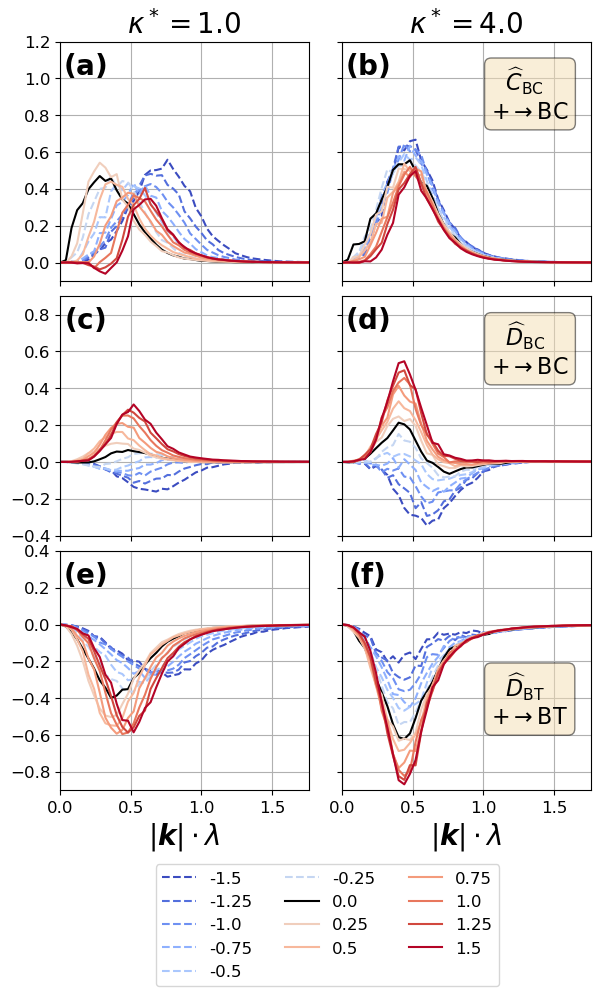

In [18]:

# a plot of KE_1 from all six combos of rho and U
fig,ax = PyPlot.subplots(3,2,figsize=(5.5, 7.5))
fig.tight_layout(pad=-1.0)

# h_ind=17
xmax_ind = 45
x = grid_jl.kr[1:xmax_ind] .* Ld

fsize = 20
bsize = 16
lsize = 12


####################################################################

####################################################################
for i in range(1, length(ax))
    axn = ax[i]
    for h_ind in range(1,length(h0s))
        if h_ind<7
            lt = "dashed"
        elseif h_ind>=7
            lt="solid"
        end

        if i==1
            axn.plot(x, CBC_nu0_kap1[1:xmax_ind, h_ind] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==2
            axn.plot(x, Drag_nu0_kap1[1:xmax_ind, h_ind,2] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==3

            axn.plot(x, Drag_nu0_kap1[1:xmax_ind, h_ind,1] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==4
            axn.plot(x, CBC_nu0_kap4[1:xmax_ind, h_ind] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==5
            axn.plot(x, Drag_nu0_kap4[1:xmax_ind, h_ind,2] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        elseif i==6
            axn.plot(x, Drag_nu0_kap4[1:xmax_ind, h_ind,1] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        end

    GC.gc()
    end
    axn.grid()
    axn.tick_params(labelsize=lsize)
    axn.set_xlim(x[1], x[xmax_ind])
    
end


####################################################################################
ax[1].set_xticklabels([])
ax[2].set_xticklabels([])
ax[4].set_xticklabels([])
ax[5].set_xticklabels([])

ax[4].set_yticklabels([])
ax[5].set_yticklabels([])
ax[6].set_yticklabels([])


ax[3].legend(fontsize=lsize, bbox_to_anchor=(1.8,-0.275), ncol=3)


ax[1].set_title(L"\kappa^* = 1.0", fontsize=fsize)
ax[4].set_title(L"\kappa^* = 4.0", fontsize=fsize)

ax[3].set_xlabel(L" | \boldsymbol{k} | \cdot \lambda", fontsize=fsize)

ax[6].set_xlabel(L" | \boldsymbol{k} | \cdot \lambda", fontsize=fsize)


# ax3.set_ylim(ax3.get_ylim()[1],1.2)

ax[1].text(0.1, 0.9, L"\mathbf{(a)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[2].text(0.1, 0.9, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[2].transAxes);
ax[3].text(0.1, 0.9, L"\mathbf{(e)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[3].transAxes);
ax[4].text(0.1, 0.9, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[4].transAxes);
ax[5].text(0.1, 0.9, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[5].transAxes);
ax[6].text(0.1, 0.9, L"\mathbf{(f)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[6].transAxes);


ymins = [-0.1, -0.4, -0.9]
ymaxes = ymins .+ 1.3

for i in range(1,size(ax)[1])
    # ymax = maximum([ax[i].get_ylim()[2], ax[i+size(ax)[1]].get_ylim()[2]])
    # ymin = minimum([ax[i].get_ylim()[1], ax[i+size(ax)[1]].get_ylim()[1]])

    # ax[i].set_ylim(ymin, ymax)
    # ax[i+size(ax)[1]].set_ylim(ymin, ymax)

    ax[i].set_ylim(ymins[i], ymaxes[i])
    ax[i+size(ax)[1]].set_ylim(ymins[i], ymaxes[i])
end

# ax[3].set_ylim(ax[3].get_ylim()[1], ax[3].get_ylim()[2]+0.2)
# ax[6].set_ylim(ax[6].get_ylim()[1], ax[6].get_ylim()[2]+0.2)



###################################################################
###################################################################

plot_info_box(ax[4], L"\ \ \widehat{C}_\mathrm{BC}", 0.6, 0.9, "BC", bsize)
plot_info_box(ax[5], L"\ \ \widehat{D}_\mathrm{BC}", 0.6, 0.9, "BC", bsize)
plot_info_box(ax[6], L"\ \ \widehat{D}_\mathrm{BT}", 0.6, 0.5, "BT", bsize)


savefig("./drag_figs/SS_kspace.pdf",bbox_inches="tight", transparent=true)



h_color (generic function with 1 method)

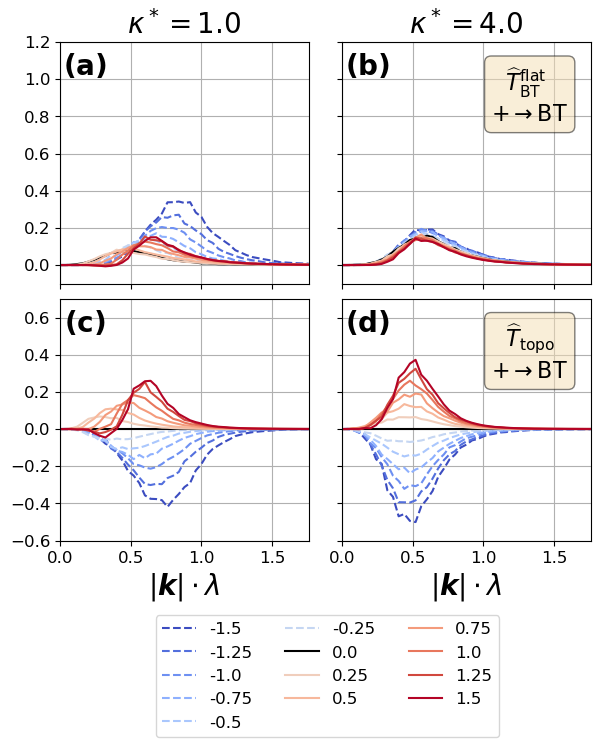

In [15]:

# a plot of KE_1 from all six combos of rho and U
fig,ax = PyPlot.subplots(2,2,figsize=(5.5,5))
fig.tight_layout(pad=-1.0)

# h_ind=17

xmax_ind = 45
x = grid_jl.kr[1:xmax_ind] .* Ld

fsize = 20
bsize = 16
lsize = 12


####################################################################

####################################################################
for i in [1,2,3,4]
    axn = ax[i]
    for h_ind in range(1,length(h0s))
        if h_ind<7
            lt = "dashed"
        elseif h_ind>=7
            lt="solid"
        end

        if i==1
            axn.plot(x, LF_nu0_kap1[1:xmax_ind, h_ind,1] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            # axn.plot(x, NLBT_nu0_kap4[1:75,h_ind,1] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==2

            axn.plot(x, LF_nu0_kap1[1:xmax_ind, h_ind,2] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==3
            axn.plot(x, LF_nu0_kap4[1:xmax_ind, h_ind,1] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            # axn.plot(x, NLBT_nu0_kap0p5[1:75,h_ind,1] .* (vel_scales_kap0p5[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        elseif i==4
            axn.plot(x, LF_nu0_kap4[1:xmax_ind, h_ind,2] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            # axn.plot(x, NLBT_nu0_kap0p5[1:75,h_ind,2] .* (vel_scales_kap0p5[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        end

    GC.gc()
    end
    axn.grid()
    axn.tick_params(labelsize=lsize)
    axn.set_xlim(x[1], x[xmax_ind])
    
end


####################################################################################

ax[1].set_xticklabels([])
ax[3].set_xticklabels([])

ax[3].set_yticklabels([])
ax[4].set_yticklabels([])


ax[2].legend(fontsize=lsize, bbox_to_anchor=(1.8,-0.275), ncol=3)


ax[1].set_title(L"\kappa^* = 1.0", fontsize=fsize)
ax[3].set_title(L"\kappa^* = 4.0", fontsize=fsize)

ax[2].set_xlabel(L" | \boldsymbol{k} | \cdot \lambda", fontsize=fsize)

ax[4].set_xlabel(L" | \boldsymbol{k} | \cdot \lambda", fontsize=fsize)


ax[1].text(0.1, 0.9, L"\mathbf{(a)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[2].text(0.1, 0.9, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[2].transAxes);
ax[3].text(0.1, 0.9, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[3].transAxes);
ax[4].text(0.1, 0.9, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[4].transAxes);


ymins = [-0.1, -0.6]
ymaxes = ymins .+ 1.3

for i in range(1,size(ax)[1])
    # ymax = maximum([ax[i].get_ylim()[2], ax[i+size(ax)[1]].get_ylim()[2]])
    # ymin = minimum([ax[i].get_ylim()[1], ax[i+size(ax)[1]].get_ylim()[1]])

    # ax[i].set_ylim(ymin, ymax)
    # ax[i+size(ax)[1]].set_ylim(ymin, ymax)

    ax[i].set_ylim(ymins[i], ymaxes[i])
    ax[i+size(ax)[1]].set_ylim(ymins[i], ymaxes[i])
end

###################################################################
###################################################################

plot_info_box(ax[3], L"\ \ \widehat{T}^\mathrm{flat}_\mathrm{BT}", 0.6, 0.9, "BT", bsize)
plot_info_box(ax[4], L"\ \ \widehat{T}_\mathrm{topo}", 0.6, 0.9, "BT", bsize)

savefig("./drag_figs/LF_kspace.pdf",bbox_inches="tight", transparent=true)


In [57]:
# NLBT1 is EKE cons.
# NLBT2 is EKE transfer

# NLBC1 is transfer
# NLBC2 is EKE cons.
# NLBC3 is EAPE cons.


plot_info_box (generic function with 1 method)

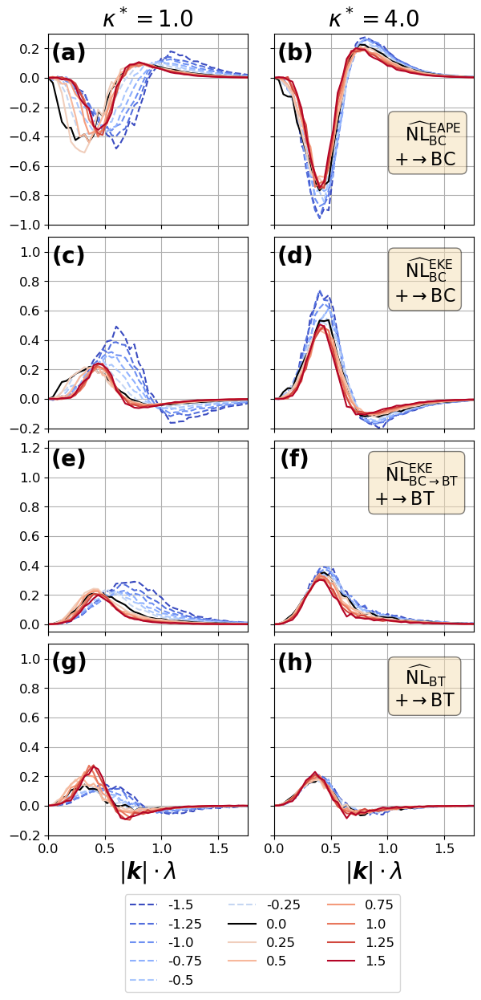

In [16]:

# a plot of KE_1 from all six combos of rho and U
fig,ax = PyPlot.subplots(4,2,figsize=(5.5,10))
fig.tight_layout(pad=-1.0)

xmax_ind = 45

x = grid_jl.kr[1:xmax_ind] .* Ld

fsize = 20
bsize=16
lsize = 12


####################################################################

####################################################################
for i in range(1,length(ax))
    axn = ax[i]
    for h_ind in range(1,length(h0s))
        if h_ind==5
            axn.plot(NaN, NaN, "-", color="none", label="")
        end
        
        if h_ind<7
            lt = "dashed"
        elseif h_ind>=7
            lt="solid"
        end

        if i==1
            axn.plot(x, NLBC_nu0_kap1[1:xmax_ind,h_ind,3] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==2
            axn.plot(x, NLBC_nu0_kap1[1:xmax_ind,h_ind,2] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        elseif i==3
            axn.plot(x, NLBT_nu0_kap1[1:xmax_ind,h_ind,2] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==4
            axn.plot(x, NLBT_nu0_kap1[1:xmax_ind,h_ind,1] .* (vel_scales_kap1[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==5
              axn.plot(x, NLBC_nu0_kap4[1:xmax_ind,h_ind,3] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)         

        elseif i==6

            axn.plot(x, NLBC_nu0_kap4[1:xmax_ind,h_ind,2] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        elseif i==7
            axn.plot(x, NLBT_nu0_kap4[1:xmax_ind,h_ind,2] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==8
            axn.plot(x, NLBT_nu0_kap4[1:xmax_ind,h_ind,1] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        end

    GC.gc()
    end
    axn.grid()
    axn.tick_params(labelsize=lsize)
    axn.set_xlim(x[1], x[xmax_ind])
    
end


####################################################################################
ax[1].set_xticklabels([])
ax[2].set_xticklabels([])
ax[3].set_xticklabels([])
ax[5].set_xticklabels([])
ax[6].set_xticklabels([])
ax[7].set_xticklabels([])

ax[5].set_yticklabels([])
ax[6].set_yticklabels([])
ax[7].set_yticklabels([])
ax[8].set_yticklabels([])



ax[4].legend(fontsize=lsize, bbox_to_anchor=(1.8,-0.275), ncol=3)


ax[1].set_title(L"\kappa^* = 1.0", fontsize=fsize)
ax[5].set_title(L"\kappa^* = 4.0", fontsize=fsize)

ax[4].set_xlabel(L" | \boldsymbol{k} | \cdot \lambda", fontsize=fsize)

ax[8].set_xlabel(L" | \boldsymbol{k} | \cdot \lambda", fontsize=fsize)


ax[1].text(0.1, 0.9, L"\mathbf{(a)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[2].text(0.1, 0.9, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[2].transAxes);
ax[3].text(0.1, 0.9, L"\mathbf{(e)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[3].transAxes);
ax[4].text(0.1, 0.9, L"\mathbf{(g)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[4].transAxes);
ax[5].text(0.1, 0.9, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[5].transAxes);
ax[6].text(0.1, 0.9, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[6].transAxes);
ax[7].text(0.1, 0.9, L"\mathbf{(f)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[7].transAxes);
ax[8].text(0.1, 0.9, L"\mathbf{(h)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[8].transAxes);


ymins = [-1.0, -0.2, -0.05, -0.2]
ymaxes = ymins .+ 1.3

for i in range(1,size(ax)[1])
    # ymax = maximum([ax[i].get_ylim()[2], ax[i+size(ax)[1]].get_ylim()[2]])
    # ymin = minimum([ax[i].get_ylim()[1], ax[i+size(ax)[1]].get_ylim()[1]])

    # ax[i].set_ylim(ymin, ymax)
    # ax[i+size(ax)[1]].set_ylim(ymin, ymax)

    ax[i].set_ylim(ymins[i], ymaxes[i])
    ax[i+size(ax)[1]].set_ylim(ymins[i], ymaxes[i])
end
# ax4.set_yscale("symlog")

######################################################################################
######################################################################################

plot_info_box(ax[5], L"\ \ \widehat{\mathrm{NL}}^\mathrm{EAPE}_\mathrm{BC}", 0.6, 0.55, "BC", bsize)
plot_info_box(ax[6], L"\ \ \widehat{\mathrm{NL}}^\mathrm{EKE}_\mathrm{BC}", 0.6, 0.9, "BC", bsize)
plot_info_box(ax[7], L"\ \ \widehat{\mathrm{NL}}^\mathrm{EKE}_{\mathrm{BC} \rightarrow \mathrm{BT}}", 0.5, 0.9, "BT", bsize)
plot_info_box(ax[8], L"\ \ \widehat{\mathrm{NL}}_\mathrm{BT}", 0.6, 0.9, "BT", bsize)



savefig("./drag_figs/NL_kspace.pdf",bbox_inches="tight", transparent=true)


# negative phase shifts for the positive slopes at large wavenumbers corresponds
# to the slight forward cascade seen in their spectra

# will we see same thing for flat-bottom as drag is varied?

In [26]:
fn = data_dir*"modal_spec_budget_nu0_kap1.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

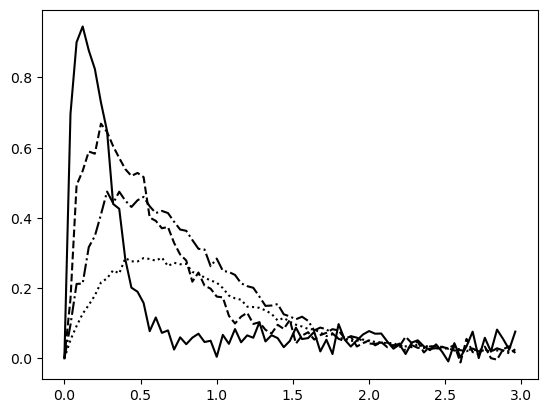

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x153d466f7e80>

In [54]:
fig, ax = plt.subplots(1,1,)

h_ind = 7
x = grid_jl.kr[1:75] .* 28325



ax.plot(x,phm_kap0p5[h_ind,:],"k-", label=L"\kappa^* = 0.5")

ax.plot(x,phm_kap1p0[h_ind,:],"k--", label=L"\kappa^* = 1.0")

ax.plot(x,phm_kap2p0[h_ind,:],"k-.", label=L"\kappa^* = 2.0")

ax.plot(x,phm_kap4p0[h_ind,:],"k", linestyle="dotted", label=L"\kappa^* = 4.0")

######################################################



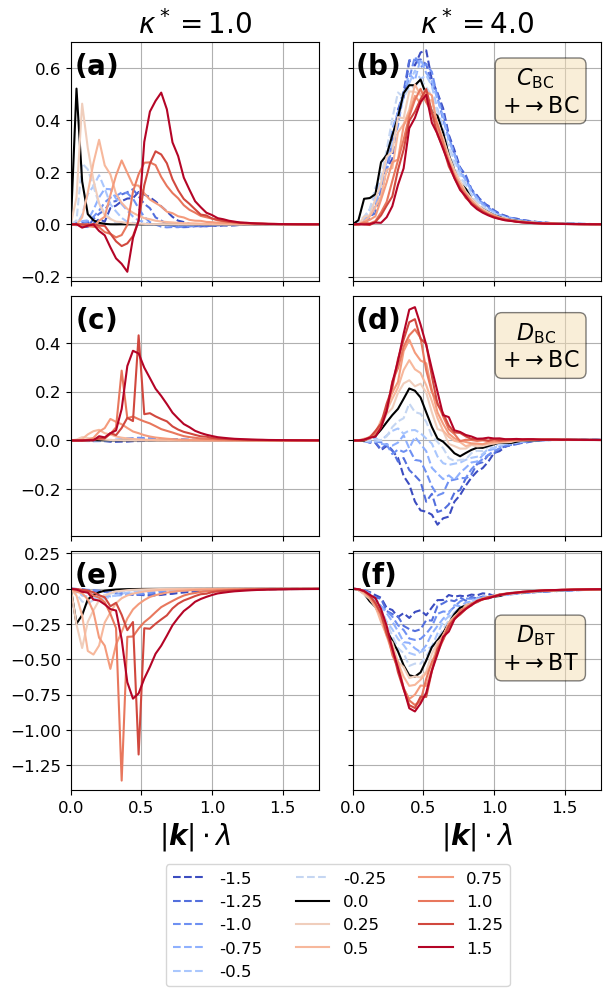

In [19]:

# a plot of KE_1 from all six combos of rho and U
fig,ax = PyPlot.subplots(3,2,figsize=(5.5, 7.5))
fig.tight_layout(pad=-1.0)

# h_ind=17
xmax_ind = 45
x = grid_jl.kr[1:xmax_ind] .* Ld

fsize = 20
bsize = 16
lsize = 12


####################################################################

####################################################################
for i in range(1, length(ax))
    axn = ax[i]
    for h_ind in range(1,length(h0s))
        if h_ind<7
            lt = "dashed"
        elseif h_ind>=7
            lt="solid"
        end

        if i==1
            axn.plot(x, CBC_nu0_kap0p25[1:xmax_ind, h_ind] .* (vel_scales_kap0p25[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==2
            axn.plot(x, Drag_nu0_kap0p25[1:xmax_ind, h_ind,2] .* (vel_scales_kap0p25[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==3

            axn.plot(x, Drag_nu0_kap0p25[1:xmax_ind, h_ind,1] .* (vel_scales_kap0p25[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==4
            axn.plot(x, CBC_nu0_kap4[1:xmax_ind, h_ind] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)

        elseif i==5
            axn.plot(x, Drag_nu0_kap4[1:xmax_ind, h_ind,2] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        elseif i==6
            axn.plot(x, Drag_nu0_kap4[1:xmax_ind, h_ind,1] .* (vel_scales_kap4[h_ind,3]^-3 / Ld), label=string(round(h0s[h_ind] / S32, sigdigits=3)), color=h_color(h0s[h_ind],hc_range,colors),linestyle=lt)
            
        end

    GC.gc()
    end
    axn.grid()
    axn.tick_params(labelsize=lsize)
    axn.set_xlim(x[1], x[xmax_ind])
    
end


####################################################################################
ax[1].set_xticklabels([])
ax[2].set_xticklabels([])
ax[4].set_xticklabels([])
ax[5].set_xticklabels([])

ax[4].set_yticklabels([])
ax[5].set_yticklabels([])
ax[6].set_yticklabels([])


ax[3].legend(fontsize=lsize, bbox_to_anchor=(1.8,-0.275), ncol=3)


ax[1].set_title(L"\kappa^* = 1.0", fontsize=fsize)
ax[4].set_title(L"\kappa^* = 4.0", fontsize=fsize)

ax[3].set_xlabel(L" | \boldsymbol{k} | \cdot \lambda", fontsize=fsize)

ax[6].set_xlabel(L" | \boldsymbol{k} | \cdot \lambda", fontsize=fsize)


# ax3.set_ylim(ax3.get_ylim()[1],1.2)

ax[1].text(0.1, 0.9, L"\mathbf{(a)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[2].text(0.1, 0.9, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[2].transAxes);
ax[3].text(0.1, 0.9, L"\mathbf{(e)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[3].transAxes);
ax[4].text(0.1, 0.9, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[4].transAxes);
ax[5].text(0.1, 0.9, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[5].transAxes);
ax[6].text(0.1, 0.9, L"\mathbf{(f)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[6].transAxes);



for i in range(1,size(ax)[1])
    ymax = maximum([ax[i].get_ylim()[2], ax[i+size(ax)[1]].get_ylim()[2]])
    ymin = minimum([ax[i].get_ylim()[1], ax[i+size(ax)[1]].get_ylim()[1]])

    ax[i].set_ylim(ymin, ymax)
    ax[i+size(ax)[1]].set_ylim(ymin, ymax)
end

ax[3].set_ylim(ax[3].get_ylim()[1], ax[3].get_ylim()[2]+0.2)
ax[6].set_ylim(ax[6].get_ylim()[1], ax[6].get_ylim()[2]+0.2)

###################################################################
###################################################################

plot_info_box(ax[4], L"\ \ C_\mathrm{BC}", 0.6, 0.9, "BC", bsize)
plot_info_box(ax[5], L"\ \ D_\mathrm{BC}", 0.6, 0.9, "BC", bsize)
plot_info_box(ax[6], L"\ \ D_\mathrm{BT}", 0.6, 0.7, "BT", bsize)





In [56]:
using Statistics

function tau_scales(vars, params, grid, sol, ψ)

    nlayers = 2
    δ = params.H[1]/params.H[2]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at the interface
    μ = params.μ
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])

    vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    vars.ψh[:,:,2] = rfft(ψ[:,:,2])

    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    
#     vertfluxes, dragfluxes = zeros(grid.nkr,nlayers), zeros(grid.nkr,nlayers+1)

    # Total barotropic velocity
    tau = [sqrt(mean(ψBC.^2))]
        
    return tau

end

tau_scales(prob, ψ) = tau_scales(prob.vars, prob.params, prob.grid, prob.sol, ψ)


tau_scales (generic function with 2 methods)

In [57]:
filt_order = 4
innerK= 2/3


function mean_tau_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx)

    tau_out = zeros(length(h0s))

    if drag_bool==false
        mm = μstar * (U[1] / 2) / Ld
    else
        mm = μstar / Ld
    end
    
    for k in range(1,length(h0s))

        println(k)
        
        topographic_pv_gradient = (0, (f₀/H[end]) * h0s[k])
            
        prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
        μ=mm, β, dt, stepper, aliased_fraction=1/3,drag_bool, filt_order, innerK)

        sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

        GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool,L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        if μstar < 1.55
            N_yr = 90 # round(Int, (length(files)-2)/2)
        else
            N_yr = 90 #length(files)
        end

        ## pre-allocate
        window = Int(round(250 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times
        # nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output

        
        tau_loop = []

        for i in range(N_yr-window+1,N_yr)
            
            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                tau_h = tau_scales(prob,ψ)

                push!(tau_loop, tau_h)  
                

            end

            GC.gc()

        end

        tau_out[k] = mean(tau_loop)[1]

        # println(v)

        GC.gc()

    end
    
    return tau_out
end


mean_tau_scales (generic function with 1 method)

In [26]:
νstar = 0. # 10^-13
μstar = 0.125
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]

tau_scales_kap0p125 = mean_tau_scales(U,ρ,H,h0s[7:end],μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7


In [27]:
μstar = 0.25

tau_scales_kap0p25 = mean_tau_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [28]:
μstar = 0.5

tau_scales_kap0p5 = mean_tau_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [29]:
νstar = 0. # 10^-13
μstar = 1.0
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]

tau_scales_kap1 = mean_tau_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [30]:
μstar = 2.0

tau_scales_kap2 = mean_tau_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [31]:
μstar = 4.0

tau_scales_kap4 = mean_tau_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [41]:
using FileIO, JLD2

fn = data_dir*"tau_scales.jld"

# jld_data = Dict("tau_scales_kap0p5" => tau_scales_kap0p5,
#     "tau_scales_kap1" => tau_scales_kap1,
#     "tau_scales_kap2" => tau_scales_kap2,
#     "tau_scales_kap4" => tau_scales_kap4,
#     "tau_scales_kap0p125" => tau_scales_kap0p125,
#     "tau_scales_kap0p25" => tau_scales_kap0p25)


# jldsave(fn; jld_data)


a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [55]:
i=90
k=7

tau_loop = []

a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

s = size(a["jld_data"]["psi_ot"])

if length(s)>3
    s=s[4]
else
    s=1
end

for j in range(1,s)
    ψ = a["jld_data"]["psi_ot"][:,:,:,j]

    tau_h = tau_scales(prob,ψ)

    push!(tau_loop, tau_h)  
    

end

GC.gc()


mean(tau_loop)[1]



1.4432899320127035e-15

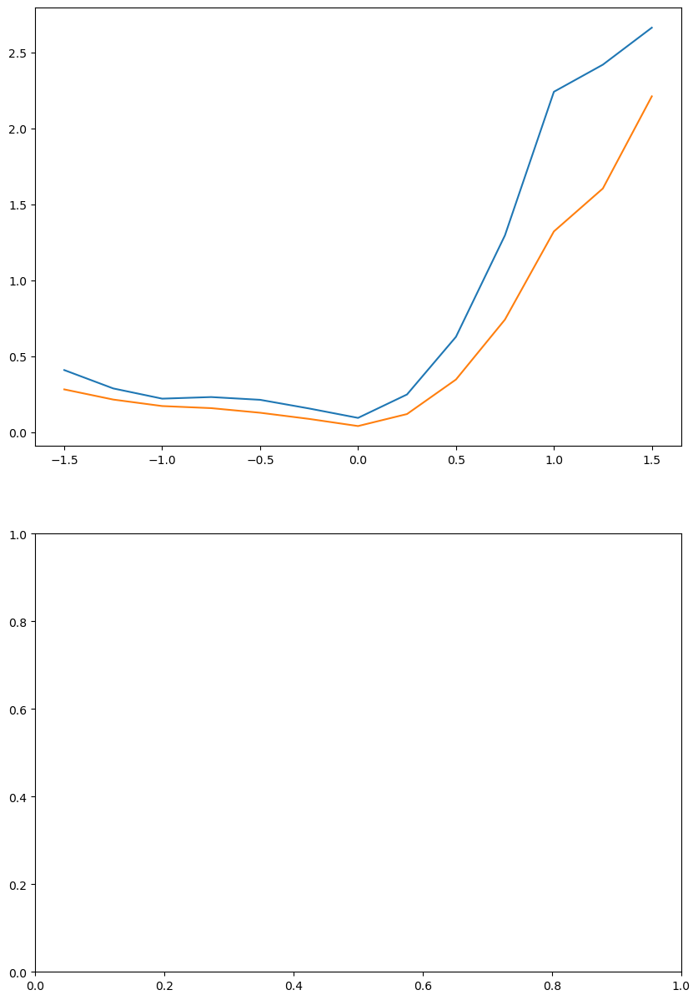

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x14689818f730>

In [82]:

CBC_prod = (params.f₀ / params.H[1]) * S32 .* tau_scales_kap1 .* vel_scales_kap1[:,1]



fig, ax = plt.subplots(2,1, figsize=(10,15))

ax1=ax[1]; ax2=ax[2];

# ax.plot(tau_scales_kap1 ./ tau_scales_kap1[7])

# axt=ax.twinx()
# ax.plot(vel_scales_kap1[:,1] ./ vel_scales_kap1[7,1], "g-")

x = collect(range(-1.5, 1.5, 13))
x2 = x[7:end]

# ax.plot(x2, vel_scales_kap0p125[:,3] ./ tau_scales_kap0p125, "p-")
# ax.plot(x, vel_scales_kap0p25[:,3] ./ tau_scales_kap0p25, "c-")
# ax.plot(x, vel_scales_kap0p5[:,3] ./ tau_scales_kap0p5, "b-")
# ax.plot(x, vel_scales_kap1[:,3] ./ tau_scales_kap1, "g-")
# ax.plot(x, vel_scales_kap2[:,3] ./ tau_scales_kap2, "r-")
# ax.plot(x, vel_scales_kap4[:,3] ./ tau_scales_kap4, "k-")


# ax.plot(x2, tau_scales_kap0p125 ./ vel_scales_kap0p125[:,3], "p-")
# ax.plot(x, tau_scales_kap0p25 ./ vel_scales_kap0p25[:,3], "c-")
# ax.plot(x, tau_scales_kap0p5 ./ vel_scales_kap0p5[:,3], "b-")
# ax.plot(x, tau_scales_kap1 ./ vel_scales_kap1[:,3], "g-")
# ax.plot(x, tau_scales_kap2 ./ vel_scales_kap2[:,3], "r-")
# ax.plot(x, tau_scales_kap4 ./ vel_scales_kap4[:,3], "k-")

# ax1.plot(x2, tau_scales_kap0p125 , "p-")
# ax1.plot(x, tau_scales_kap0p25, "c-")
# ax1.plot(x, tau_scales_kap0p5, "b-")
# ax1.plot(x, tau_scales_kap1, "g-")
# ax1.plot(x, tau_scales_kap2, "r-")
# ax1.plot(x, tau_scales_kap4, "k-")


# ax2.plot(x2, vel_scales_kap0p125[:,3], "p-")
# ax2.plot(x, vel_scales_kap0p25[:,3], "c-")
# ax2.plot(x, vel_scales_kap0p5[:,3], "b-")
# ax2.plot(x, vel_scales_kap1[:,3], "g-")
# ax2.plot(x, vel_scales_kap2[:,3], "r-")
# ax2.plot(x, vel_scales_kap4[:,3], "k-")



# ax1.set_yscale("log")
# ax2.set_yscale("log")

# axt.set_yscale("log")

# number of vortices per domain size, i.e., density
# avg. radius of vortices 
# avg. velocity strength of vortices
# avg. interfacial displacement of vortices
kaps = [0.125, 0.25, 0.5, 1.0, 2.0, 4.0]

# tau_ratios = [tau_scales_kap0p125[end] / tau_scales_kap0p125[1],
#     tau_scales_kap0p25[end] / tau_scales_kap0p25[7],
#     tau_scales_kap0p5[end] / tau_scales_kap0p5[7],
#     tau_scales_kap1[end] / tau_scales_kap1[7],
#     tau_scales_kap2[end] / tau_scales_kap2[7],
#     tau_scales_kap4[end] / tau_scales_kap4[7]]

tau_ratios = tau_scales_kap2 ./ tau_scales_kap0p25
vBT_ratios = vel_scales_kap2[:,3] ./ vel_scales_kap0p25[:,3]

# vBT_ratios = [vel_scales_kap0p125[end,3] / vel_scales_kap0p125[1,3],
#     vel_scales_kap0p25[end,3] / vel_scales_kap0p25[7,3],
#     vel_scales_kap0p5[end,3] / vel_scales_kap0p5[7,3],
#     vel_scales_kap1[end,3] / vel_scales_kap1[7,3],
#     vel_scales_kap2[end,3] / vel_scales_kap2[7,3],
#     vel_scales_kap4[end,3] / vel_scales_kap4[7,3]]


ax1.plot(x, tau_ratios)
ax1.plot(x, vBT_ratios)


# Calculating different velocity scales

In [14]:
using Statistics

function vel_scales(vars, params, grid, sol, ψ)

    nlayers = 2
    δ = params.H[1]/params.H[2]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at the interface
    μ = params.μ
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])

    vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    vars.ψh[:,:,2] = rfft(ψ[:,:,2])

    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])

    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)

    ψ1h = rfft(ψ[:,:,1])
    ψ2h = rfft(ψ[:,:,2])

    ∂xψBC = irfft(im * grid.kr .* ψBCh, grid.ny)
    ∂xψBT = irfft(im * grid.kr .* ψBTh, grid.ny)

    ∂yψBC = irfft(im * grid.l .* ψBCh, grid.ny)
    ∂yψBT = irfft(im * grid.l .* ψBTh, grid.ny)

    ∂xψ1 = irfft(im * grid.kr .* ψ1h, grid.ny)
    ∂xψ2 = irfft(im * grid.kr .* ψ2h, grid.ny)

    ∂yψ1 = irfft(im * grid.l .* ψ1h, grid.ny)
    ∂yψ2 = irfft(im * grid.l .* ψ2h, grid.ny)
    
    
#     vertfluxes, dragfluxes = zeros(grid.nkr,nlayers), zeros(grid.nkr,nlayers+1)

    # Total barotropic velocity
    v = [sqrt(mean(∂xψBT.^2 .+ ∂yψBT.^2))]
    
    # U and V components of barotropic velocity
    push!(v, sqrt(mean(∂yψBT.^2)))
    push!(v, sqrt(mean(∂xψBT.^2)))

    # Total BCvelocity
    push!(v, sqrt(mean(∂xψBC.^2 .+ ∂yψBC.^2)))
    
    # U and V components of BC velocity
    push!(v, sqrt(mean(∂yψBC.^2)))
    push!(v, sqrt(mean(∂xψBC.^2)))

    # Total L1 velocity
    push!(v, sqrt(mean(∂xψ1.^2 .+ ∂yψ1.^2)))
    
    # U and V components of L1 velocity
    push!(v, sqrt(mean(∂yψ1.^2)))
    push!(v, sqrt(mean(∂xψ1.^2)))

    # Total L2 velocity
    push!(v, sqrt(mean(∂xψ2.^2 .+ ∂yψ2.^2)))
    
    # U and V components of L2 velocity
    push!(v, sqrt(mean(∂yψ2.^2)))
    push!(v, sqrt(mean(∂xψ2.^2)))
        
    return v

end

vel_scales(prob, ψ) = vel_scales(prob.vars, prob.params, prob.grid, prob.sol, ψ)


vel_scales (generic function with 2 methods)

In [15]:
filt_order = 4
innerK= 2/3


function mean_vel_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx)

    n_scales=12
    v_out = zeros(length(h0s),n_scales)

    if drag_bool==false
        mm = μstar * (U[1] / 2) / Ld
    else
        mm = μstar / Ld
    end
    
    for k in range(1,length(h0s))

        println(k)
        
        topographic_pv_gradient = (0, (f₀/H[end]) * h0s[k])
            
        prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
        μ=mm, β, dt, stepper, aliased_fraction=1/3,drag_bool, filt_order, innerK)

        sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

        GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool,L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        if μstar < 1.55
            N_yr = 90 # round(Int, (length(files)-2)/2)
        else
            N_yr = 90 #length(files)
        end

        ## pre-allocate
        window = Int(round(250 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times
        # nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output

        
        v = zeros(n_scales,0)

        for i in range(N_yr-window+1,N_yr)
            
            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                v_h = vel_scales(prob,ψ)

                v = hcat(v, v_h)   
                

            end

            GC.gc()

        end

        v_out[k,:] = mean(v,dims=2)

        # println(v)

        GC.gc()

    end
    
    return v_out
end


mean_vel_scales (generic function with 1 method)

In [33]:
νstar = 0. # 10^-13
μstar = 0.125
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]

vel_scales_kap0p125 = mean_vel_scales(U,ρ,H,h0s[7:end],μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7


In [34]:
μstar = 0.25

vel_scales_kap0p25 = mean_vel_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [16]:
νstar = 0. # 10^-13
μstar = 1.0
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]

vel_scales_kap1 = mean_vel_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [17]:
μstar = 0.5

vel_scales_kap0p5 = mean_vel_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [18]:
μstar = 2.0

vel_scales_kap2 = mean_vel_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


In [19]:
μstar = 4.0

vel_scales_kap4 = mean_vel_scales(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx);

1
2
3
4
5
6
7
8
9
10
11
12
13


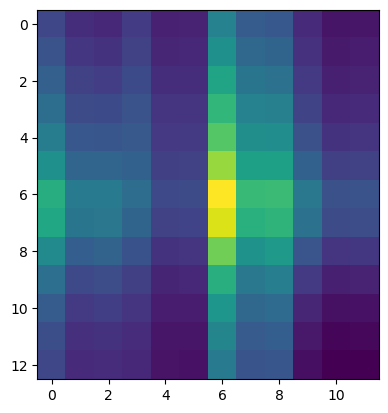

(13, 12)

In [126]:
plt.imshow(vel_scales_kap1)

size(vel_scales_kap1)

# BT, BC, L1, L2: total, u, v

In [43]:
using FileIO, JLD2

fn = data_dir*"vel_scales.jld"

# jld_data = Dict("vel_scales_kap0p5" => vel_scales_kap0p5,
#     "vel_scales_kap1" => vel_scales_kap1,
#     "vel_scales_kap2" => vel_scales_kap2,
#     "vel_scales_kap4" => vel_scales_kap4,
#     "vel_scales_kap0p125" => vel_scales_kap0p125,
#     "vel_scales_kap0p25" => vel_scales_kap0p25)


# jldsave(fn; jld_data)


a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


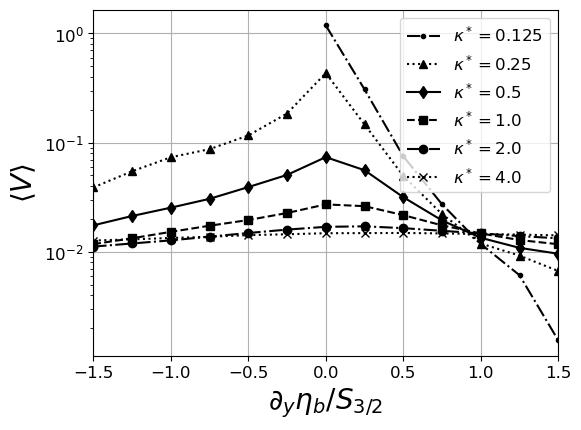

(-1.5, 1.5)

In [23]:
fig, ax1 = plt.subplots(1,1, figsize=(6,4.5))

lsize = 20
tsize = 12

x = h0s ./ S32
x2 = x[7:end]

scale_ind = 1
scale_ind2 = 4

############################################################################
# vel scales are twelve
# total BT, U BT, V BT, total BC, U BC, V BC, total L1, U L1, V L1, total L2, U L2, V L2
############################################################################
ax1.plot(x2, vel_scales_kap0p125[:,scale_ind] , color="k", marker=".", linestyle="-.", label=L"\kappa^* = 0.125")
ax1.plot(x, vel_scales_kap0p25[:,scale_ind] , color="k", marker="^", linestyle="dotted", label=L"\kappa^* = 0.25")
ax1.plot(x, vel_scales_kap0p5[:,scale_ind] , color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, vel_scales_kap1[:,scale_ind] , color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, vel_scales_kap2[:,scale_ind] , color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax1.plot(x, vel_scales_kap4[:,scale_ind] , color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

# ax1.plot(x, vel_scales_kap0p5[:,scale_ind2] ./ vel_scales_kap0p5[:,scale_ind]  , color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
# ax1.plot(x, vel_scales_kap1[:,scale_ind2] ./ vel_scales_kap1[:,scale_ind], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax1.plot(x, vel_scales_kap2[:,scale_ind2] ./  vel_scales_kap2[:,scale_ind] , color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
# ax1.plot(x, vel_scales_kap4[:,scale_ind2] ./ vel_scales_kap4[:,scale_ind] , color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")



ax1.set_ylabel(L"\langle V \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax1.legend(fontsize=tsize)
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax1.grid()

ax1.tick_params(labelsize=tsize, which="both")

ax1.set_yscale("log")

ax1.set_xlim(x[1], x[end])



# Kinetic energy time series

In [40]:
function define_KE_of_t(model_params)

    @unpack_mod_params model_params

    nlayers = Nz
    
    KE_ot = zeros(0,2)
    # q_ot = zeros(0)
    te = zeros(0)
    
    file1 = jld_name(model_params,1)
    files = glob(file1[2:findfirst("yr",file1)[2]]*"*", data_dir)
    
    N_files = round(Int, (length(files)))
    
    yr_output = zeros(N_files)
    for (i, file) in enumerate(files)
        yr_output[i] = parse(Float64,file[findfirst("yr",file)[2]+1:findfirst(".jld",file)[1]-1])
    end
    
    yr_output = sort(yr_output)
    
    ## pre-allocate
    window = Int(round(100 * (Ld / ((U[1]-U[end])/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times; in years
    N_window = yr_output[end] - window
    start_file_ind = argmin(abs.(yr_output .- N_window))
    
    prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀=f0, H, b, U, nν, ν, eta, topographic_pv_gradient,
    μ, κ, β, dt, stepper, aliased_fraction=1/3);
    
    sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;
    
    for i in range(1,N_files)
        
        a = load(data_dir*jld_name(model_params,yr_output[i]))
            
        s = size(a["jld_data"]["psi_ot"])
        
        if length(s)>3
            s=s[4]
        else
            s=1
        end    
    
        # println(s)
        
        for j in range(1,s)
            ψ = a["jld_data"]["psi_ot"][:,:,:,j]
    
            ψh = deepcopy(vars.ψh); fwdtransform!(ψh, ψ, params)
            
            qh = deepcopy(ψh);                pvfromstreamfunction!(qh, ψh, params, grid_jl)
            
            # q = deepcopy(ψ);                  invtransform!(q, qh, params)
    
            te = vcat(te,(a["jld_data"]["t"][j]* ((U[1]-U[end])/2/Ld)))
    
            abs²∇𝐮h = vars.uh        # use vars.uh as scratch variable
            @. abs²∇𝐮h = grid_jl.Krsq * abs2(ψh)
    
            KE1 = 0.5 * mean(FourierFlows.parsevalsum(view(abs²∇𝐮h, :, :, 1), grid_jl))
            KE2 = 0.5 * mean(FourierFlows.parsevalsum(view(abs²∇𝐮h, :, :, 2), grid_jl))
            
            KE_ot = vcat(KE_ot, [KE1,KE2]')
    
            # q_ot = vcat(q_ot, 0.5 * mean(q[:,:,1].^2 .+ q[:,:,2].^2))
            
        end
        
    end
    return te, KE_ot
end



define_KE_of_t (generic function with 1 method)

In [51]:
model_params = redef_mu_kappa(model_params, μ, κ)
te_mu0p5_kap0p5, KE_ot_mu0p5_kap0p5 = define_KE_of_t(model_params);


In [50]:
model_params = redef_mu_kappa(model_params, μ, 0)
te_mu0p5_kap0, KE_ot_mu0p5_kap0 = define_KE_of_t(model_params);


In [52]:
model_params = redef_mu_kappa(model_params, 0, κ)
te_mu0_kap0p5, KE_ot_mu0_kap0p5 = define_KE_of_t(model_params);


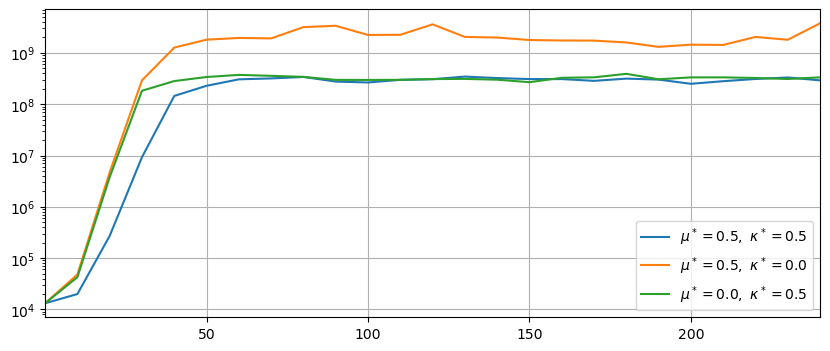

In [55]:
fig, ax = plt.subplots(1,1, figsize=(10,4))

ax.plot(te_mu0p5_kap0p5, KE_ot_mu0p5_kap0p5[:,1], label=L"\mu^* = 0.5, \ \kappa^* = 0.5")

ax.plot(te_mu0p5_kap0, KE_ot_mu0p5_kap0[:,1], label=L"\mu^* = 0.5, \ \kappa^* = 0.0")

ax.plot(te_mu0_kap0p5, KE_ot_mu0_kap0p5[:,1], label=L"\mu^* = 0.0, \ \kappa^* = 0.5")


ax.legend()

ax.set_xlim(te_mu0p5_kap0p5[1], te_mu0p5_kap0p5[end])
ax.grid()

ax.set_yscale("log")
# ax.set_ylim(1e10, ax.get_ylim()[2])
# 

In [105]:
model_params = redef_mu_kappa(model_params, μ, κ)

a = load(data_dir*jld_name(model_params,55.0))

Dict{String, Any} with 1 entry:
  "jld_data" => Dict{String, Array{Float64}}("t"=>[1.67712e9, 1.75003e9], "psi_…

In [106]:
layer_no = 1
time_no = 2

ψ1 = a["jld_data"]["psi_ot"][:,:,1,time_no]
ψ2 = a["jld_data"]["psi_ot"][:,:,2,time_no]

ψ1h = rfft(ψ1)
ψ2h = rfft(ψ2)

ζ1h = - grid.Krsq .* ψ1h
ζ2h = - grid.Krsq .* ψ2h

ζ1 = irfft(ζ1h,grid.ny)
ζ2 = irfft(ζ2h,grid.ny);


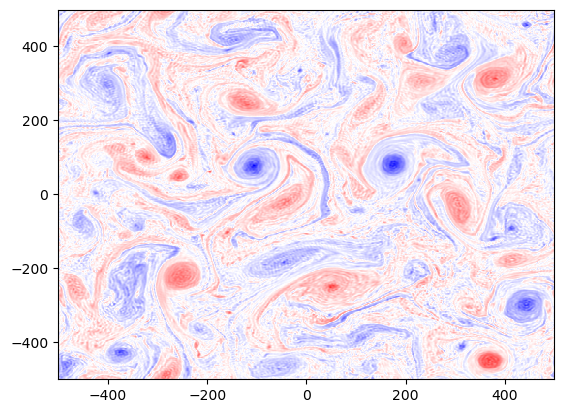

PyObject <matplotlib.collections.QuadMesh object at 0x14bca7e20ca0>

In [107]:

vlim = maximum(abs.(ζ1))

plt.pcolormesh(grid.x ./ 1e3, grid.y ./ 1e3, ζ1, vmin=-vlim, vmax=vlim, cmap=PyPlot.cm.bwr)

In [39]:
using Statistics
using FourierFlows

BTEKE_ot = zeros(0,grid_jl.nkr)
BCEKE_ot = zeros(0,grid_jl.nkr)
EAPE_ot = zeros(0,grid_jl.nkr)


h_ind = 4

νstar = 0. # 
μstar = 0.125
drag_bool = false

Nx=1024

L=Lx=Ly=25*2*pi*Ld

file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,1)
files = glob(file1[34:end-5]*"*", data_dir)

N_yr = 90

rho[1] = ρ[1] = rhos[1]
U[1] = Us[1]

prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, nν, ν, eta, topographic_pv_gradient,
μ, β, dt, stepper, aliased_fraction=1/3);

sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

for i in range(2,N_yr,5)
    
    a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,round(Int,i)))
    
    ψ = a["jld_data"]["psi_ot"][:,:,:,1]

    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])
    
    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)


    BTEKE = @. 0.5 * (conj(ψBTh) * (grid_jl.kr^2 * ψBTh) + ψBTh * conj(grid_jl.kr^2 * ψBTh))

    BCEKE = @. 0.5 * grid_jl.kr^2 * (conj(ψBCh) * ψBCh + ψBCh * conj(ψBCh))
    BCEAPE = @. 0.5 * Ld^-2 * (conj(ψBCh) * ψBCh + ψBCh * conj(ψBCh))    

    
    BTEKE_ot = vcat(BTEKE_ot, isotropic_mean(BTEKE,grid_jl)')
    BCEKE_ot = vcat(BCEKE_ot, isotropic_mean(BCEKE,grid_jl)')
    EAPE_ot = vcat(EAPE_ot, isotropic_mean(BCEAPE,grid_jl)')


end



LoadError: UndefVarError: `isotropic_mean` not defined

In [39]:
νstar = 0. # 10^-13
μstar = 0.5
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m

h_ind = 7


a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,89))
    
ψ = a["jld_data"]["psi_ot"][:,:,:,1]

ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])

ψBCh = rfft(ψBC)
ψBTh = rfft(ψBT)

∂xψBC = irfft(im * grid_jl.kr .* ψBCh, grid_jl.ny)
∂xψBT = irfft(im * grid_jl.kr .* ψBTh, grid_jl.ny)

∂yψBC = irfft(im * grid_jl.l .* ψBCh, grid_jl.ny)
∂yψBT = irfft(im * grid_jl.l .* ψBTh, grid_jl.ny)

# ζ = zeros(grid.nx, grid.ny, 2)   # irfft(- grid.Krsq .* ψh, grid.nx)
# ζ[:,:,1] = irfft(- grid.Krsq .* vars.ψh[:,:,1], grid.nx)
# ζ[:,:,2] = irfft(- grid.Krsq .* vars.ψh[:,:,2], grid.nx)

# ∂xζ1 = irfft(im * grid.kr .* rfft(ζ[:,:,1]), grid.ny)

ζBC = irfft(- grid_jl.Krsq .* ψBCh, grid_jl.nx)  # BC
ζBT = irfft(- grid_jl.Krsq .* ψBTh, grid_jl.nx)   # BT

∂xζBC = irfft(im * grid_jl.kr .* rfft(ζBC), grid_jl.ny)
∂yζBC = irfft(im * grid_jl.l  .* rfft(ζBC), grid_jl.ny)

∂xζBT = irfft(im * grid_jl.kr .* rfft(ζBT), grid_jl.ny)
∂yζBT = irfft(im * grid_jl.l  .* rfft(ζBT), grid_jl.ny)


# Drag terms
DS = zeros(grid_jl.nx,grid_jl.ny,2)
DS[:,:,1] = @. - (μ/2) * ψBT .* (ζBC .- ζBT)     # BT drag term
DS[:,:,2] = @. (μ/2) * ψBC .* (ζBC .- ζBT);      # BC drag term    

println(sqrt(mean(∂yψBT.^2)))

0.05245987349970317


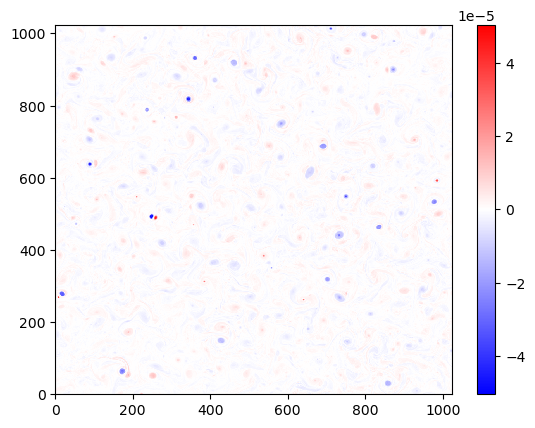

PyObject <matplotlib.colorbar.Colorbar object at 0x14ef9c575450>

In [38]:
lim = maximum(abs.(ζBT))

pc1 = plt.pcolormesh(ζBT', vmin=-lim, vmax=lim, cmap=PyPlot.cm.bwr)

plt.colorbar(pc1)

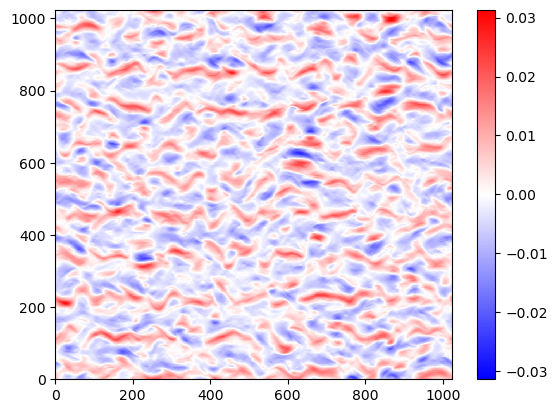

PyObject <matplotlib.colorbar.Colorbar object at 0x14d0fd552140>

In [62]:
# lim = maximum(abs.(DS[:,:,2]))/2

# pc1 = plt.pcolormesh(DS[:,:,2]', vmin=-lim, vmax=lim, cmap=PyPlot.cm.bwr)

lim = maximum(abs.(∂yψBT))

pc1 = plt.pcolormesh(-∂yψBT', vmin=-lim, vmax=lim, cmap=PyPlot.cm.bwr)



plt.colorbar(pc1)

# plt.xlim(200,300)
# plt.ylim(0,100)

In [94]:
    nlayers = 2
    δ = params.H[1]/params.H[2]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at the interface
    μ = params.μ
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])

    vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    vars.ψh[:,:,2] = rfft(ψ[:,:,2])

    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])

    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)

    ψ1h = rfft(ψ[:,:,1])
    ψ2h = rfft(ψ[:,:,2])

    ∂xψBC = irfft(im * grid_jl.kr .* ψBCh, grid_jl.ny)
    ∂xψBT = irfft(im * grid_jl.kr .* ψBTh, grid_jl.ny)

    ∂yψBC = irfft(im * grid_jl.l .* ψBCh, grid_jl.ny)
    ∂yψBT = irfft(im * grid_jl.l .* ψBTh, grid_jl.ny)

    ∂xψ1 = irfft(im * grid_jl.kr .* ψ1h, grid_jl.ny)
    ∂xψ2 = irfft(im * grid_jl.kr .* ψ2h, grid_jl.ny)

    ∂yψ1 = irfft(im * grid_jl.l .* ψ1h, grid_jl.ny)
    ∂yψ2 = irfft(im * grid_jl.l .* ψ2h, grid_jl.ny)
    
    
#     vertfluxes, dragfluxes = zeros(grid_jl.nkr,nlayers), zeros(grid.nkr,nlayers+1)

    # Total barotropic velocity
    v = [sqrt(mean(∂xψBT.^2 .+ ∂yψBT.^2))]
    
    # U and V components of barotropic velocity
    push!(v, sqrt(mean(∂yψBT.^2)))
    push!(v, sqrt(mean(∂xψBT.^2)))

    # Total BCvelocity
    push!(v, sqrt(mean(∂xψBC.^2 .+ ∂yψBC.^2)))
    
    # U and V components of BC velocity
    push!(v, sqrt(mean(∂yψBC.^2)))
    push!(v, sqrt(mean(∂xψBC.^2)))

    # Total L1 velocity
    push!(v, sqrt(mean(∂xψ1.^2 .+ ∂yψ1.^2)))
    
    # U and V components of L1 velocity
    push!(v, sqrt(mean(∂yψ1.^2)))
    push!(v, sqrt(mean(∂xψ1.^2)))

    # Total L2 velocity
    push!(v, sqrt(mean(∂xψ2.^2 .+ ∂yψ2.^2)))
    
    # U and V components of L2 velocity
    push!(v, sqrt(mean(∂yψ2.^2)))
    push!(v, sqrt(mean(∂xψ2.^2)))

12-element Vector{Float64}:
 0.07553861825225298
 0.05245987349970317
 0.05435112252617004
 0.03265177509028183
 0.02247173303769763
 0.023688808134408067
 0.09704491160188052
 0.06712650766127598
 0.07008385575164555
 0.06423961130171249
 0.04481145161502222
 0.046028919869464995

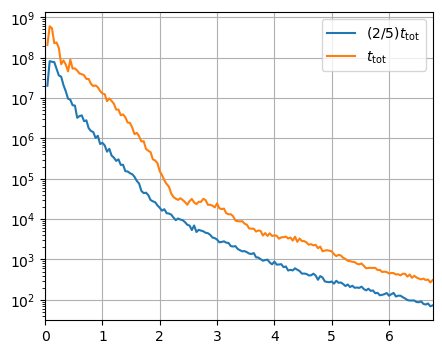

PyObject <matplotlib.legend.Legend object at 0x14922950f100>

In [12]:
fig, ax = plt.subplots(1,1,figsize=(5,4))

plt.semilogy(grid_jl.kr[2:170].*Ld, BTEKE_ot[2,2:170],label=L"(2/5) t_\mathrm{tot}")
plt.semilogy(grid_jl.kr[2:170].*Ld, BTEKE_ot[5,2:170],label=L"t_\mathrm{tot}")

ax.grid()

ax.set_xlim(0,grid_jl.kr[170]*Ld)
ax.legend()

# Cross invariant plot

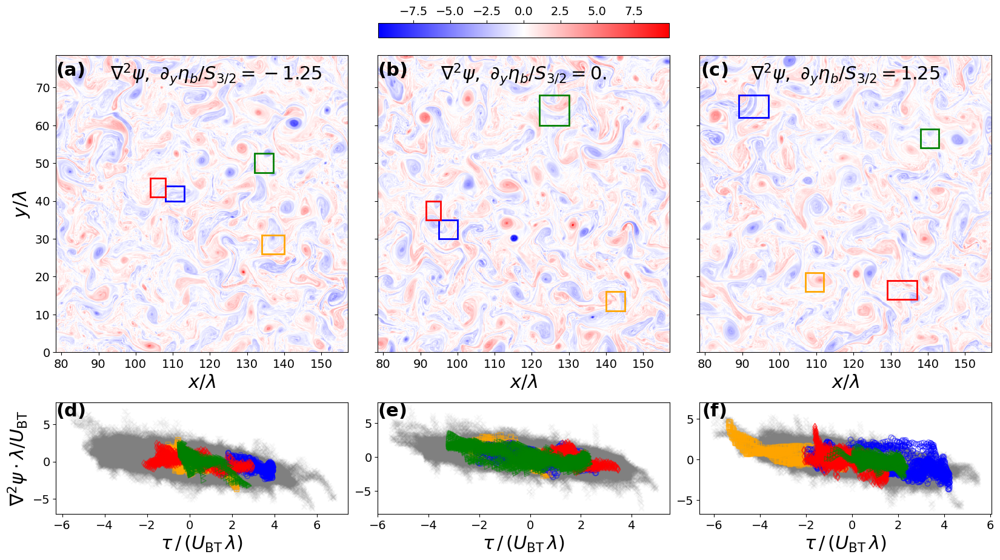

In [7]:
fig, ax = plt.subplots(3,3, figsize=(16,8), height_ratios=[1.0,0.02,0.375])
fig.tight_layout(pad=0.5)
ax1=ax[1]; ax2=ax[3];
ax3=ax[4]; ax4=ax[6];
ax5=ax[7]; ax6=ax[9];


# for a given drag value, calculate the cross invariant as fcn of bottom slope for last snap shot
νstar = 0.
μstar = 4.0   # 1.0 # 
drag_bool = false

L=Lx=25*2*pi*Ld
Nx=1024

fsize=22
lsize=14

############################################################################################
# Negative bottom slope
############################################################################################

h_ind = 2

# box1 = [144,149,20,25];   #blue
# box2 = [139,144,20,25];  # red 
# box3 = [89,97,67.5,72.5];
# box4 = [135,142,61.5,67.5]; 

box1 = [108,113,40,44];   #blue
box2 = [104,108,41,46];  # red 
box3 = [132,137,47.5,52.5];  # green
# box3 = [80,120,40,80];  # green

box4 = [134,140,26,31]; 

# box1 = [0,0,0,0]; 
# box2 = [0,0,0,0]; 
# box3 = [139,150,89,96]; 
# box4 = [136,144,123,133]; 

plot_CI(h_ind,ax1,ax2,box1,box2,box3,box4,lsize)

############################################################################################

############################################################################################
# Negative bottom slope
############################################################################################

h_ind = 7

box1 = [95,100,30,35]; 
box2 = [91.5,95.5,35,40]; 
box3 = [122,130,60,68]; 
# box3 = [78,90,50,70]; 

box4 = [140,145,11,16]; 


plot_CI(h_ind,ax3,ax4,box1,box2,box3,box4,lsize)

############################################################################################

############################################################################################
# Negative bottom slope
############################################################################################

h_ind = 12

box1 = [89,97,62,68];   # blue
box2 = [129,137,14,19]; 
box3 = [138,143,54,59];   # green
box4 = [107,112,16,21]; 


# box1 = [103,108,58,63]; 
# box2 = [108,115,63.5,69]; 
# box3 = [135,142,18,23];   # green
# box4 = [109,114,17.5,22.5]; 

plot_CI(h_ind,ax5,ax6,box1,box2,box3,box4,lsize)

############################################################################################


# ax1.set_title(L"C_\mathrm{D}^* = 0.003, \beta^*_\mathrm{topo} = 0.5, \,  \nabla^2 \psi \cdot L_\mathrm{D} / U_{1}")

ax1.set_ylabel(L"y / \lambda", fontsize=fsize)
ax1.set_xlabel(L"x / \lambda", fontsize=fsize)

# ax3.set_ylabel(L"y / L_\mathrm{D}")
ax3.set_xlabel(L"x / \lambda", fontsize=fsize)
ax3.set_yticklabels([])

# ax5.set_ylabel(L"y / L_\mathrm{D}")
ax5.set_xlabel(L"x / \lambda", fontsize=fsize)
ax5.set_yticklabels([])


ax2.set_ylabel(L" \nabla^2 \psi \cdot \lambda / U_\mathrm{BT}", fontsize=fsize)
ax2.set_xlabel(L"\tau \, / \, (U_\mathrm{BT} \, \lambda)", fontsize=fsize)

ax4.set_xlabel(L"\tau \, / \, (U_\mathrm{BT} \, \lambda)", fontsize=fsize)

ax6.set_xlabel(L"\tau \, / \, (U_\mathrm{BT} \, \lambda)", fontsize=fsize)


ax1.tick_params(labelsize=lsize)
ax2.tick_params(labelsize=lsize)
ax3.tick_params(labelsize=lsize)
ax4.tick_params(labelsize=lsize)
ax5.tick_params(labelsize=lsize)
ax6.tick_params(labelsize=lsize)

ax[2].axis("off"); ax[5].axis("off"); ax[8].axis("off");


ax1.text(0.05, 0.95, L"\mathbf{(a)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax1.transAxes);
ax2.text(0.05, 0.925, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax2.transAxes);
ax3.text(0.05, 0.95, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax3.transAxes);

ax4.text(0.05, 0.925, L"\mathbf{(e)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax4.transAxes);
ax5.text(0.05, 0.95, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax5.transAxes);
ax6.text(0.05, 0.925, L"\mathbf{(f)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax6.transAxes);


ax1.set_title(L"\nabla^2 \psi, \ \partial_y \eta_b / S_{3/2} = -1.25", fontsize=fsize, y=0.9, x=0.55)
ax3.set_title(L"\nabla^2 \psi, \ \partial_y \eta_b / S_{3/2} = 0.", fontsize=fsize, y=0.9)
ax5.set_title(L"\nabla^2 \psi, \ \partial_y \eta_b / S_{3/2} = 1.25", fontsize=fsize, y=0.9)

ax1.set_xlim(25*2*pi/2, 25*2*pi)
ax1.set_ylim(0, 25*2*pi/2)

ax3.set_xlim(25*2*pi/2, 25*2*pi)
ax3.set_ylim(0, 25*2*pi/2)

ax5.set_xlim(25*2*pi/2, 25*2*pi)
ax5.set_ylim(0, 25*2*pi/2)

# savefig("./drag_figs/cross_inv_map.png",bbox_inches="tight")


GC.gc()

In [6]:
function plot_CI(h_ind,ax1,ax2,box1,box2,box3,box4,lsize)
    file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,1)
    files = glob(file1[34:end-5]*"*", data_dir)
    
    if μstar < 1.55
        N_yr = 90 # round(Int, (length(files)-2)/2)
    else
        N_yr = length(files)
    end
    
    a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,N_yr))
        
    s = size(a["jld_data"]["psi_ot"])
    
    if length(s)>3
        psi = a["jld_data"]["psi_ot"][:,:,:,end]
    else
        psi = a["jld_data"]["psi_ot"]
    end   
    
    psiBT = 0.5 * (psi[:,:,1] .+ psi[:,:,2])
    psiBC = 0.5 * (psi[:,:,1] .- psi[:,:,2])
    
    psiBTh = rfft(psiBT)
    psiBCh = rfft(psiBC)
    
    zetaBT = - irfft( grid_jl.Krsq .* psiBTh, grid_jl.ny)    
    zetaBC = - irfft( grid_jl.Krsq .* psiBCh, grid_jl.ny)

    # zetaBT = - irfft( grid_jl.Krsq .* (psiBTh .- psiBCh), grid_jl.ny)  ##actually zeta1
    
    uBT = irfft(- im * grid_jl.l  .* rfft(psiBT), grid_jl.ny)
    vBT = irfft(  im * grid_jl.kr .* rfft(psiBT), grid_jl.ny)
    
    uBT_bar = mean(uBT,dims=1)

    zetaBT_norm = Ld / sqrt(mean((uBT .+ vBT).^2))
    tau_norm = (sqrt(mean((uBT .+ vBT).^2)) * Ld)^-1
    
    ############################################################################################
    x = y = collect(range(0,Lx,Nx)) ./ Ld
    
    lim = maximum(abs.(zetaBT .* zetaBT_norm))
    lim = 9.9
    
    # CI = ((Ld / U[1] * zetaBT) .* (psiBC .* (Ld / (U[1]/2))))
    # lim = maximum(abs.( CI))
    
    norm = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim, vmax=lim)
    
    
    
    # pc1 = ax1.pcolormesh(q[:,:,1,t_ind]',cmap=PyPlot.cm.bwr, norm=norm)
    # pc1 = ax1.pcolormesh(x,y, CI',cmap=PyPlot.cm.bwr, norm=norm)
    pc1 = ax1.pcolormesh(x,y, (zetaBT .* zetaBT_norm)',cmap=PyPlot.cm.bwr, norm=norm)
    
    if h_ind==7    
        cbar_ax = fig.add_axes([0.3565, 0.95, 0.3, 0.1])
        
        # axins = ax1.inset_axes([0.35, 0.95, 0.3, 0.1])
        
        cb = fig.colorbar(pc1, location="top", ax=cbar_ax, shrink=3, fraction =0.3)

        # fig.subplots_adjust(right=0.8)

        
        
        # cm = matplotlib.cm.bwr
        # norm = matplotlib.colors.Normalize(vmin=-lim, vmax=lim)
        
        # cb = matplotlib.colorbar.ColorbarBase(cbar_ax, cmap=cm,
        #                                 norm=norm,
        #                                 orientation="horizontal")
        
        cb.ax.tick_params(labelsize=lsize)
        cb.ax.yaxis.offsetText.set(size=lsize)
        cb.ax.xaxis.offsetText.set(size=lsize)
        cb.ax.yaxis.set_ticks_position("right")

        cbar_ax.axis("off")
    end
    
    if box1[1]!=0
        box1_ind = round.(Int, box1 .* (Nx*Ld/L))  # [x1, x2, y1, y2]
        ax1.add_patch(matplotlib.patches.Rectangle((box1[1], box1[3]), box1[2]-box1[1], box1[4]-box1[3], facecolor="none", ec="blue", lw=2))
    end

    if box2[1]!=0
        box2_ind = round.(Int, box2 .* (Nx*Ld/L))  # [x1, x2, y1, y2]
        ax1.add_patch(matplotlib.patches.Rectangle((box2[1], box2[3]), box2[2]-box2[1], box2[4]-box2[3], facecolor="none", ec="red", lw=2))
    end

    if box3[1]!=0
        box3_ind = round.(Int, box3 .* (Nx*Ld/L))
        ax1.add_patch(matplotlib.patches.Rectangle((box3[1], box3[3]), box3[2]-box3[1], box3[4]-box3[3], facecolor="none", ec="green", lw=2))
    end

    if box4[1]!=0
        box4_ind = round.(Int, box4 .* (Nx*Ld/L))
        ax1.add_patch(matplotlib.patches.Rectangle((box4[1], box4[3]), box4[2]-box4[1], box4[4]-box4[3], facecolor="none", ec="orange", lw=2))
    end
    
    ############################################################################################
    
    x = reshape(psiBC[1:512,512:end] .* tau_norm, length(psiBC[1:512,512:end] ))
    y = reshape(zetaBT[1:512,512:end]  .* zetaBT_norm, length(zetaBT[1:512,512:end] ))

    ax2.scatter(x, y, marker="x", color="gray", alpha=0.05)
    
    if box4[1]!=0
        box4_x = psiBC[box4_ind[1]:box4_ind[2], box4_ind[3]:box4_ind[4]] .* tau_norm
        box4_y = zetaBT[box4_ind[1]:box4_ind[2], box4_ind[3]:box4_ind[4]] .* zetaBT_norm
        ax2.scatter(box4_x,box4_y, marker="s", color="orange", fc="none", alpha=0.5)
    end
    
    if box1[1]!=0
        box1_x = psiBC[box1_ind[1]:box1_ind[2], box1_ind[3]:box1_ind[4]] .* tau_norm
        box1_y = zetaBT[box1_ind[1]:box1_ind[2], box1_ind[3]:box1_ind[4]] .* zetaBT_norm
        ax2.scatter(box1_x,box1_y, marker="o", color="blue", fc="none",  alpha=0.5)
    end

    if box2[1]!=0
        box2_x = psiBC[box2_ind[1]:box2_ind[2], box2_ind[3]:box2_ind[4]] .* tau_norm
        box2_y = zetaBT[box2_ind[1]:box2_ind[2], box2_ind[3]:box2_ind[4]] .* zetaBT_norm
        ax2.scatter(box2_x,box2_y, marker="d", color="red", fc="none", alpha=0.5)
    end
    
    if box3[1]!=0    
        box3_x = psiBC[box3_ind[1]:box3_ind[2], box3_ind[3]:box3_ind[4]] .* tau_norm
        box3_y = zetaBT[box3_ind[1]:box3_ind[2], box3_ind[3]:box3_ind[4]] .* zetaBT_norm
        ax2.scatter(box3_x,box3_y, marker=">", color="green", fc="none", alpha=0.5)
    end


    

end

plot_CI (generic function with 1 method)

# Layer-wise cross-invariant alternate

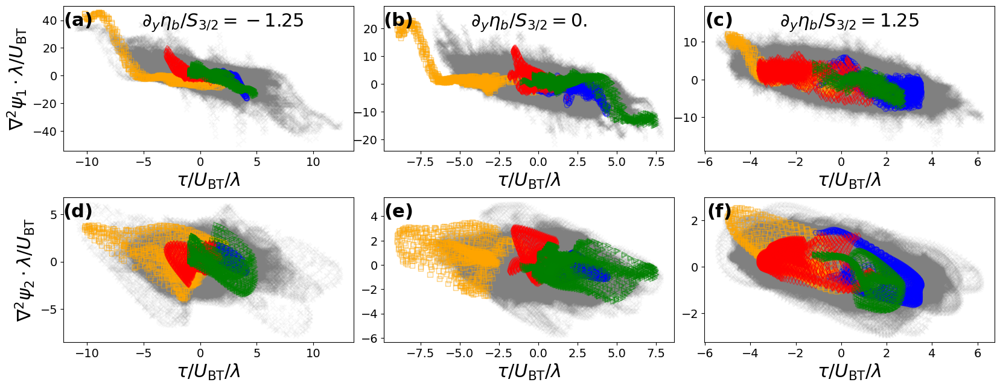

In [5]:
fig, ax = plt.subplots(4,3, figsize=(16,6.), height_ratios=[0.1,1.0,0.02,1.0])
fig.tight_layout(pad=0.5)
ax1=ax[1]; ax2=ax[3];
ax3=ax[4]; ax4=ax[6];
ax5=ax[7]; ax6=ax[9];


# for a given drag value, calculate the cross invariant as fcn of bottom slope for last snap shot
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

L=Lx=25*2*pi*Ld
Nx=1024

fsize=22
lsize=14

############################################################################################
# Negative bottom slope
############################################################################################

h_ind = 2

# box1 = [144,149,20,25];   #blue
# box2 = [139,144,20,25];  # red 
# box3 = [89,97,67.5,72.5];
# box4 = [135,142,61.5,67.5]; 


box1 = [108,113,40,44];   #blue
box2 = [104,108,41,46];  # red 
box3 = [132,137,47.5,52.5];  # green
box4 = [134,140,26,31]; 

plot_alt_CI(h_ind,ax1,box1,box2,box3,box4,lsize,"one")
plot_alt_CI(h_ind,ax2,box1,box2,box3,box4,lsize,"two")

############################################################################################

############################################################################################
# Negative bottom slope
############################################################################################

h_ind = 7

box1 = [95,100,30,35]; 
box2 = [91.5,95.5,35,40]; 
box3 = [122,130,60,68]; 
box4 = [140,145,11,16]; 


plot_alt_CI(h_ind,ax3,box1,box2,box3,box4,lsize,"one")
plot_alt_CI(h_ind,ax4,box1,box2,box3,box4,lsize,"two")
############################################################################################

############################################################################################
# Negative bottom slope
############################################################################################

h_ind = 12

box1 = [89,97,62,68];   # blue
box2 = [129,137,14,19]; 
box3 = [138,143,54,59];   # green
box4 = [107,112,16,21]; 


# box1 = [103,108,58,63]; 
# box2 = [108,115,63.5,69]; 
# box3 = [135,142,18,23];   # green
# box4 = [109,114,17.5,22.5]; 

plot_alt_CI(h_ind,ax5,box1,box2,box3,box4,lsize,"one")
plot_alt_CI(h_ind,ax6,box1,box2,box3,box4,lsize,"two")

############################################################################################


# ax1.set_title(L"C_\mathrm{D}^* = 0.003, \beta^*_\mathrm{topo} = 0.5, \,  \nabla^2 \psi \cdot L_\mathrm{D} / U_{1}")

ax1.set_ylabel(L" \nabla^2 \psi_{1} \cdot \lambda / U_\mathrm{BT}", fontsize=fsize)
ax1.set_xlabel(L"\tau / U_\mathrm{BT} / \lambda", fontsize=fsize)

# ax1.set_ylabel(L"y / L_\mathrm{D}", fontsize=fsize)
ax3.set_xlabel(L"\tau / U_\mathrm{BT} / \lambda", fontsize=fsize)
# ax3.set_yticklabels([])

# ax1.set_ylabel(L"y / L_\mathrm{D}", fontsize=fsize)
ax5.set_xlabel(L"\tau / U_\mathrm{BT} / \lambda", fontsize=fsize)
# ax5.set_yticklabels([])


ax2.set_ylabel(L" \nabla^2 \psi_{2} \cdot \lambda / U_\mathrm{BT}", fontsize=fsize)
ax2.set_xlabel(L"\tau / U_\mathrm{BT} / \lambda", fontsize=fsize)

ax4.set_xlabel(L"\tau / U_\mathrm{BT} / \lambda", fontsize=fsize)

ax6.set_xlabel(L"\tau / U_\mathrm{BT} / \lambda", fontsize=fsize)


ax1.tick_params(labelsize=lsize)
ax2.tick_params(labelsize=lsize)
ax3.tick_params(labelsize=lsize)
ax4.tick_params(labelsize=lsize)
ax5.tick_params(labelsize=lsize)
ax6.tick_params(labelsize=lsize)

ax[2].axis("off"); ax[5].axis("off"); ax[8].axis("off");


ax1.text(0.05, 0.9, L"\mathbf{(a)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax1.transAxes);
ax2.text(0.05, 0.9, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax2.transAxes);
ax3.text(0.05, 0.9, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax3.transAxes);

ax4.text(0.05, 0.9, L"\mathbf{(e)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax4.transAxes);
ax5.text(0.05, 0.9, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax5.transAxes);
ax6.text(0.05, 0.9, L"\mathbf{(f)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax6.transAxes);


ax1.set_title(L"\partial_y \eta_b / S_{3/2} = -1.25", fontsize=fsize, y=0.825, x=0.55)
ax3.set_title(L"\partial_y \eta_b / S_{3/2} = 0.", fontsize=fsize, y=0.825)
ax5.set_title(L"\partial_y \eta_b / S_{3/2} = 1.25", fontsize=fsize, y=0.825)



savefig("./drag_figs/layerwise_CI.png",bbox_inches="tight")



In [4]:
function plot_alt_CI(h_ind,ax2,box1,box2,box3,box4,lsize,layer_no)
    file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,1)
    files = glob(file1[34:end-5]*"*", data_dir)
    
    if μstar < 1.55
        N_yr = 90 # round(Int, (length(files)-2)/2)
    else
        N_yr = length(files)
    end
    
    a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,N_yr))
        
    s = size(a["jld_data"]["psi_ot"])
    
    if length(s)>3
        psi = a["jld_data"]["psi_ot"][:,:,:,end]
    else
        psi = a["jld_data"]["psi_ot"]
    end   
    
    psiBT = 0.5 * (psi[:,:,1] .+ psi[:,:,2])
    psiBC = 0.5 * (psi[:,:,1] .- psi[:,:,2])
    
    psiBTh = rfft(psiBT)
    psiBCh = rfft(psiBC)
    
    # zetaBT = - irfft( grid_jl.Krsq .* psiBTh, grid_jl.ny)    
    zetaBC = - irfft( grid_jl.Krsq .* psiBCh, grid_jl.ny)

    if layer_no=="one"
        zetaBT = - irfft( grid_jl.Krsq .* (psiBTh .+ psiBCh), grid_jl.ny)  ##actually zeta1
    elseif layer_no=="two"
        zetaBT = - irfft( grid_jl.Krsq .* (psiBTh .- psiBCh), grid_jl.ny)  # zeta2
    else
        println("Pass valid layer_no arg, plz.")
    end
    
    uBT = irfft(- im * grid_jl.l  .* rfft(psiBT), grid_jl.ny)
    vBT = irfft(  im * grid_jl.kr .* rfft(psiBT), grid_jl.ny)
    
    uBT_bar = mean(uBT,dims=1)

    zetaBT_norm = Ld / sqrt(mean(uBT.^2))
    tau_norm = (sqrt(mean(uBT.^2)) * Ld)^-1

    if box1[1]!=0
        box1_ind = round.(Int, box1 .* (Nx*Ld/L))  # [x1, x2, y1, y2]
        # ax1.add_patch(matplotlib.patches.Rectangle((box1[1], box1[3]), box1[2]-box1[1], box1[4]-box1[3], facecolor="none", ec="blue", lw=2))
    end

    if box2[1]!=0
        box2_ind = round.(Int, box2 .* (Nx*Ld/L))  # [x1, x2, y1, y2]
        # ax1.add_patch(matplotlib.patches.Rectangle((box2[1], box2[3]), box2[2]-box2[1], box2[4]-box2[3], facecolor="none", ec="red", lw=2))
    end

    if box3[1]!=0
        box3_ind = round.(Int, box3 .* (Nx*Ld/L))
        # ax1.add_patch(matplotlib.patches.Rectangle((box3[1], box3[3]), box3[2]-box3[1], box3[4]-box3[3], facecolor="none", ec="green", lw=2))
    end

    if box4[1]!=0
        box4_ind = round.(Int, box4 .* (Nx*Ld/L))
        # ax1.add_patch(matplotlib.patches.Rectangle((box4[1], box4[3]), box4[2]-box4[1], box4[4]-box4[3], facecolor="none", ec="orange", lw=2))
    end

    
    ############################################################################################
    
    x = reshape(psiBC .* tau_norm, length(psiBC))
    y = reshape(zetaBT .* zetaBT_norm, length(zetaBT))

    ax2.scatter(x, y, marker="x", color="gray", alpha=0.05)
    
    if box4[1]!=0
        box4_x = psiBC[box4_ind[1]:box4_ind[2], box4_ind[3]:box4_ind[4]] .* tau_norm
        box4_y = zetaBT[box4_ind[1]:box4_ind[2], box4_ind[3]:box4_ind[4]] .* zetaBT_norm
        ax2.scatter(box4_x,box4_y, marker="s", color="orange", fc="none", alpha=0.5)
    end
    
    if box1[1]!=0
        box1_x = psiBC[box1_ind[1]:box1_ind[2], box1_ind[3]:box1_ind[4]] .* tau_norm
        box1_y = zetaBT[box1_ind[1]:box1_ind[2], box1_ind[3]:box1_ind[4]] .* zetaBT_norm
        ax2.scatter(box1_x,box1_y, marker="o", color="blue", fc="none",  alpha=0.5)
    end

    if box2[1]!=0
        box2_x = psiBC[box2_ind[1]:box2_ind[2], box2_ind[3]:box2_ind[4]] .* tau_norm
        box2_y = zetaBT[box2_ind[1]:box2_ind[2], box2_ind[3]:box2_ind[4]] .* zetaBT_norm
        ax2.scatter(box2_x,box2_y, marker="d", color="red", fc="none", alpha=0.5)
    end
    
    if box3[1]!=0    
        box3_x = psiBC[box3_ind[1]:box3_ind[2], box3_ind[3]:box3_ind[4]] .* tau_norm
        box3_y = zetaBT[box3_ind[1]:box3_ind[2], box3_ind[3]:box3_ind[4]] .* zetaBT_norm
        ax2.scatter(box3_x,box3_y, marker=">", color="green", fc="none", alpha=0.5)
    end


    

end

plot_alt_CI (generic function with 1 method)

In [5]:

function cross_inv_comp(U,ρ,H,μ,h0s,μstar, νstar, drag_bool, L)

    nlayers=2
    topographic_pv_gradient = (0, (f₀/H[end]) * h0s[1])
        
    prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
    μ, β, dt, stepper, aliased_fraction=1/3);

    sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

    Nh0 = length(h0s)
    
    BCEKE_out = zeros(Nh0,)
    BTEKE_out = zeros(Nh0,)
    CI_out = zeros(Nh0,)
    
    
    for k in range(1,length(h0s))
        # println(k)
            
        # topographic_pv_gradient = (0, (f₀/H[end]) * h0s[k])
            
        # prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
        # μ, β, dt, stepper, aliased_fraction=1/3);

        # sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

        # GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        if μstar<1.55
            N_yr=90
        else
            N_yr = length(files)
        end
            
        ## pre-allocate
        window = Int(round(250 * (Ld / U[1]) / 3600 / 24 / 365.25))   # analyze last 500 eddy-turnover times
        nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output
        
        BCEKE_h0 = zeros(nmax,)
        BTEKE_h0 = zeros(nmax,)
        CI_h0 = zeros(nmax,)

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)

            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
                ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])
            
                ψBCh = rfft(ψBC)
                ψBTh = rfft(ψBT)
            
                ∂xψBC = irfft(im * grid_jl.kr .* ψBCh, grid_jl.ny)
                ∂xψBT = irfft(im * grid_jl.kr .* ψBTh, grid_jl.ny)
            
                ∂yψBC = irfft(im * grid_jl.l .* ψBCh, grid_jl.ny)
                ∂yψBT = irfft(im * grid_jl.l .* ψBTh, grid_jl.ny) 

                ζBT = - irfft( grid_jl.Krsq .* ψBTh, grid_jl.ny)
                
                BCEKE_h0[n] = sum(∂xψBC.^2 .+ ∂yψBC.^2) * grid_jl.dx * grid_jl.dy * grid_jl.Lx^-1 * grid_jl.Ly^-1

                BTEKE_h0[n] = sum(∂xψBT.^2 .+ ∂yψBT.^2) * grid_jl.dx * grid_jl.dy * grid_jl.Lx^-1 * grid_jl.Ly^-1
                
                CI_h0[n] = - sum(ψBC .* ζBT) * grid_jl.dx * grid_jl.dy * grid_jl.Lx^-1 * grid_jl.Ly^-1
                # CI_h0[n] = sum(∂xψBC .* ∂xψBT .+ ∂yψBC .* ∂yψBT) * grid_jl.dx * grid_jl.dy * grid_jl.Lx^-1 * grid_jl.Ly^-1
                
                n+=1
            end
            GC.gc()
        end

        BCEKE_out[k] = mean(BCEKE_h0[1:n-1])
        BTEKE_out[k] = mean(BTEKE_h0[1:n-1])
        CI_out[k] = mean(CI_h0[1:n-1])

    end
    
    return  CI_out, BCEKE_out, BTEKE_out
end


cross_inv_comp (generic function with 1 method)

In [8]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

CI_kap1, BCEKE_4CI_kap1, BTEKE_4CI_kap1 = cross_inv_comp(U, ρ, H, μ, h0s, μstar, νstar, drag_bool, L);



In [9]:
μstar = 0.5   # 1.0 # 

CI_kap0p5, BCEKE_4CI_kap0p5, BTEKE_4CI_kap0p5 = cross_inv_comp(U, ρ, H, μ, h0s, μstar, νstar, drag_bool, L);


In [10]:
μstar = 0.125   # 1.0 # 

CI_kap0p125, BCEKE_4CI_kap0p125, BTEKE_4CI_kap0p125 = cross_inv_comp(U, ρ, H, μ, h0s[7:end], μstar, νstar, drag_bool, L);


In [11]:
μstar = 2.0   # 1.0 # 

CI_kap2, BCEKE_4CI_kap2, BTEKE_4CI_kap2 = cross_inv_comp(U, ρ, H, μ, h0s, μstar, νstar, drag_bool, L);


In [12]:
μstar = 4.0   # 1.0 # 

CI_kap4, BCEKE_4CI_kap4, BTEKE_4CI_kap4 = cross_inv_comp(U, ρ, H, μ, h0s, μstar, νstar, drag_bool, L);


In [6]:
νstar = 0.
μstar = 0.25   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

CI_kap0p25, BCEKE_4CI_kap0p25, BTEKE_4CI_kap0p25 = cross_inv_comp(U, ρ, H, μ, h0s, μstar, νstar, drag_bool, L);



In [13]:
using FileIO, JLD2

fn = data_dir*"CI_and_BCEKE_kappas.jld"

jld_data = Dict("CI_kap0p125" => CI_kap0p125,
    "BCEKE_4CI_kap0p125" => BCEKE_4CI_kap0p125,
    "BTEKE_4CI_kap0p125" => BTEKE_4CI_kap0p125,
    "CI_kap0p5" => CI_kap0p5,
    "BCEKE_4CI_kap0p5" => BCEKE_4CI_kap0p5,
    "BTEKE_4CI_kap0p5" => BTEKE_4CI_kap0p5,
    "CI_kap1" => CI_kap1,
    "BCEKE_4CI_kap1" => BCEKE_4CI_kap1,
    "BTEKE_4CI_kap1" => BTEKE_4CI_kap1,
    "CI_kap2" => CI_kap2,
    "BCEKE_4CI_kap2" => BCEKE_4CI_kap2,
    "BTEKE_4CI_kap2" => BTEKE_4CI_kap2,
    "CI_kap4" => CI_kap4,
    "BCEKE_4CI_kap4" => BCEKE_4CI_kap4,
    "BTEKE_4CI_kap4" => BTEKE_4CI_kap4)


jldsave(fn; jld_data)


In [9]:
using FileIO, JLD2

fn = data_dir*"CI_and_BCEKE_kap0p25.jld"

jld_data = Dict("CI_kap0p25" => CI_kap0p25,
    "BCEKE_4CI_kap0p25" => BCEKE_4CI_kap0p25,
    "BTEKE_4CI_kap0p25" => BTEKE_4CI_kap0p25)


jldsave(fn; jld_data)


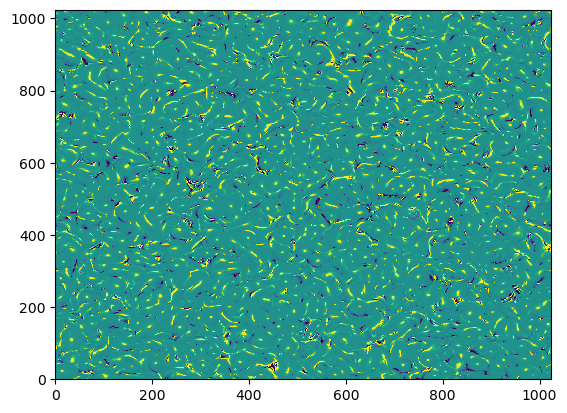

PyObject <matplotlib.collections.QuadMesh object at 0x1474cd5be950>

In [11]:
# fig, ax1 = plt.subplots(1,1,figsize=(6,4))
# fig.tight_layout(pad=0.5)

# lsize = 24
# tsize = 14

# x = h0s ./ S32

# #######################################################################################################
# ax1.plot(x, CI_over_BCEKE_kap0p5, color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")
# ax1.plot(x, CI_over_BCEKE_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")

# ax1.set_ylabel(L"\langle \nabla \tau \cdot \nabla \psi \rangle / \sqrt{2} \langle | \nabla \tau | ^2 \rangle", fontsize=lsize)

# ax1.set_xlim(x[1], x[end])

# # ax1.set_xticklabels([])
# ax1.tick_params(labelsize=tsize)

# ax1.legend(fontsize=tsize)

# ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)



# #######################################################################################################

# # savefig("./drag_figs/cross_inv_BC_EKE.png",bbox_inches="tight")


plt.pcolormesh(aa,vmin=-20,vmax=20)

In [ ]:
# saving everything needed for this plot, i.e., scaled zeta BT field, scaled psiBC field
# x,y for pcolormesh, box indices for 

In [ ]:
νstar = 0.
# μstar = 1.0  # 1.0 # 
drag_bool = false

L=Lx=25*2*pi*Ld
Nx=1024

#############################################################################################

fig, ax = plt.subplots(3,2, figsize=(12,10.5), width_ratios=[1.,1.1], height_ratios=[1.,0.025,1.])
fig.tight_layout(pad=0.05)

ax[2].axis("off")
ax[5].axis("off")


# for a given drag value, calculate the cross invariant as fcn of bottom slope for last snap shot

fsize=22
lsize=14

function plot_panels!(ax1,ax2,h_ind,cbar_bool)
    N_yr = 90
    
    a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,N_yr))
        
    s = size(a["jld_data"]["psi_ot"])
    
    if length(s)>3
        ψ = a["jld_data"]["psi_ot"][:,:,:,end]
    else
        ψ = a["jld_data"]["psi_ot"]
    end   
    
    # psiBT = 0.5 * (psi[:,:,1] .+ psi[:,:,2])
    # psiBC = 0.5 * (psi[:,:,1] .- psi[:,:,2])
    
    # psiBTh = rfft(psiBT)
    # psiBCh = rfft(psiBC)
    
    # zetaBT = - irfft( grid_jl.Krsq .* psiBTh, grid_jl.ny)
    # zetaBC = - irfft( grid_jl.Krsq .* psiBCh, grid_jl.ny)
    
    
    # uBT = irfft(- im * grid_jl.l  .* rfft(psiBT), grid_jl.ny)
    # vBT = irfft(  im * grid_jl.kr .* rfft(psiBT), grid_jl.ny)
    
    # uBT_bar = mean(uBT,dims=1)
    
    # vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    # vars.ψh[:,:,2] = rfft(ψ[:,:,2])
    
    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])
    
    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)
    
    ∂xψBC = irfft(im * grid_jl.kr .* ψBCh, grid_jl.ny)
    ∂xψBT = irfft(im * grid_jl.kr .* ψBTh, grid_jl.ny)
    
    ∂yψBC = irfft(im * grid_jl.l .* ψBCh, grid_jl.ny)
    ∂yψBT = irfft(im * grid_jl.l .* ψBTh, grid_jl.ny)
    
    uBT = irfft(- im * grid_jl.l  .* rfft(ψBT), grid_jl.ny)
    
    ζ = zeros(grid_jl.nx, grid_jl.ny, 2)   # irfft(- grid.Krsq .* ψh, grid.nx)
    ζ[:,:,1] = irfft(- grid_jl.Krsq .* (ψBTh .+ ψBCh), grid_jl.nx)
    ζ[:,:,2] = irfft(- grid_jl.Krsq .* (ψBTh .- ψBCh), grid_jl.nx)
    
    ∂xζ1 = irfft(im * grid_jl.kr .* rfft(ζ[:,:,1]), grid_jl.ny)
    
    ∇2ψ2 = irfft(- grid_jl.Krsq .* (ψBTh .- ψBCh), grid_jl.ny)
    ∂xψ2 = irfft(im * grid_jl.kr .* (ψBTh .- ψBCh), grid_jl.ny)
    
    zetaBT = - irfft( grid_jl.Krsq .* ψBTh, grid_jl.ny)
    
    
    norm = (sqrt(mean(uBT.^2))^3 / Ld)^-1
    
    norm_zeta = (sqrt(mean(uBT.^2))^1 / Ld)^-1

    norm_tau = (sqrt(mean(uBT.^2))^1 * Ld)^-1
    
    U₁, U₂ = view(params.U, :, :, 1), view(params.U, :, :, 2)
    
    # S32 = params.f₀ * U₁[1,1] ./ g′
    
    # Topo transfer term
    ∂yηb = h0s[h_ind]
    μ = μstar * (U[1]/2) / Ld
    
    TT = - 0.5 * ∂yηb * (params.f₀ / params.H[2]) .* ψBT .* (∂xψBT .- ∂xψBC)
    
    BC = (params.f₀ / params.H[1]) * S32 .* ψBC .* ∂xψBT
    
    LT =  @. -0.5 * ψBC * U₁ * ∂xζ1
    
    local_conversion = 2*S32*(f0/sum(H)) .* ψBC .*  ∂xψBT   # .- ∂yηb * (f0/sum(H)) .* ψBC .* ∂xψ2
    local_conversion = 0.5 *  (U[1] * Ld^-2) .* ψBC .* ∂xψBT
    # local_conversion = 2*S32*(f0/sum(H))  .* ψBC .* ∂xψ2
    
    # DBCEAPE = - (μ/2) * (∂xψBC.^2 .+ ∂yψBC.^2 .- ∂xψBT .* ∂xψBC .- ∂yψBT .* ∂yψBC)
    DBCEAPE_loc = -(μ/2) * ψBC .* ∇2ψ2

    DBT = -(μ/2) * (∂xψBT.^2 .+ ∂yψBT.^2)
    
    ζτ = (μ/2) * ψBC .* zetaBT
    
    ############################################################################################
    ############################################################################################
    
    # plot_var = ζτ .* norm
    
    # plot_var2 = DBCEAPE_loc .* norm

    
    plot_var = zetaBT .* norm_zeta
    panel2_plot_var = ζτ ./ DBT #  ψBC .* norm_tau
    
    lim = 5. # maximum(abs.(plot_var))  # 10.0 # 
    
    ############################################################################################
    ############################################################################################
    x = y = collect(range(0,Lx,Nx)) ./ Ld
    
    
    # norm = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim, vmax=lim)
    
    pc1 = ax1.pcolormesh(x,y, plot_var',cmap=PyPlot.cm.bwr, vmin=-5.0, vmax=5.0)
    
    c1 = ax1.contour(x,y, panel2_plot_var', levels=[-0.5,0.5], colors="black")

    if cbar_bool==true
        cb = plt.colorbar(pc1)

        cb.ax.tick_params(labelsize=lsize)
        cb.ax.yaxis.offsetText.set(size=lsize)
    end
    ############################################################################################
    ############################################################################################
    lim = 20 #  maximum(abs.(panel2_plot_var))
    
    norm_cb = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim, vmax=lim)
    
    # pc2 = ax2.pcolormesh(x,y, (zetaBT .* norm_zeta)',cmap=PyPlot.cm.bwr, norm=norm_cb)
    pc2 = ax2.pcolormesh(x,y, (panel2_plot_var)',cmap=PyPlot.cm.bwr, norm=norm_cb)

    # c2 = ax2.contour(x,y, plot_var2', levels=[0.2, 1.1, 2.1, 3.1], colors="black")

    if cbar_bool==true
        cb = plt.colorbar(pc2)

        cb.ax.tick_params(labelsize=lsize)
        cb.ax.yaxis.offsetText.set(size=lsize)
        # cb.ax.xaxis.offsetText.set(size=lsize)
        # cb.ax.yaxis.set_ticks_position("right")
    end
    ############################################################################################
    ############################################################################################
    ax1.set_xlim(25*2*pi/2, 25*2*pi)
    ax1.set_ylim(0, 25*2*pi/2)
    
    
    ax2.set_xlim(25*2*pi/2, 25*2*pi)
    ax2.set_ylim(0, 25*2*pi/2)

    return panel2_plot_var
end

###################################################################################
μstar = 1.0  # 1.0 # 

h_ind=2
aa = plot_panels!(ax[1],ax[3],h_ind,false)

###########################################
μstar = 1.0  # 1.0 # 

h_ind=12
plot_panels!(ax[4],ax[6],h_ind,true)


###########################################
ax[1].set_xticklabels([])
ax[4].set_xticklabels([])

ax[4].set_yticklabels([])
ax[6].set_yticklabels([])

###########################################

ax[1].tick_params(labelsize=lsize)
ax[3].tick_params(labelsize=lsize)
ax[4].tick_params(labelsize=lsize)
ax[6].tick_params(labelsize=lsize)


###########################################



# ax[1].text(0.15, 0.85, L"$\mathrm{(a)} \ \mathrm{contours:} \ D_\mathrm{BC}^\mathrm{loc} \mathrm{;} \ \mathrm{colors:} \ \tau \nabla^2 \psi$", bbox=Dict("facecolor"=>"white", "alpha"=>0.5), fontsize=24, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);


# ax[1].set_title( L"$\mathrm{contours:} \ D_\mathrm{BC}^\mathrm{loc} \mathrm{;} \ \mathrm{colors:} \ \tau \nabla^2 \psi$", fontsize=fsize)

ax[1].text(1., 1.05, L"$\mathrm{contours:} \ D_\mathrm{BC}^\mathrm{loc} \mathrm{;} \ \mathrm{colors:} \ \tau \nabla^2 \psi$",fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[1].text(0.35, 0.925, L"$\mathrm{(a): \ } \partial_y \eta_b / S_{3/2} = -1.25$", bbox=Dict("facecolor"=>"white", "alpha"=>0.9), fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[4].text(0.35, 0.925, L"$\mathrm{(b): \ } \partial_y \eta_b / S_{3/2} = 1.25$", bbox=Dict("facecolor"=>"white", "alpha"=>0.9), fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[4].transAxes);


ax[3].text(1., 1.05, L"$\mathrm{contours:} \ D_\mathrm{BC}^\mathrm{loc} \mathrm{;} \ \mathrm{colors:} \ \nabla^2 \psi$",fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[3].transAxes);
ax[3].text(0.35, 0.925, L"$\mathrm{(c): \ } \partial_y \eta_b / S_{3/2} = -1.25$", bbox=Dict("facecolor"=>"white", "alpha"=>0.9), fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[3].transAxes);
ax[6].text(0.35, 0.925, L"$\mathrm{(d): \ } \partial_y \eta_b / S_{3/2} = 1.25$", bbox=Dict("facecolor"=>"white", "alpha"=>0.9), fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[6].transAxes);


ax[1].set_ylabel(L"y / \lambda", fontsize=fsize)

ax[3].set_ylabel(L"y / \lambda", fontsize=fsize)
ax[3].set_xlabel(L"x / \lambda", fontsize=fsize)

ax[6].set_xlabel(L"x / \lambda", fontsize=fsize)


# savefig("./drag_figs/DBC_loc.pdf",bbox_inches="tight")


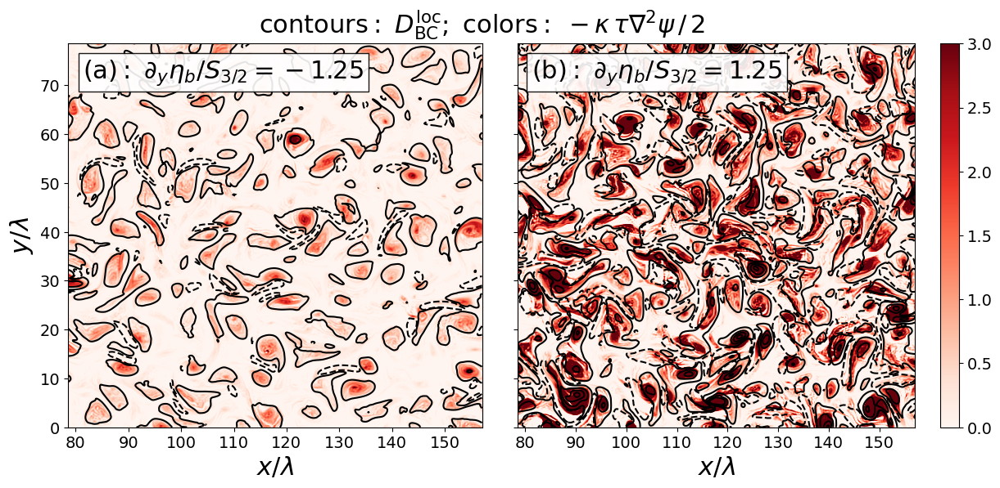

PyObject Text(0.5, 39.999999999999986, '$x / \\lambda$')

In [86]:
νstar = 0.
# μstar = 1.0  # 1.0 # 
drag_bool = false

L=Lx=25*2*pi*Ld
Nx=1024

#############################################################################################

fig, ax = plt.subplots(1,2, figsize=(12,5.), width_ratios=[1.,1.2])
fig.tight_layout(pad=0.05)


# for a given drag value, calculate the cross invariant as fcn of bottom slope for last snap shot

fsize=22
lsize=14

function plot_panels!(ax1,h_ind,cbar_bool)
    N_yr = 90
    
    a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,N_yr))
        
    s = size(a["jld_data"]["psi_ot"])
    
    if length(s)>3
        ψ = a["jld_data"]["psi_ot"][:,:,:,end]
    else
        ψ = a["jld_data"]["psi_ot"]
    end   
    
    # psiBT = 0.5 * (psi[:,:,1] .+ psi[:,:,2])
    # psiBC = 0.5 * (psi[:,:,1] .- psi[:,:,2])
    
    # psiBTh = rfft(psiBT)
    # psiBCh = rfft(psiBC)
    
    # zetaBT = - irfft( grid_jl.Krsq .* psiBTh, grid_jl.ny)
    # zetaBC = - irfft( grid_jl.Krsq .* psiBCh, grid_jl.ny)
    
    
    # uBT = irfft(- im * grid_jl.l  .* rfft(psiBT), grid_jl.ny)
    # vBT = irfft(  im * grid_jl.kr .* rfft(psiBT), grid_jl.ny)
    
    # uBT_bar = mean(uBT,dims=1)
    
    # vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    # vars.ψh[:,:,2] = rfft(ψ[:,:,2])
    
    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])
    
    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)
    
    ∂xψBC = irfft(im * grid_jl.kr .* ψBCh, grid_jl.ny)
    ∂xψBT = irfft(im * grid_jl.kr .* ψBTh, grid_jl.ny)
    
    ∂yψBC = irfft(im * grid_jl.l .* ψBCh, grid_jl.ny)
    ∂yψBT = irfft(im * grid_jl.l .* ψBTh, grid_jl.ny)
    
    uBT = irfft(- im * grid_jl.l  .* rfft(ψBT), grid_jl.ny)
    
    ζ = zeros(grid_jl.nx, grid_jl.ny, 2)   # irfft(- grid.Krsq .* ψh, grid.nx)
    ζ[:,:,1] = irfft(- grid_jl.Krsq .* (ψBTh .+ ψBCh), grid_jl.nx)
    ζ[:,:,2] = irfft(- grid_jl.Krsq .* (ψBTh .- ψBCh), grid_jl.nx)
    
    ∂xζ1 = irfft(im * grid_jl.kr .* rfft(ζ[:,:,1]), grid_jl.ny)
    
    ∇2ψ2 = irfft(- grid_jl.Krsq .* (ψBTh .- ψBCh), grid_jl.ny)
    ∂xψ2 = irfft(im * grid_jl.kr .* (ψBTh .- ψBCh), grid_jl.ny)
    
    zetaBT = - irfft( grid_jl.Krsq .* ψBTh, grid_jl.ny)
    
    
    norm = (sqrt(mean(uBT.^2))^3 / Ld)^-1
    
    norm_zeta = (sqrt(mean(uBT.^2))^1 / Ld)^-1
    
    U₁, U₂ = view(params.U, :, :, 1), view(params.U, :, :, 2)
    
    # S32 = params.f₀ * U₁[1,1] ./ g′
    
    # Topo transfer term
    ∂yηb = h0s[h_ind]
    μ = μstar * (U[1]/2) / Ld
    
    TT = - 0.5 * ∂yηb * (params.f₀ / params.H[2]) .* ψBT .* (∂xψBT .- ∂xψBC)
    
    BC = (params.f₀ / params.H[1]) * S32 .* ψBC .* ∂xψBT
    
    LT =  @. -0.5 * ψBC * U₁ * ∂xζ1
    
    local_conversion = 2*S32*(f0/sum(H)) .* ψBC .*  ∂xψBT   # .- ∂yηb * (f0/sum(H)) .* ψBC .* ∂xψ2
    local_conversion = 0.5 *  (U[1] * Ld^-2) .* ψBC .* ∂xψBT
    # local_conversion = 2*S32*(f0/sum(H))  .* ψBC .* ∂xψ2
    
    # DBCEAPE = - (μ/2) * (∂xψBC.^2 .+ ∂yψBC.^2 .- ∂xψBT .* ∂xψBC .- ∂yψBT .* ∂yψBC)
    DBCEAPE_loc = -(μ/2) * ψBC .* ∇2ψ2
    
    ζτ = (μ/2) * ψBC .* zetaBT
    
    ############################################################################################
    ############################################################################################
    
    plot_var = ζτ .* norm
    
    plot_var2 = DBCEAPE_loc .* norm
    
    lim = 5. # maximum(abs.(plot_var))  # 10.0 # 
    
    ############################################################################################
    ############################################################################################
    x = y = collect(range(0,Lx,Nx)) ./ Ld
    
    
    # norm = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim, vmax=lim)
    
    pc1 = ax1.pcolormesh(x,y, -plot_var',cmap=PyPlot.cm.Reds, vmin=0., vmax=3.0, rasterized=true)
    
    c1 = ax1.contour(x,y, plot_var2', levels=[-0.1,0.1, 1.1, 2.1, 3.1], colors="black")

    if cbar_bool==true
        cb = plt.colorbar(pc1)

        cb.ax.tick_params(labelsize=lsize)
        cb.ax.yaxis.offsetText.set(size=lsize)
    end
    ############################################################################################
    ############################################################################################

    ############################################################################################
    ############################################################################################
    ax1.set_xlim(25*2*pi/2, 25*2*pi)
    ax1.set_ylim(0, 25*2*pi/2)
end

###################################################################################
μstar = 0.5  # 1.0 # 


h_ind=12
plot_panels!(ax[1],h_ind,false)

###########################################

μstar = 2.0  # 1.0 # 


h_ind=12
plot_panels!(ax[2],h_ind,true)


###########################################
ax[2].set_yticklabels([])

###########################################

ax[1].tick_params(labelsize=lsize)
ax[2].tick_params(labelsize=lsize)
###########################################



# ax[1].text(0.15, 0.85, L"$\mathrm{(a)} \ \mathrm{contours:} \ D_\mathrm{BC}^\mathrm{loc} \mathrm{;} \ \mathrm{colors:} \ \tau \nabla^2 \psi$", bbox=Dict("facecolor"=>"white", "alpha"=>0.5), fontsize=24, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);


# ax[1].set_title( L"$\mathrm{contours:} \ D_\mathrm{BC}^\mathrm{loc} \mathrm{;} \ \mathrm{colors:} \ \tau \nabla^2 \psi$", fontsize=fsize)

ax[1].text(1., 1.05, L"$\mathrm{contours:} \ D_\mathrm{BC}^\mathrm{loc} \mathrm{;} \ \mathrm{colors:} \ -\kappa \, \tau \nabla^2 \psi \, / \, 2$",fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[1].text(0.375, 0.925, L"$\mathrm{(a): \ } \partial_y \eta_b / S_{3/2} = -1.25$", bbox=Dict("facecolor"=>"white", "alpha"=>0.9), fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[1].transAxes);
ax[2].text(0.35, 0.925, L"$\mathrm{(b): \ } \partial_y \eta_b / S_{3/2} = 1.25$", bbox=Dict("facecolor"=>"white", "alpha"=>0.9), fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax[2].transAxes);



ax[1].set_ylabel(L"y / \lambda", fontsize=fsize)
ax[1].set_xlabel(L"x / \lambda", fontsize=fsize)

ax[2].set_xlabel(L"x / \lambda", fontsize=fsize)


# savefig("./drag_figs/DBC_loc.pdf",bbox_inches="tight")

# savefig("./drag_figs/DBC_loc.png", dpi=400, bbox_inches="tight")



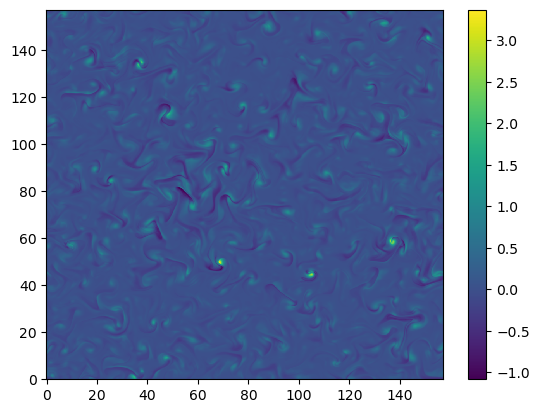

PyObject <matplotlib.colorbar.Colorbar object at 0x14f422c50460>

In [15]:
pc1 = plt.pcolormesh(x,y, plot_var2')
plt.colorbar(pc1)

7

# Diagnostic plot to show different spatial patterns of energy conversion over strong slopes of either sign...Ttopo?

In [9]:
function plot_Ttopo_snap(norm,h_ind,ax1,lsize,str_var)
    file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,1)
    files = glob(file1[34:end-5]*"*", data_dir)
    
    N_yr = 90
    
    a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,N_yr))
        
    s = size(a["jld_data"]["psi_ot"])
    
    if length(s)>3
        ψ = a["jld_data"]["psi_ot"][:,:,:,end]
    else
        ψ = a["jld_data"]["psi_ot"]
    end   
    
    # psiBT = 0.5 * (psi[:,:,1] .+ psi[:,:,2])
    # psiBC = 0.5 * (psi[:,:,1] .- psi[:,:,2])
    
    # psiBTh = rfft(psiBT)
    # psiBCh = rfft(psiBC)
    
    # zetaBT = - irfft( grid_jl.Krsq .* psiBTh, grid_jl.ny)
    # zetaBC = - irfft( grid_jl.Krsq .* psiBCh, grid_jl.ny)
    
    
    # uBT = irfft(- im * grid_jl.l  .* rfft(psiBT), grid_jl.ny)
    # vBT = irfft(  im * grid_jl.kr .* rfft(psiBT), grid_jl.ny)
    
    # uBT_bar = mean(uBT,dims=1)

    # vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    # vars.ψh[:,:,2] = rfft(ψ[:,:,2])

    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])

    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)

    ∂xψBC = irfft(im * grid_jl.kr .* ψBCh, grid_jl.ny)
    ∂xψBT = irfft(im * grid_jl.kr .* ψBTh, grid_jl.ny)

    ∂yψBC = irfft(im * grid_jl.l .* ψBCh, grid_jl.ny)
    ∂yψBT = irfft(im * grid_jl.l .* ψBTh, grid_jl.ny)

    uBT = irfft(- im * grid_jl.l  .* rfft(ψBT), grid_jl.ny)

    ζ = zeros(grid_jl.nx, grid_jl.ny, 2)   # irfft(- grid.Krsq .* ψh, grid.nx)
    ζ[:,:,1] = irfft(- grid_jl.Krsq .* (ψBTh .+ ψBCh), grid_jl.nx)
    ζ[:,:,2] = irfft(- grid_jl.Krsq .* (ψBTh .- ψBCh), grid_jl.nx)

    ∂xζ1 = irfft(im * grid_jl.kr .* rfft(ζ[:,:,1]), grid_jl.ny)

    ∇2ψ2 = irfft(- grid_jl.Krsq .* (ψBTh .- ψBCh), grid_jl.ny)
    ∂xψ2 = irfft(im * grid_jl.kr .* (ψBTh .- ψBCh), grid_jl.ny)

    zetaBT = - irfft( grid_jl.Krsq .* ψBTh, grid_jl.ny)


    norm = (sqrt(mean(uBT.^2))^3 / Ld)^-1
    
    U₁, U₂ = view(params.U, :, :, 1), view(params.U, :, :, 2)
    
    # S32 = params.f₀ * U₁[1,1] ./ g′

    # Topo transfer term
    ∂yηb = h0s[h_ind]
    μ = μstar * (U[1]/2) / Ld
    
    TT = - 0.5 * ∂yηb * (params.f₀ / params.H[2]) .* ψBT .* (∂xψBT .- ∂xψBC)

    BC = (params.f₀ / params.H[1]) * S32 .* ψBC .* ∂xψBT

    LT =  @. -0.5 * ψBC * U₁ * ∂xζ1

    local_conversion = 2*S32*(f0/sum(H)) .* ψBC .*  ∂xψBT   # .- ∂yηb * (f0/sum(H)) .* ψBC .* ∂xψ2
    local_conversion = 0.5 *  (U[1] * Ld^-2) .* ψBC .* ∂xψBT
    # local_conversion = 2*S32*(f0/sum(H))  .* ψBC .* ∂xψ2

    # DBCEAPE = - (μ/2) * (∂xψBC.^2 .+ ∂yψBC.^2 .- ∂xψBT .* ∂xψBC .- ∂yψBT .* ∂yψBC)
    DBCEAPE_loc = -(μ/2) * ψBC .* ∇2ψ2

    ζτ = (μ/2) * ψBC .* zetaBT
    
    ############################################################################################
    x = y = collect(range(0,Lx,Nx)) ./ Ld

    p2_bool = 0
    
    if str_var=="top"
        # plot_var = (BC .- TT .+ LT) .* norm
        # plot_var = local_conversion .* norm
        
        plot_var = ζτ .* norm

        p2_bool = 1
        plot_var2 = DBCEAPE_loc .* norm

        lim = 10. # maximum(abs.(plot_var))  # 10.0 # 
    else
        plot_var = DBCEAPE_loc .* norm

        lim=5
    end

    println(string(h_ind)*": "*string(sum(plot_var)))
    # plot_var = (BC) .* norm  # ./ (2*S32 - ∂yηb)

    # lim = maximum(abs.(plot_var))
    # lim=3e-10
    
    # CI = ((Ld / U[1] * zetaBT) .* (psiBC .* (Ld / (U[1]/2))))
    # lim = maximum(abs.( CI))
    
    norm = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim, vmax=lim)
    
    pc1 = ax1.pcolormesh(x,y, plot_var',cmap=PyPlot.cm.bwr, norm=norm)

    if p2_bool==1
        c1 = ax1.contour(x,y, plot_var2',norm=norm)
    end

    if h_ind==12
        # if str_var=="top"
        #     cb = fig.colorbar(pc1, location=str_var) # , pad=0.1)
        # else
        #     cb = fig.colorbar(pc1, location=str_var, pad=0.1)
        # end
        cb = fig.colorbar(pc1, location="right") # , pad=0.1)
        
        cb.ax.tick_params(labelsize=lsize)
        cb.ax.yaxis.offsetText.set(size=lsize)
        cb.ax.xaxis.offsetText.set(size=lsize)
        
    end
    
    
    
    ########################################################################################### 

end

plot_Ttopo_snap (generic function with 1 method)

2: -329596.3337729286
2: -43739.26290691452
7: -126301.54947093828
7: 17313.605543098325
12: -373711.53195510176
12: 101721.79004448281


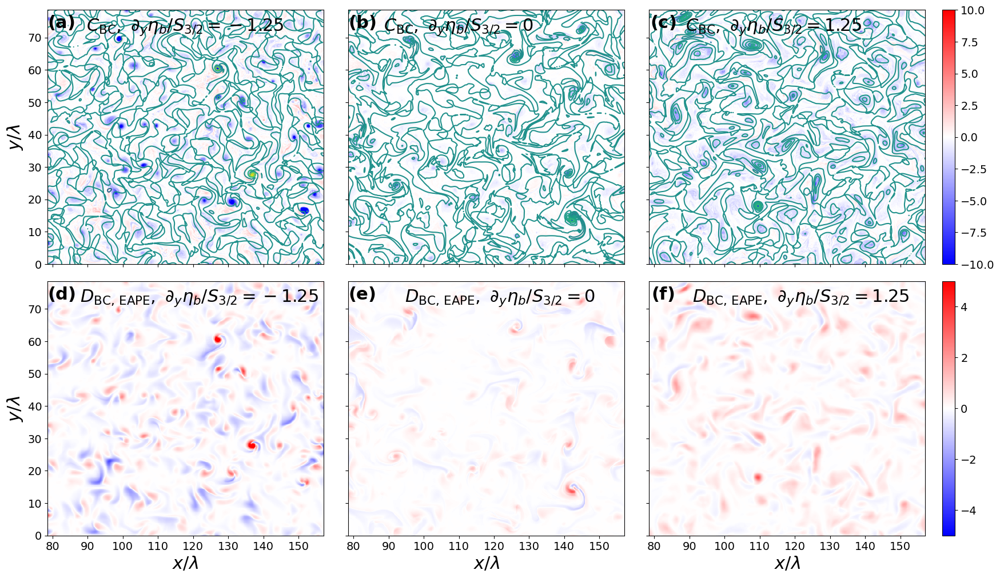

In [10]:
fig, ax = plt.subplots(2,3, figsize=(17,9.5), width_ratios=[1.0,1.0,1.25])
fig.tight_layout(pad=0.05)
ax1=ax[1]; ax2=ax[3]; ax3=ax[5];

ax1b=ax[2]; ax2b=ax[4]; ax3b=ax[6];



# for a given drag value, calculate the cross invariant as fcn of bottom slope for last snap shot
νstar = 0.
μstar = 1.0  # 1.0 # 
drag_bool = false

L=Lx=25*2*pi*Ld
Nx=1024

fsize=22
lsize=14

norm = ((U[1]/2)^3 / Ld)^-1


############################################################################################
# Negative bottom slope
############################################################################################

h_ind = 2

plot_Ttopo_snap(norm,h_ind,ax1,lsize,"top")
plot_Ttopo_snap(norm,h_ind,ax1b,lsize,"bottom")
############################################################################################

############################################################################################
# Flat bottom 
############################################################################################

h_ind = 7

plot_Ttopo_snap(norm,h_ind,ax2,lsize,"top")
plot_Ttopo_snap(norm,h_ind,ax2b,lsize,"bottom")

############################################################################################

############################################################################################
# Positive bottom slope
############################################################################################

h_ind = 12

plot_Ttopo_snap(norm,h_ind,ax3,lsize,"top")
plot_Ttopo_snap(norm,h_ind,ax3b,lsize,"bottom")


############################################################################################

# ax1.set_title(L"C_\mathrm{D}^* = 0.003, \beta^*_\mathrm{topo} = 0.5, \,  \nabla^2 \psi \cdot L_\mathrm{D} / U_{1}")

ax1.set_ylabel(L"y / \lambda", fontsize=fsize)
ax1.set_xticklabels([])

ax1b.set_ylabel(L"y / \lambda", fontsize=fsize)
ax1b.set_xlabel(L"x / \lambda", fontsize=fsize)

ax2.set_xticklabels([])
ax2.set_yticklabels([])

ax2b.set_xlabel(L"x / \lambda", fontsize=fsize)
ax2b.set_yticklabels([])

ax3.set_xticklabels([])
ax3.set_yticklabels([])

ax3b.set_xlabel(L"x / \lambda", fontsize=fsize)
ax3b.set_yticklabels([])


ax1.tick_params(labelsize=lsize)
ax2.tick_params(labelsize=lsize)
ax3.tick_params(labelsize=lsize)

ax1b.tick_params(labelsize=lsize)
ax2b.tick_params(labelsize=lsize)
ax3b.tick_params(labelsize=lsize)

ax1.set_title(L"C_\mathrm{BC}, \ \partial_y \eta_b / S_{3/2} = -1.25", fontsize=fsize, x=0.5, y=0.9)
ax1b.set_title(L"D_\mathrm{BC, \, EAPE}, \ \partial_y \eta_b / S_{3/2} = -1.25", fontsize=fsize, x=0.55, y=0.9)

ax2.set_title(L"C_\mathrm{BC}, \ \partial_y \eta_b / S_{3/2} = 0", fontsize=fsize, x=0.4, y=0.9)
ax2b.set_title(L"D_\mathrm{BC, \, EAPE}, \ \partial_y \eta_b / S_{3/2} = 0", fontsize=fsize, x=0.55, y=0.9)

ax3.set_title(L"C_\mathrm{BC}, \ \partial_y \eta_b / S_{3/2} = 1.25", fontsize=fsize, x=0.45, y=0.9)
ax3b.set_title(L"D_\mathrm{BC, \, EAPE}, \ \partial_y \eta_b / S_{3/2} = 1.25", fontsize=fsize, x=0.55, y=0.9)


ax1.text(0.05, 0.95, L"\mathbf{(a)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax1.transAxes);
ax1b.text(0.05, 0.95, L"\mathbf{(d)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax1b.transAxes);

ax2.text(0.05, 0.95, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax2.transAxes);
ax2b.text(0.05, 0.95, L"\mathbf{(e)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax2b.transAxes);

ax3.text(0.05, 0.95, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax3.transAxes);
ax3b.text(0.05, 0.95, L"\mathbf{(f)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax3b.transAxes);


ax1.set_xlim(25*2*pi/2, 25*2*pi)
ax1.set_ylim(0, 25*2*pi/2)

ax2.set_xlim(25*2*pi/2, 25*2*pi)
ax2.set_ylim(0, 25*2*pi/2)

ax3.set_xlim(25*2*pi/2, 25*2*pi)
ax3.set_ylim(0, 25*2*pi/2)

ax1b.set_xlim(25*2*pi/2, 25*2*pi)
ax1b.set_ylim(0, 25*2*pi/2)

ax2b.set_xlim(25*2*pi/2, 25*2*pi)
ax2b.set_ylim(0, 25*2*pi/2)

ax3b.set_xlim(25*2*pi/2, 25*2*pi)
ax3b.set_ylim(0, 25*2*pi/2)



# savefig("./drag_figs/CBC_and_DEAPE.png",bbox_inches="tight")


GC.gc()

In [17]:
h0s[7]/S32

0.0

# Plot for animations

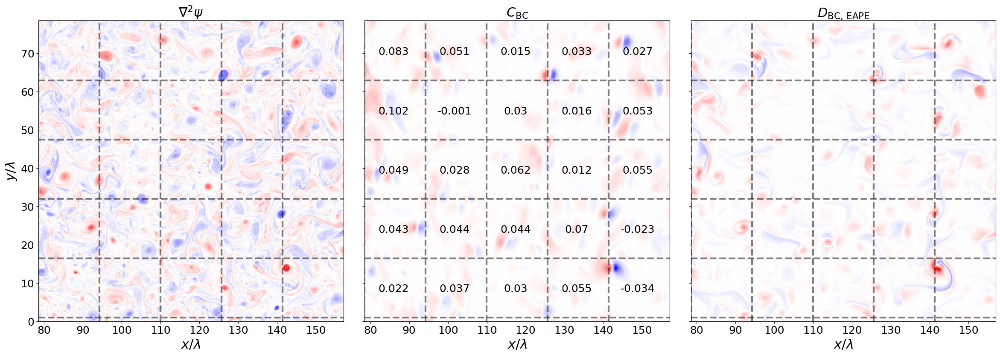

PyObject Text(0.5, 1.0010845646023265, '$D_\\mathrm{BC, \\, EAPE}$')

In [34]:
fig,ax = plt.subplots(1,3,figsize=(23,7.5))
fig.tight_layout(pad=0.5)
ax1=ax[1]; ax2=ax[2]; ax3=ax[3];

fsize= 22
lsize = 18

x = y = collect(range(0,Lx,Nx)) ./ Ld

box = [50*pi/2,50*pi,1,50*pi/2]; 
box_ind = round.(Int, box .* (Nx*Ld/L))

psi1 = psi[:,:,1]
psi2 = psi[:,:,2]

# psi1 = psi[box_ind[1]:box_ind[2],box_ind[3]:box_ind[4],1]
# psi2 = psi[box_ind[1]:box_ind[2],box_ind[3]:box_ind[4],2]

# x = x[box_ind[1]:box_ind[2]]
# y = y[box_ind[3]:box_ind[4]]

############################################################
psiBT = 0.5 * (psi1 .+ psi2)
psiBTh = rfft(psiBT)
zetaBT = - irfft( grid_jl.Krsq .* psiBTh, grid_jl.ny)

lim = maximum(abs.(zetaBT))
norm = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim, vmax=lim)

pc1 = ax1.pcolormesh(x,y, zetaBT',cmap=PyPlot.cm.bwr, norm=norm)


############################################################
psiBC = 0.5 * (psi1 .- psi2)
∂xpsiBT = irfft(im * grid_jl.kr .* psiBTh, grid_jl.ny)
CBC =  2*S32*(f0/sum(H)) .* psiBC .*  ∂xpsiBT  # 0.5 *  (U[1] * Ld^-2) .* psiBC .* ∂xpsiBT #

lim2 = maximum(abs.(CBC))
norm2 = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim2, vmax=lim2)

pc2 = ax2.pcolormesh(x,y, CBC',cmap=PyPlot.cm.bwr, norm=norm2)


############################################################
psiBCh = rfft(psiBC)
∇2ψ2 = irfft(- grid_jl.Krsq .* (psiBTh .- psiBCh), grid_jl.ny)
BCEAPE = -(μ/2) * psiBC .* ∇2ψ2

lim3 = maximum(abs.(BCEAPE))
norm3 = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim3, vmax=lim3)

pc3 = ax3.pcolormesh(x,y, BCEAPE',cmap=PyPlot.cm.bwr, norm=norm3)

############################################################

CBC_l = CBC[box_ind[1]:box_ind[2],box_ind[3]:box_ind[4]]
dx = dy = floor(50*pi/2/5)

ar=0

for xi in range(50*pi/2,50*pi-50*pi/2/5,5)
    ax1.axvline(xi,color="black", linestyle="dashed",alpha=0.5,linewidth=3)
    ax2.axvline(xi,color="black", linestyle="dashed",alpha=0.5,linewidth=3)
    ax3.axvline(xi,color="black", linestyle="dashed",alpha=0.5,linewidth=3)
    for yi in range(1,50*pi/2-50*pi/2/5,5)
        boxl = [xi,xi+dx,yi,yi+dx]
        boxl_ind = round.(Int, boxl .* (Nx*Ld/L))

        r = round(sum(CBC[boxl_ind[1]:boxl_ind[2],boxl_ind[3]:boxl_ind[4]])/sum(CBC_l), digits=3)
        ax2.text(xi+dx/2,yi+dx/2, string(r), fontsize=lsize, ha="center",va="center")

        if ar==0
            ax1.axhline(yi,color="black", linestyle="dashed",alpha=0.5,linewidth=3)
            ax2.axhline(yi,color="black", linestyle="dashed",alpha=0.5,linewidth=3)
            ax3.axhline(yi,color="black", linestyle="dashed",alpha=0.5,linewidth=3)
        end
    end
    ar=1
end



############################################################
ax1.set_xlim(25*2*pi/2, 25*2*pi)
ax1.set_ylim(0, 25*2*pi/2)

ax2.set_xlim(25*2*pi/2, 25*2*pi)
ax2.set_ylim(0, 25*2*pi/2)

ax3.set_xlim(25*2*pi/2, 25*2*pi)
ax3.set_ylim(0, 25*2*pi/2)

ax1.tick_params(labelsize=lsize)
ax1.tick_params(labelsize=lsize)
ax2.tick_params(labelsize=lsize)
ax3.tick_params(labelsize=lsize)


ax2.set_yticklabels([])
ax3.set_yticklabels([])

ax1.set_ylabel(L"y / \lambda",fontsize=fsize)

ax1.set_xlabel(L"x / \lambda",fontsize=fsize)
ax2.set_xlabel(L"x / \lambda",fontsize=fsize)
ax3.set_xlabel(L"x / \lambda",fontsize=fsize)

ax1.set_title(L"\nabla^2 \psi",fontsize=fsize)
ax2.set_title(L"C_\mathrm{BC}",fontsize=fsize)
ax3.set_title(L"D_\mathrm{BC, \, EAPE}",fontsize=fsize)

############################################################




In [77]:
round(3.249243758023,digits=3)

3.249

In [9]:
size(a["jld_data"]["psi_ot"])

(1024, 1024, 2, 2)

In [87]:
νstar = 0. # 10^-13
μstar = 1.0
drag_bool = false

Nx=1024
L = Lx = Ly = 25*2*pi*Ld   # 2*pi*25*Ld                  # domain size [m]

k=12

a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,90))

j=1

psi = a["jld_data"]["psi_ot"][:,:,:,end]

psiBT = 0.5 * (psi[:,:,1] .+ psi[:,:,2])
psiBC = 0.5 * (psi[:,:,1] .- psi[:,:,2])

psiBTh = rfft(psiBT)
psiBCh = rfft(psiBC)

zetaBT = - irfft( grid_jl.Krsq .* psiBTh, grid_jl.ny)
zetaBC = - irfft( grid_jl.Krsq .* psiBCh, grid_jl.ny)


uBT = irfft(- im * grid_jl.l  .* rfft(psiBT), grid_jl.ny)
vBT = irfft(  im * grid_jl.kr .* rfft(psiBT), grid_jl.ny)

uBC = irfft(- im * grid_jl.l  .* rfft(psiBC), grid_jl.ny)
vBC = irfft(  im * grid_jl.kr .* rfft(psiBC), grid_jl.ny)

mod2psiBT = @. 0.5 * (uBT^2 + vBT^2)
mod2psiBC = @. 0.5 * (uBC^2 + vBC^2)



EKEBT = uBT.^2 .+ vBT.^2
EKEBC = uBC.^2 .+ vBC.^2

CI = uBT .* uBC .+ vBT .* vBC

ζ = zeros(grid_jl.nx, grid_jl.ny, 2)   # irfft(- grid.Krsq .* ψh, grid.nx)
ζ[:,:,1] = irfft(- grid_jl.Krsq .* (psiBTh .+ psiBCh), grid_jl.nx)
ζ[:,:,2] = irfft(- grid_jl.Krsq .* (psiBTh .- psiBCh), grid_jl.nx)

∂xpsiBT = irfft(im * grid_jl.kr .* psiBTh, grid_jl.ny)


1024×1024 Matrix{Float64}:
 -0.00562282   -0.00526185   -0.0048151   …  -0.00550111   -0.00558736
 -0.00731008   -0.00703537   -0.00686496     -0.00722959   -0.00736574
 -0.00916107   -0.00902217   -0.00888517     -0.00897273   -0.00916598
 -0.0110169    -0.0108337    -0.0106614      -0.0107756    -0.0110325
 -0.0125246    -0.0123714    -0.0124422      -0.0125228    -0.0126717
 -0.0137528    -0.0138595    -0.0141951   …  -0.0138956    -0.0138682
 -0.0150635    -0.0154148    -0.0158126      -0.0149015    -0.01491
 -0.0164845    -0.0169746    -0.0175016      -0.0158252    -0.0160621
 -0.0179003    -0.0185889    -0.0193724      -0.0167956    -0.0172755
 -0.0193953    -0.0203115    -0.0211963      -0.017818     -0.0185422
 -0.0208876    -0.0218686    -0.0226812   …  -0.0189316    -0.0198751
 -0.0221036    -0.0229938    -0.023738       -0.0201081    -0.0211172
 -0.0229593    -0.0237153    -0.0243653      -0.0211655    -0.0220905
  ⋮                                       ⋱                
  

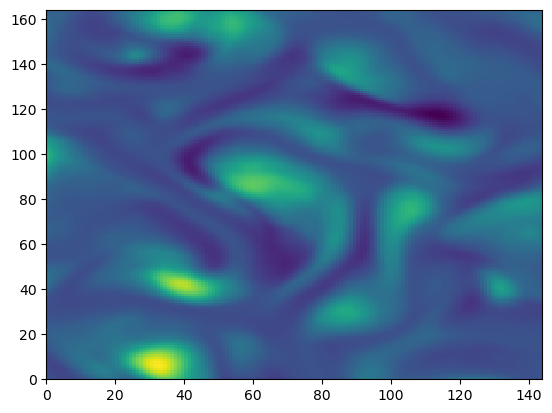

PyObject <matplotlib.collections.QuadMesh object at 0x14a734eb9cc0>

In [88]:
box3 = [45,55,5,15];
box3 = [90,140,70,100];
box3 = [135,157,50,75];

∇2ψ2 = irfft(- grid_jl.Krsq .* (psiBTh .- psiBCh), grid_jl.ny)

CBC =  2*S32*(f0/sum(H)) .* psiBC .*  ∂xpsiBT  # 0.5 *  (U[1] * Ld^-2) .* psiBC .* ∂xpsiBT #

BCEAPE = -(μ/2) * psiBC .* ∇2ψ2

box3_ind = round.(Int, box3 .* (Nx*Ld/L))

CBC_l = CBC[box3_ind[1]:box3_ind[2],box3_ind[3]:box3_ind[4]]
BCEAPE_l = BCEAPE[box3_ind[1]:box3_ind[2],box3_ind[3]:box3_ind[4]]

# plt.pcolormesh(CBC_l')
plt.pcolormesh(BCEAPE_l')



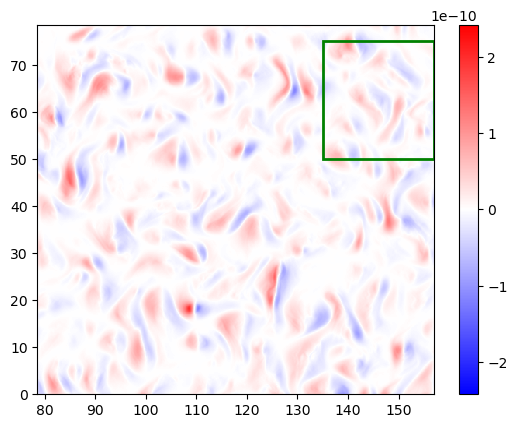

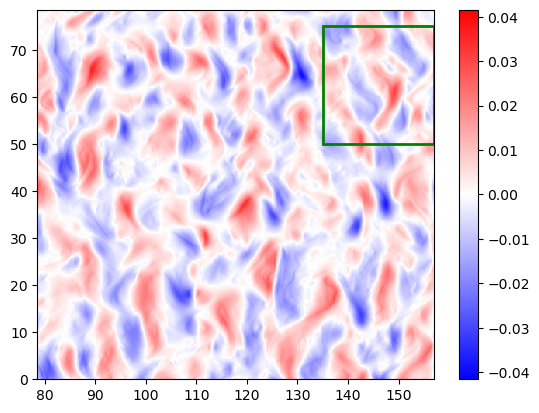

PyObject <matplotlib.patches.Rectangle object at 0x14a736c30a60>

In [90]:
x = y = collect(range(0,Lx,Nx)) ./ Ld

lim = maximum(abs.(CBC))

norm = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim, vmax=lim)

fig,ax1 = plt.subplots(1,1)

pc1 = ax1.pcolormesh(x,y, CBC',cmap=PyPlot.cm.bwr, norm=norm)

plt.colorbar(pc1)

ax1.add_patch(matplotlib.patches.Rectangle((box3[1], box3[3]), box3[2]-box3[1], box3[4]-box3[3], facecolor="none", ec="green", lw=2))


plt.xlim(25*2*pi/2, 25*2*pi)
plt.ylim(0, 25*2*pi/2)

# plt.scatter(EKEBC,CI)

fig,ax2 = plt.subplots(1,1)

lim = maximum(abs.(vBT))/1

norm2 = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-lim, vmax=lim)

pc2 = ax2.pcolormesh(x,y,vBT',cmap=PyPlot.cm.bwr, norm=norm2)

# ax2.axvline(90.3435,color="black", linestyle="dashed",alpha=0.5,linewidth=3)

plt.colorbar(pc2)

plt.xlim(25*2*pi/2, 25*2*pi)
plt.ylim(0, 25*2*pi/2)

ax2.add_patch(matplotlib.patches.Rectangle((box3[1], box3[3]), box3[2]-box3[1], box3[4]-box3[3], facecolor="none", ec="green", lw=2))


In [83]:
box3 = [122,130,60,68]; 
box3_ind = round.(Int, box3 .* (Nx*Ld/L))


println(sum(CBC_l)/sum(CBC))
# println(sum(BCEAPE))



0.010843993160389179


In [78]:
GC.gc()


In [38]:
maximum(abs.(var2))

0.006310046419974787

# Figure showing mechanics of frictional energization

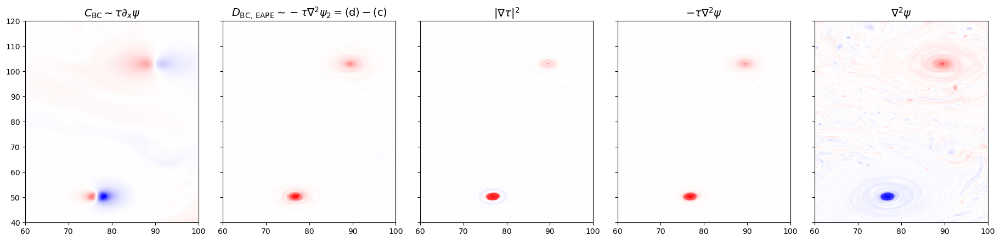

9-element Vector{PyCall.PyObject}:
 PyObject Text(0, 40.0, '')
 PyObject Text(0, 50.0, '')
 PyObject Text(0, 60.0, '')
 PyObject Text(0, 70.0, '')
 PyObject Text(0, 80.0, '')
 PyObject Text(0, 90.0, '')
 PyObject Text(0, 100.0, '')
 PyObject Text(0, 110.0, '')
 PyObject Text(0, 120.0, '')

In [86]:
fig,ax = plt.subplots(1,5, figsize=(18,4))
ax1=ax[1]; ax2=ax[2]; ax3=ax[3]; ax4=ax[4]; ax5=ax[5];

fig.tight_layout(pad=0.1)

fsize=14

x = y = collect(range(0,Lx,Nx)) ./ Ld


# xmin = 134
# xmax = 140
# ymin = 25
# ymax = 31

xmin = 60
xmax = 100
ymin = 40
ymax = 120

# xmin = 120
# xmax = 140
# ymin = 40
# ymax = 65

# xmin = 25*2*pi/2
# xmax = 25*2*pi
# ymin = 1
# ymax = 25*2*pi/2

box_ind = round.(Int, [xmin, xmax, ymin, ymax] .* (Nx*Ld/L)) .- 1


x = x[box_ind[1]:box_ind[2]]
y = y[box_ind[3]:box_ind[4]]
# plotting CBC, DBCEAPE, baroclinic EKE, cross-invariant 
########################################################################
var1 = psiBC[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]] .*  ∂xpsiBT[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]

lim1 = maximum(abs.(var1))
norm1 = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-1, vmax=1)

pc1 = ax1.pcolormesh(x,y, (var1./lim1)',cmap=PyPlot.cm.bwr, norm=norm1)

ax1.set_xlim(xmin, xmax)
ax1.set_ylim(ymin, ymax)

ax1.set_title(L"C_\mathrm{BC} \sim \tau \partial_x \psi", fontsize=fsize)

#######################################################################
var2 = - psiBC[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]] .* ∇2ψ2[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]
# var2 = var4 .- var3

lim2 =  maximum(abs.(var2))
norm2 = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-1, vmax=1)

pc2 = ax2.pcolormesh(x,y, (var2./lim2)',cmap=PyPlot.cm.bwr, norm=norm2)

ax2.set_xlim(xmin, xmax)
ax2.set_ylim(ymin, ymax)

ax2.set_title(L"D_\mathrm{BC, \, EAPE} \sim - \tau \nabla^2 \psi_{2} = \mathrm{(d)} - \mathrm{(c)}", fontsize=fsize)


########################################################################
# var3 = deepcopy(mod2psiBC[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]])
var3 = -psiBC[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]] .* zetaBC[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]

lim3 =  maximum(abs.(var3))
norm3 = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-1, vmax=1)

pc3 = ax3.pcolormesh(x,y, (var3./lim3)',cmap=PyPlot.cm.bwr, norm=norm3)

ax3.set_xlim(xmin, xmax)
ax3.set_ylim(ymin, ymax)

ax3.set_title(L"| \nabla \tau|^2", fontsize=fsize)


########################################################################
var4 = -zetaBT[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]] .* psiBC[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]
# var4 = @. uBT * uBC + vBT * vBC
# var4 = var4[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]

# var4 = vBT[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]

lim4 =  maximum(abs.(var4))
norm4 = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-1, vmax=1)

pc4 = ax4.pcolormesh(x,y, (var4./lim4)',cmap=PyPlot.cm.bwr, norm=norm4)

ax4.set_xlim(xmin, xmax)
ax4.set_ylim(ymin, ymax)

ax4.set_title(L"- \tau \nabla^2 \psi", fontsize=fsize)


########################################################################
var5 = zetaBT[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]
# var4 = @. uBT * uBC + vBT * vBC
# var4 = var4[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]

# var4 = vBT[box_ind[1]:box_ind[2], box_ind[3]:box_ind[4]]

lim5 =  maximum(abs.(var5))
norm5 = matplotlib.colors.TwoSlopeNorm(vcenter=0., vmin=-1, vmax=1)

pc5 = ax5.pcolormesh(x,y, (var5./lim5)',cmap=PyPlot.cm.bwr, norm=norm4)

ax5.set_xlim(xmin, xmax)
ax5.set_ylim(ymin, ymax)

ax5.set_title(L"\nabla^2 \psi", fontsize=fsize)


########################################################################

ax2.set_yticklabels([])
ax3.set_yticklabels([])
ax4.set_yticklabels([])
ax5.set_yticklabels([])

#######################################################################



#######################################################################




# Calculating growth rate

In [88]:
function growth_curve(f0,H,U,rho,kx,ky,h0,μ)

    k2 = @. kx^2 # + ky^2

    # sigma = zeros(length(kx),)
    
    dyQ2 = (f0/H[2]) * (h0 - S32)

    # a = @. k2 * (k2 + Ld^-2)
    # b = @. - U[1] * sqrt(k2) * k2 * (k2 + Ld^-2) + (k2 + 0.5 * Ld^-2) * (kx * (f0/H[2]) * h0 + 1im * μ * k2)
    # c = @. - U[1] * sqrt(k2) * k2 * (kx * dyQ2 + 1im * μ * k2) 

    # pr = @. imag(-b/2/a + sqrt(b^2 - 4*a*c)/2/a)
    # nr = @. imag(-b/2/a - sqrt(b^2 - 4*a*c)/2/a)

    a = @. k2 * (k2 + Ld^-2)
    b = @. - U[1] * k2 * (k2 + Ld^-2) + (k2 + 0.5 * Ld^-2) * ((f0/H[2]) * h0 + 1im * μ * sqrt(k2))
    c = @. - U[1] * k2 * ((f0/H[2]) * h0 - 0.5 * Ld^-2 *U[1] + 1im * μ * sqrt(k2)) 

    pr = @. sqrt(k2) * imag(-b/2/a + sqrt(b^2 - 4*a*c)/2/a)
    nr = @. sqrt(k2) * imag(-b/2/a - sqrt(b^2 - 4*a*c)/2/a)

    sigma = maximum(hcat(pr,nr),dims=2) # * 3600 * 24 * 7

    sigma[1] = 0.

    return sigma
end


growth_curve (generic function with 1 method)

In [89]:

function calc_growth(t, E_in)
  # E_tot = sum(E_in,dims=2)
  # min_ind,trash = Peaks.findminima(diff(E_tot[:],dims=1))
  # f = min_ind[end] + 1 # get first time index from the last renormalization cycle
  # t, KE1_new, KE2_new, KE3_new, PE32_new, PE52_new = t[f:end], E_in[f:end,1], E_in[f:end,2], E_in[f:end,3], E_in[f:end,4], E_in[f:end,5]     # construct time series from last section of growth in upper layer
  
  sigma_KE  = growth_rate(t,E_in)

  return sigma_KE
end

function growth_rate(t,E)

    n = size(t)[1]
    d = Matrix(reshape(log.(E), (1, n)))
    gm = Matrix(reshape(t, (1, n)))
    Gm = Matrix([ones(n, 1) gm'])
    GmT = Gm'
    mv = inv(GmT*Gm)*(GmT*d')
    sigma = mv[2]

    return sigma
end


growth_rate (generic function with 1 method)

In [90]:
function layered_nrg(vars, params, grid, sol, ψ)
    
    nlayers = 2
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / params.ρ[1] # reduced gravity at the interface
    F = (params.f₀^2 / (g′ * sum(params.H)))
    μ = params.μ
    Ld = F^-0.5
    
    ψh = rfft(ψ)
    
    ∂ψ∂x = irfft(im * grid.kr .* ψh, grid.nx)
    ∂ψ∂y = irfft(im * grid.l  .* ψh, grid.nx)
    
    mod2∇ψ1 = @. ∂ψ∂x[:,:,1]^2 + ∂ψ∂y[:,:,1]^2
    mod2∇ψ2 = @. ∂ψ∂x[:,:,2]^2 + ∂ψ∂y[:,:,2]^2
    
    APE_d = @. 0.5 * F * (ψ[:,:,1] - ψ[:,:,2])^2
    APE = sum(APE_d) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    KE_d = zeros(grid.nx, grid.ny, nlayers)
    KE_d[:,:,1] = @. 0.5 * mod2∇ψ1 
    KE_d[:,:,2] = @. 0.5 * mod2∇ψ2 
    KE = dropdims(sum(dropdims(sum(KE_d,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    return KE, APE
end

layered_nrg(prob, ψ) = layered_nrg(prob.vars, prob.params, prob.grid, prob.sol, ψ)


layered_nrg (generic function with 2 methods)

In [125]:

function KE_growth_rate(U,ρ,H,μstar, νstar, drag_bool, L,h0s, Nx)
    Nh = length(h0s)

    sigma = zeros(Nh,)
    sigma_th = zeros(Nh,)

    μ = μstar * (U[1]/2) / Ld

    gp = (g/rho0)*(ρ[2] - ρ[1])

    prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, nν, ν, eta, topographic_pv_gradient,
    μ, β, dt, stepper, aliased_fraction=1/3);

    sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

    for k in range(1,length(h0s))

        KE = zeros(0)
        t = zeros(0)

        i = 1
        n = 0
        start_bool=false
        active_bool=true

        while active_bool==true
            i+=1
            
            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                n += 1
                
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                KE0, APE0 = layered_nrg(prob,ψ)

                KE = vcat(KE,sum(KE0))

                t = vcat(t,a["jld_data"]["t"][j])

                # check for start
                if n>1 && start_bool==false
                    if KE[end-1] < KE[end]
                        start_bool=true
                        KE = zeros(0)
                        t = zeros(0)
                    end
                end

                # check for end
                if start_bool==true && length(KE)>3 && (KE[end]-KE[end-1]) < (KE[end-1] - KE[end-2])
                    active_bool=false
                    KE = KE[1:end-1]
                    t  = t[1:end-1]
                end

            end

        end

        # println(size(t))
        # println(size(KE))

        sigma[k] = calc_growth(t,KE)

        sigma_th[k] = maximum(growth_curve(f0,H,U,rho,grid_jl.k,grid_jl.l,h0s[k],μ))

        GC.gc()
        
    end
    
    return sigma, sigma_th
end


KE_growth_rate (generic function with 1 method)

In [121]:
GC.gc()

In [126]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

#####################

##################

sigma_nu0_kap1, sigma_th_nu0_kap1 = KE_growth_rate(U,ρ,H, μstar, νstar, drag_bool,L,h0s, Nx);



In [127]:
μstar = 0.5   # 1.0 # 

sigma_nu0_kap0p5, sigma_th_nu0_kap0p5 = KE_growth_rate(U,ρ,H, μstar, νstar, drag_bool,L,h0s, Nx);


In [128]:
μstar = 2.0   # 1.0 # 

sigma_nu0_kap2, sigma_th_nu0_kap2 = KE_growth_rate(U,ρ,H, μstar, νstar, drag_bool,L,h0s, Nx);


In [129]:
μstar = 4.0   # 1.0 # 

sigma_nu0_kap4, sigma_th_nu0_kap4 = KE_growth_rate(U,ρ,H, μstar, νstar, drag_bool,L,h0s, Nx);


In [106]:
a = sum(KE_ot,dims=2)
bs = zeros(length(a))

for i = range(2,length(a))
    bs[i]= a[i-1] < a[i]
    # bs[i-3] = (a[i]-a[i-1]) < (a[i-1] - a[i-2])
end


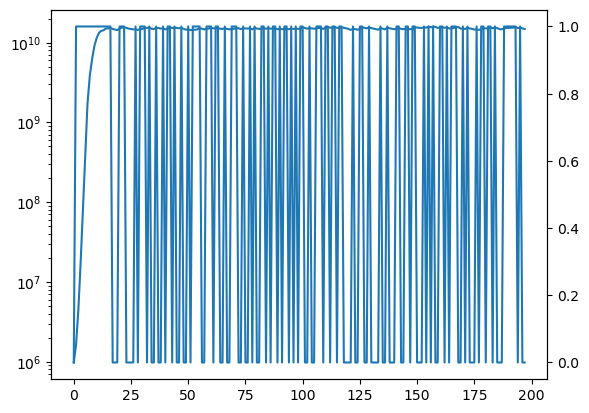

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x1529a337a2f0>

In [107]:
fig,ax = plt.subplots(1,1)
axt = ax.twinx()

ax.semilogy(a)
axt.plot(bs)


growth_curve (generic function with 1 method)

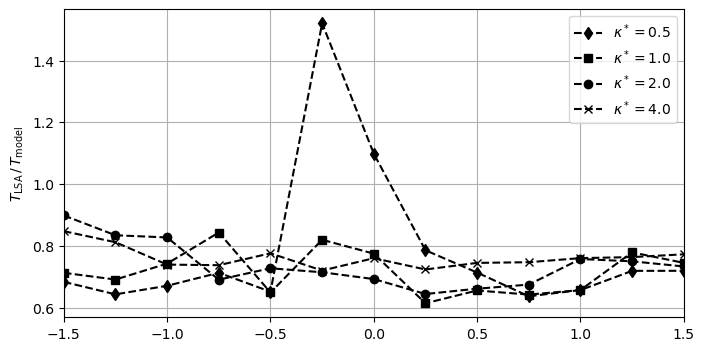

PyObject Text(26.400000000000006, 0.5, '$T_\\mathrm{LSA} \\, / \\, T_\\mathrm{model} $')

In [130]:
fig, ax = plt.subplots(1,1,figsize=(8,4))

x = h0s ./ S32

###################################################
ax.plot(x, sigma_th_nu0_kap0p5 ./ sigma_nu0_kap0p5, color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")
ax.plot(x, sigma_th_nu0_kap1 ./ sigma_nu0_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax.plot(x, sigma_th_nu0_kap2 ./ sigma_nu0_kap2, color="k", marker="o", linestyle="--", label=L"\kappa^* = 2.0")
ax.plot(x, sigma_th_nu0_kap4 ./ sigma_nu0_kap4, color="k", marker="x", linestyle="--", label=L"\kappa^* = 4.0")





###################################################

ax.set_xlim(x[1], x[end])

ax.grid()

ax.legend()

ax.set_ylabel(L"T_\mathrm{LSA} \, / \, T_\mathrm{model} ")



# plt.plot(h0s./S32, a)

In [41]:
using Statistics

function modal_nrgfluxes(vars, params, grid, sol, ψ)

    nlayers = 2
    δ = params.H[1]/params.H[2]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at the interface
    μ = params.μ
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])

    vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    vars.ψh[:,:,2] = rfft(ψ[:,:,2])

    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])

    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)

    ∂xψBC = irfft(im * grid.kr .* ψBCh, grid.ny)
    ∂xψBT = irfft(im * grid.kr .* ψBTh, grid.ny)

    ∂yψBC = irfft(im * grid.l .* ψBCh, grid.ny)
    ∂yψBT = irfft(im * grid.l .* ψBTh, grid.ny)
    
    ζ = zeros(grid.nx, grid.ny, 2)   # irfft(- grid.Krsq .* ψh, grid.nx)
    ζ[:,:,1] = irfft(- grid.Krsq .* vars.ψh[:,:,1], grid.nx)
    ζ[:,:,2] = irfft(- grid.Krsq .* vars.ψh[:,:,2], grid.nx)

    ∂xζ1 = irfft(im * grid.kr .* rfft(ζ[:,:,1]), grid.ny)

    ζBC = irfft(- grid.Krsq .* ψBCh, grid.nx)  # BC
    ζBT = irfft(- grid.Krsq .* ψBTh, grid.nx)   # BT

    ∂xζBC = irfft(im * grid.kr .* rfft(ζBC), grid.ny)
    ∂yζBC = irfft(im * grid.l  .* rfft(ζBC), grid.ny)
    
    ∂xζBT = irfft(im * grid.kr .* rfft(ζBT), grid.ny)
    ∂yζBT = irfft(im * grid.l  .* rfft(ζBT), grid.ny)
    
    
#     vertfluxes, dragfluxes = zeros(grid.nkr,nlayers), zeros(grid.nkr,nlayers+1)

    U₁, U₂ = view(params.U, :, :, 1), view(params.U, :, :, 2)
    
    S32 = params.f₀ * U₁[1,1] ./ g′

    # Linear modal transfer terms
    LT = zeros(grid.nx,grid.ny,2)
    LT[:,:,1] = @. 0.5 * ψBT * U₁ * ∂xζ1   # BC to BT
    LT[:,:,2] = @. 0.5 * U₁ * ψBC * ∂xζBT # alternate def. of line above; checking for equality
    
    # LT[:,:,2] = @. 0.5 * ψBC * U₁ * ∂xζ1   # BT to BC

    # Topo transfer term
    TT = - 0.5 * ∂yηb * (params.f₀ / params.H[2]) .* ψBT .* ∂xψBC
    # k-space version: -0.5 * (params.f₀ / params.H[2]) * ∂yηb * (conj(ψBTh) * ∂xψBCh + ψBTh * conj(∂xψBCh))
    
    # Baroclinic production term
    BC = (params.f₀ / params.H[1]) * S32 .* ψBC .* ∂xψBT

    # Nonlinear terms, 
    # psi J(tau, zetaBC)
    NL = zeros(grid.nx,grid.ny,4)
    
    NL[:,:,1] = ψBT .* (∂xψBC .* ∂yζBC .- ∂yψBC .* ∂xζBC)  # NL BT <--> BC (EKE)
    NL[:,:,2] = ψBT .* (∂xψBT .* ∂yζBT .- ∂yψBT .* ∂xζBT)   # NL BT (EKE)
    NL[:,:,3] = ψBC .* (∂xψBC .* ∂yζBT .- ∂yψBC .* ∂xζBT)   # NL BC 2 (EKE)
    NL[:,:,3] = ψBC .* Ld^-2 .* (∂xψBT .* ∂yψBC .- ∂yψBT .* ∂xψBC)    # NL BC 3 (EAPE)
    
    
    # Drag terms
    DS = zeros(grid.nx,grid.ny,2)
    DS[:,:,1] = @. - (μ/2) * ψBT .* (ζBC .- ζBT)     # BT drag term
    DS[:,:,2] = @. (μ/2) * ψBC .* (ζBC .- ζBT)      # BC drag term    
    
    # integrating in y
    LT = dropdims(sum(dropdims(sum(LT,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    TT = sum(TT) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    BC = sum(BC) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    NL = dropdims(sum(dropdims(sum(NL,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    DS = dropdims(sum(dropdims(sum(DS,dims=1),dims=1),dims=1),dims=1) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    resid = BC + sum(DS)
    
    # energies
    BTKE = 0.5 * sum(∂xψBT.^2 .+ ∂yψBT.^2) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    BCKE = 0.5 * sum(∂xψBC.^2 .+ ∂yψBC.^2) * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    BCEAPE = 2 * Ld1^-2 * sum(ψBC .* ψBC)  * grid.dx * grid.dy * grid.Lx^-1 * grid.Ly^-1
    
    return LT, TT, BC, NL, DS, BTKE, BCKE, BCEAPE, resid

end

modal_nrgfluxes(prob, ψ) = modal_nrgfluxes(prob.vars, prob.params, prob.grid, prob.sol, ψ)


modal_nrgfluxes (generic function with 2 methods)

In [42]:
filt_order = 4
innerK= 2/3


function nrg_budget_ts(U,ρ,H,h0,μstar, νstar, drag_bool, L, Nx)

    if drag_bool==false
        mm = μstar * (U[1] / 2) / Ld
    else
        mm = μstar / Ld
    end
        
    topographic_pv_gradient = (0, (f₀/H[end]) * h0)
        
    prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
    μ=mm, β, dt, stepper, aliased_fraction=1/3,drag_bool, filt_order, innerK)

    sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

    GC.gc()

    file1 = jld_name2(data_dir,μstar, νstar, drag_bool,L, h0,ρ,U,Nx,H,1)
    files = glob(file1[34:end-5]*"*", data_dir)

    if μstar < 1.55
        N_yr = 90 # round(Int, (length(files)-2)/2)
    else
        N_yr = 90 #length(files)
    end

    
    println(N_yr)
    # yrs = collect(range(1,N_yr))
        
    ## pre-allocate
    window = Int(round(250 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times
    nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output
    
    LT0 = zeros(nmax,2)
    TT0 = zeros(nmax)
    BC0 = zeros(nmax)
    NL0 = zeros(nmax,4)
    DS0 = zeros(nmax,2)
    BTEKE0 = zeros(nmax)
    BCEKE0 = zeros(nmax)
    BCEAPE0 = zeros(nmax)
    resid0 = zeros(nmax)
    te = zeros(nmax)
    ph_wt = zeros(nmax,)
    amp_ratio = zeros(nmax,)

    n=1
    ##

    for i in range(1,50)  # year range
        
        a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0,ρ,U,Nx,H,i))

        s = size(a["jld_data"]["psi_ot"])

        if length(s)>3
            s=s[4]
        else
            s=1
        end

        for j in range(1,s)
            ψ = a["jld_data"]["psi_ot"][:,:,:,j]

            LT, TT, BC, NL, DS, BTEKE, BCEKE, BCEAPE, resid = modal_nrgfluxes(prob,ψ)

            LT0[n,:] = LT'
            TT0[n] = TT
            BC0[n] = BC
            NL0[n,:] = NL'
            DS0[n,:] = DS'
            BTEKE0[n] = BTEKE
            BCEKE0[n] = BCEKE
            BCEAPE0[n] = BCEAPE
            resid0[n] = resid    
            te[n] = a["jld_data"]["t"][j]* (U[1]/2/Ld)

            # phase stuff
            st = collect(range(1,1024,step=25));
            k_max_ind=75

            for k in st
                
                psi1 = rfft(ψ[:,k,1])
                psi2 = rfft(ψ[:,k,2])

                wts = abs2.(psi1[1:k_max_ind]) .+ abs2.(psi2[1:k_max_ind])
                wts = wts ./ sum(wts)

                amp_ratio[n] += sum(abs2.(psi2)) / sum(abs2.(psi1))
                
                for l in range(1,k_max_ind)

                    ph_wt[n] += wts[l] * angle(psi1[l]/psi2[l]) # amplitude-weighted phase at each wavenumber for nth slice

                end
            end

            ph_wt[n] = ph_wt[n]/length(st)
            amp_ratio[n] = amp_ratio[n]/length(st)

                
            n+=1
        end

        GC.gc()

    end

    LT_out = LT0[1:n-1,:]
    TT_out =  TT0[1:n-1]
    BC_out =  BC0[1:n-1]
    NL_out =  NL0[1:n-1,:]
    DS_out = DS0[1:n-1,:]
    BTEKE_out = BTEKE0[1:n-1]
    BCEKE_out = BCEKE0[1:n-1]
    BCEAPE_out = BCEAPE0[1:n-1]
    resid_out = resid0[1:n-1]
    t_out = te[1:n-1]
    amp_ratio_out = amp_ratio[1:n-1]

    ph_wt_out = ph_wt[1:n-1]

    return t_out, LT_out, TT_out, BC_out, NL_out, DS_out, BTEKE_out, BCEKE_out, BCEAPE_out, resid_out, ph_wt_out, amp_ratio_out
end


nrg_budget_ts (generic function with 1 method)

In [43]:
# using Statistics
# using FourierFlows

# KE_ot = zeros(0,2)
# q_ot = zeros(0)
# te = zeros(0)

# h_ind = 6

# νstar = 0. # 
# μstar = 1.0
# drag_bool = false

# Nx=1024

# L=Lx=Ly=25*2*pi*Ld

# file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,1)
# files = glob(file1[34:end-5]*"*", data_dir)

# N_yr = length(files)-2

# rho[1] = ρ[1] = rhos[1]
# U[1] = Us[1]

# prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, nν, ν, eta, topographic_pv_gradient,
# μ, β, dt, stepper, aliased_fraction=1/3);

# sol, clock, params, vars, grid_jl = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

# for i in range(2,N_yr)
    
#     a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,i))
    
#     # println(jld_name(data_dir,μstar, νstar, drag_bool,h0s[h_ind],ρ,U,Nx,H,i))

#     s = size(a["jld_data"]["psi_ot"])
    
#     if length(s)>3
#         s=s[4]
#     else
#         s=1
#     end    

#     # println(s)
    
#     for j in range(1,s)
#         ψ = a["jld_data"]["psi_ot"][:,:,:,j]

#         LT, TT, BC, NL, DS, BTKE, BCKE, BCEAPE, resid = (prob, ψ)

#         # ψh = deepcopy(vars.ψh); fwdtransform!(ψh, ψ, params)
        
#         # qh = deepcopy(ψh);                pvfromstreamfunction!(qh, ψh, params, grid_jl)
        
#         # q = deepcopy(ψ);                  invtransform!(q, qh, params)

#         # te = vcat(te,(a["jld_data"]["t"][j]* (U[1]/2/Ld)))

#         # abs²∇𝐮h = vars.uh        # use vars.uh as scratch variable
#         # @. abs²∇𝐮h = grid_jl.Krsq * abs2(ψh)

#         # KE1 = 0.5 * mean(FourierFlows.parsevalsum(view(abs²∇𝐮h, :, :, 1), grid_jl))
#         # KE2 = 0.5 * mean(FourierFlows.parsevalsum(view(abs²∇𝐮h, :, :, 2), grid_jl))
        
#         KE_ot = vcat(KE_ot, [KE1,KE2]')

#         q_ot = vcat(q_ot, 0.5 * mean(q[:,:,1].^2 .+ q[:,:,2].^2))
        
#     end
    
# end

In [44]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

h_ind = 8
h_inds=[2,5,7,9,12]

for h_ind in h_inds
    t_ts_nu0_kap1, LT_ts_nu0_kap1, TT_ts_nu0_kap1, BC_ts_nu0_kap1, NL_ts_nu0_kap1, DS_ts_nu0_kap1, BTEKE_ts_nu0_kap1, BCEKE_ts_nu0_kap1, BCEAPE_ts_nu0_kap1, resx_ts_nu0_kap1, ph_ts_nu0_kap1, ar_ts_nu0_kap1 = nrg_budget_ts(U,ρ,H,h0s[h_ind],μstar, νstar, drag_bool,L, Nx);

    if h_ind == 2
        global t_out = t_ts_nu0_kap1
        global d_out = 2*DS_ts_nu0_kap1[:,2]
        global BC_out = BC_ts_nu0_kap1
        global ph_out = ph_ts_nu0_kap1
    else
        t_out = hcat(t_out, t_ts_nu0_kap1)
        d_out = hcat(d_out, 2*DS_ts_nu0_kap1[:,2])
        BC_out = hcat(BC_out, BC_ts_nu0_kap1)
        ph_out = hcat(ph_out, ph_ts_nu0_kap1)
    end
end

GC.gc()


90
90
90
90
90


In [ ]:
fig, ax = plt.subplots(4,1,figsize=(5,7.5), height_ratios=[0.33,0.33,0.01,0.33])
ax1=ax[1]; ax2=ax[2]; ax3=ax[4];
fig.tight_layout(pad=0.0)

ax[3].axis("off")

fsize=14
lsize=10

############################################################################

ax1.semilogy(t_out[:,3], BC_out[:,3], "k-", label=L"C_\mathrm{BC}")
ax1.plot(t_out[:,3], d_out[:,3], "k--", label=L"D_\mathrm{BC, \, EAPE}")
ax1.plot([],[],"r-.", label=L"\Delta \phi_{1,2}")

ax1t = ax1.twinx()

ax1t.plot(t_out[:,3], ph_out[:,3], "r-.")
# ax1t.plot(t_ts_nu0_kap1, ar_ts_nu0_kap1, "r", linestyle="dotted")

ax1.set_xlim(5,250)
ax1.grid()

ax1.set_xticklabels([])

ax1.legend(loc="upper right", fontsize=lsize, ncol=3)

ax1.set_ylim(10^-15, 8*10^-10)
ax1t.set_ylim(0, 1.85)

ax1.set_ylabel(L"\mathrm{Budget \, terms} \ [\mathrm{m}^2 \, \mathrm{s}^{-3}]", fontsize=fsize)
ax1t.set_ylabel(L"\Delta \phi_{1,2} \ [\mathrm{rad.}]", fontsize=fsize)


###############################################################################
ns = 1


for k in range(1,length(h_inds))
    id = L"\partial_y \eta_b = "*string(round(h0s[k]/S32,digits=2))
    ls = "solid"
    if h0s[h_inds[k]]<0
        ls = "dashed"
    end
    ax2.plot(t_out[:,k], d_out[:,k] ./ BC_out[:,k], color=h_color(h0s[h_inds[k]],hc_range,colors), label=id, linestyle=ls)
end
    
    # ax2.plot(t_ts_nu0_kap1[ns:end], 2* DS_ts_nu0_kap1[ns:end,2] ./ BC_ts_nu0_kap1[ns:end], "k-")

ax2.grid()

ax2.set_xlim(5,250)
ax2.set_ylim(-2,2)

ax2.set_ylabel(L"D_\mathrm{BC}^\mathrm{EAPE} \, / \, C_\mathrm{BC}", fontsize=fsize)

ax2.set_xticklabels([])

###############################################################################

for k in range(1,length(h_inds))
    id = L"\partial_y \eta_b = "*string(round(h0s[h_inds[k]]/S32,digits=2))
    ls = "solid"
    if h0s[h_inds[k]]<0
        ls = "dashed"
    end
    ax3.plot(t_out[:,k], ph_out[:,k], color=h_color(h0s[h_inds[k]],hc_range,colors), label=id, linestyle=ls)
end
    
    # ax2.plot(t_ts_nu0_kap1[ns:end], 2* DS_ts_nu0_kap1[ns:end,2] ./ BC_ts_nu0_kap1[ns:end], "k-")

ax3.grid()

ax3.set_xlim(5,250)
ax3.set_ylim(0,2.2)

ax3.set_ylabel(L"\Delta \phi_{1,2} \  [\mathrm{rad.}]", fontsize=fsize)


ax3.set_xlabel(L"t \, U \, / \, \lambda",fontsize=fsize)

###############################################################################
ax3.legend(loc="upper right", bbox_to_anchor=(0.965,1.325),fontsize=lsize, ncol=3)


ax1.tick_params(labelsize=lsize)
ax2.tick_params(labelsize=lsize)
ax3.tick_params(labelsize=lsize)


ax1.text(0.15, 0.925, L"\mathbf{(a)} \ \ \partial_y \eta_b = 0.0", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax1.transAxes);
ax2.text(0.05, 0.925, L"\mathbf{(b)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax2.transAxes);
ax3.text(0.05, 0.925, L"\mathbf{(c)}", fontsize=fsize, horizontalalignment="center",verticalalignment="center", transform = ax3.transAxes);


ax1t.spines["right"].set_color("red")
# ax1t.spines['top'].set_color("red")
ax1t.yaxis.label.set_color("red")
ax1t.tick_params(axis="y", colors="red")

savefig("./drag_figs/time_series.pdf",bbox_inches="tight")


GC.gc()



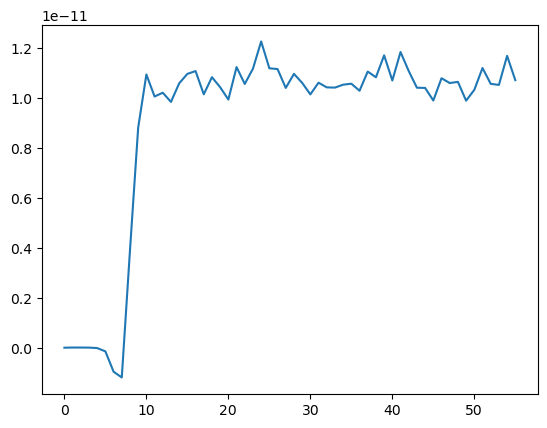

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x1463b90e1570>

In [25]:
plt.plot(2* DS_ts_nu0_kap1[ns:end,2])

56×5 Matrix{Float64}:
   0.000244141    0.000244141    0.000244141    0.000244141    0.000244141
   5.00024        5.00024        5.00024        5.00024        5.00024
  10.0002        10.0002        10.0002        10.0002        10.0002
  15.0002        15.0002        15.0002        15.0002        15.0002
  20.0002        20.0002        20.0002        20.0002        20.0002
  25.0002        25.0002        25.0002        25.0002        25.0002
  30.0002        30.0002        30.0002        30.0002        30.0002
  35.0002        35.0002        35.0002        35.0002        35.0002
  40.0002        40.0002        40.0002        40.0002        40.0002
  45.0002        45.0002        45.0002        45.0002        45.0002
  50.0002        50.0002        50.0002        50.0002        50.0002
  55.0002        55.0002        55.0002        55.0002        55.0002
  60.0002        60.0002        60.0002        60.0002        60.0002
   ⋮                                                         


# Looking at barotropic jet formation

In [28]:

νstar = 0. # 
μstar = 0.125
drag_bool = false

Nx=1024

L=Lx=Ly=25*2*pi*Ld

h_ind = 13

#####################################################################################################
N_yr = 90

a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[h_ind],ρ,U,Nx,H,N_yr))


ψ = a["jld_data"]["psi_ot"][:,:,:,end]

# psiBT = 0.5 * (psi[:,:,1] .+ psi[:,:,2])
# psiBC = 0.5 * (psi[:,:,1] .- psi[:,:,2])

# psiBTh = rfft(psiBT)
# psiBCh = rfft(psiBC)

# zetaBT = - irfft( grid_jl.Krsq .* psiBTh, grid_jl.ny)
# zetaBC = - irfft( grid_jl.Krsq .* psiBCh, grid_jl.ny)


# uBT = irfft(- im * grid_jl.l  .* rfft(psiBT), grid_jl.ny)
# vBT = irfft(  im * grid_jl.kr .* rfft(psiBT), grid_jl.ny)

# uBT_bar = mean(uBT,dims=1)

# vars.ψh[:,:,1] = rfft(ψ[:,:,1])
# vars.ψh[:,:,2] = rfft(ψ[:,:,2])

ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])

ψBCh = rfft(ψBC)
ψBTh = rfft(ψBT)

∂xψBC = irfft(im * grid_jl.kr .* ψBCh, grid_jl.ny)
∂xψBT = irfft(im * grid_jl.kr .* ψBTh, grid_jl.ny)

∂yψBC = irfft(im * grid_jl.l .* ψBCh, grid_jl.ny)
∂yψBT = irfft(im * grid_jl.l .* ψBTh, grid_jl.ny)

uBT = irfft(- im * grid_jl.l  .* rfft(ψBT), grid_jl.ny)

uBT_bar = mean(uBT,dims=1)


1×1024 Matrix{Float64}:
 0.000316252  0.000338832  0.000350799  …  0.000252896  0.000285368

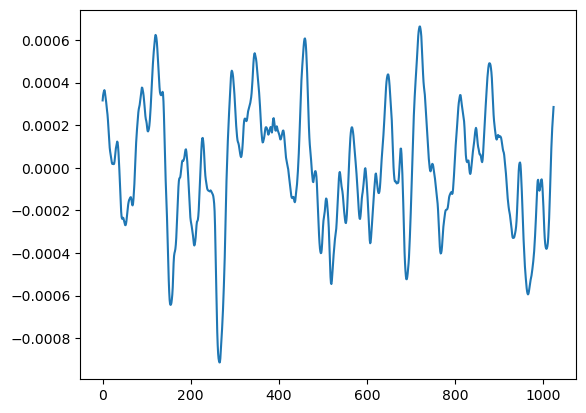

1-element Vector{PyCall.PyObject}:
 PyObject <matplotlib.lines.Line2D object at 0x1474fab5c040>

In [29]:
plt.plot(uBT_bar')

# First figures for linear versus quad drag

In [10]:
fn = data_dir*"layered_nrgs_xspace_nu0_kap1.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end



In [11]:
fn = data_dir*"layered_nrgs_xspace_nu0_kap0p5.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end



In [12]:
fn = data_dir*"layered_nrgs_xspace_nu0_kap0p25.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end



In [13]:
fn = data_dir*"layered_nrgs_xspace_nu0_mu1.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end



In [14]:
fn = data_dir*"layered_nrgs_xspace_nu0_mu0p5.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [15]:
fn = data_dir*"layered_nrgs_xspace_nu0_mu0p25.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


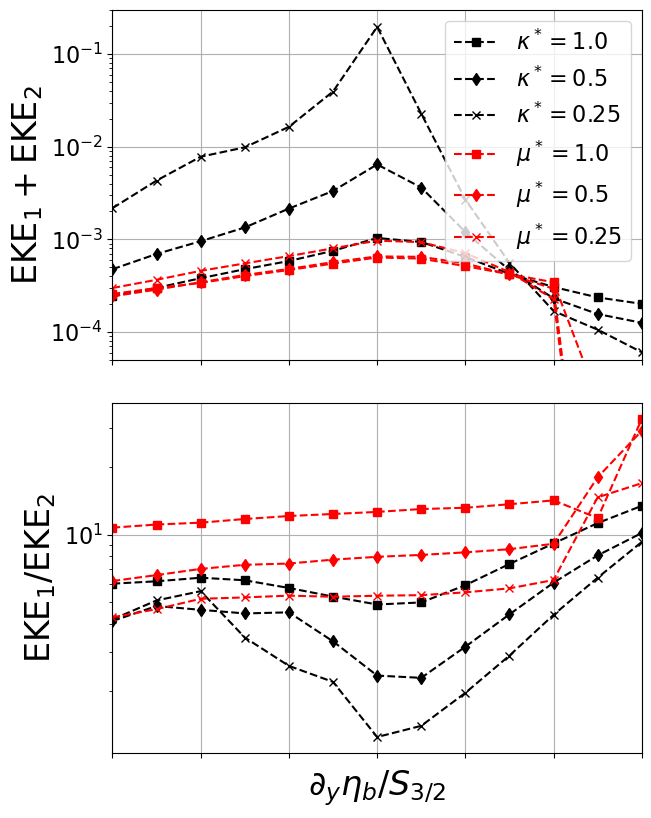

In [62]:
fig, ax = plt.subplots(2,1, figsize=(6,8))
fig.tight_layout(pad=1.0)

ax1=ax[1]; ax2=ax[2];

lsize = 24
tsize = 16

x = h0s ./ S32

############################################################################
ax1.plot(x, EKE12_nu0_kap1[:,1] .+ EKE12_nu0_kap1[:,2], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, EKE12_nu0_kap0p5[:,1] .+ EKE12_nu0_kap0p5[:,2], color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")
ax1.plot(x, EKE12_nu0_kap0p25[:,1] .+ EKE12_nu0_kap0p25[:,2], color="k", marker="x", linestyle="--", label=L"\kappa^* = 0.25")

ax1.plot(x, EKE12_nu0_mu1[:,1] .+ EKE12_nu0_kap1[:,2], color="r", marker="s", linestyle="--", label=L"\mu^* = 1.0")
ax1.plot(x, EKE12_nu0_mu0p5[:,1] .+ EKE12_nu0_mu0p5[:,2], color="r", marker="d", linestyle="--", label=L"\mu^* = 0.5")
ax1.plot(x, EKE12_nu0_mu0p25[:,1] .+ EKE12_nu0_mu0p25[:,2], color="r", marker="x", linestyle="--", label=L"\mu^* = 0.25")

ax1.set_ylabel(L"\mathrm{EKE}_{1} + \mathrm{EKE}_{2}", fontsize=lsize)

ax1.set_xlim(x[1], x[end])
ax1.set_ylim(5e-5,3e-1)

ax1.set_xticklabels([])
ax1.tick_params(labelsize=tsize)

ax1.legend(fontsize=tsize)

ax1.set_yscale("log")

ax1.grid()

###########################################################################
ax2.plot(x, EKE12_nu0_kap1[:,1] ./ EKE12_nu0_kap1[:,2], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax2.plot(x, EKE12_nu0_kap0p5[:,1] ./ EKE12_nu0_kap0p5[:,2], color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")
ax2.plot(x, EKE12_nu0_kap0p25[:,1] ./ EKE12_nu0_kap0p25[:,2], color="k", marker="x", linestyle="--", label=L"\kappa^* = 0.25")

ax2.plot(x, EKE12_nu0_mu1[:,1] ./ EKE12_nu0_mu1[:,2], color="r", marker="s", linestyle="--", label=L"\mu^* = 1.0")
ax2.plot(x, EKE12_nu0_mu0p5[:,1] ./ EKE12_nu0_mu0p5[:,2], color="r", marker="d", linestyle="--", label=L"\mu^* = 0.5")
ax2.plot(x, EKE12_nu0_mu0p25[:,1] ./ EKE12_nu0_mu0p25[:,2], color="r", marker="x", linestyle="--", label=L"\mu^* = 0.25")

ax2.set_ylabel(L"\mathrm{EKE}_{1} / \mathrm{EKE}_{2}", fontsize=lsize)
ax2.set_xticklabels([])


ax2.set_xlim(x[1], x[end])

ax2.tick_params(labelsize=tsize)

ax2.set_yscale("log")

ax2.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax2.grid()


############################################################################






In [6]:
fn = data_dir*"modal_nrg_budget_xspace_nu0_kap1.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [7]:
fn = data_dir*"modal_nrg_budget_xspace_nu0_kap0p5.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [8]:
fn = data_dir*"modal_nrg_budget_xspace_nu0_kap0p25.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [9]:
fn = data_dir*"modal_nrg_budget_xspace_nu0_mu1.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [10]:
fn = data_dir*"modal_nrg_budget_xspace_nu0_mu0p5.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

In [11]:
fn = data_dir*"modal_nrg_budget_xspace_nu0_mu0p25.jld"

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end

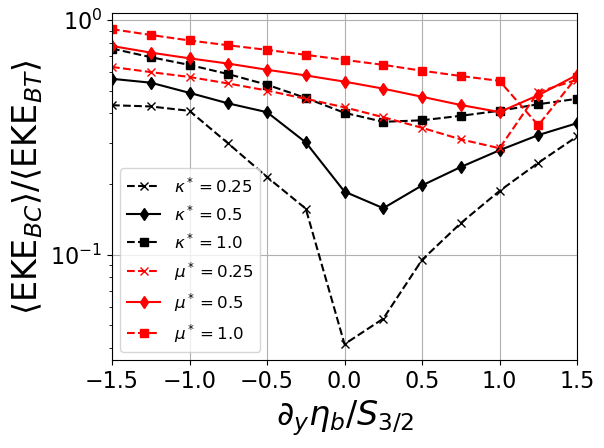

In [12]:
fig, ax1 = plt.subplots(1,1, figsize=(6,4.5))

lsize = 24
tsize = 16

x = h0s ./ S32

############################################################################
ax1.plot(x, BCEKE_nu0_kap0p25 ./ BTEKE_nu0_kap0p25, color="k", marker="x", linestyle="--", label=L"\kappa^* = 0.25")
ax1.plot(x, BCEKE_nu0_kap0p5 ./ BTEKE_nu0_kap0p5, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, BCEKE_nu0_kap1 ./ BTEKE_nu0_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")

ax1.plot(x, BCEKE_nu0_mu0p25 ./ BTEKE_nu0_mu0p25, color="r", marker="x", linestyle="--", label=L"\mu^* = 0.25")
ax1.plot(x, BCEKE_nu0_mu0p5 ./ BTEKE_nu0_mu0p5, color="r", marker="d", linestyle="-", label=L"\mu^* = 0.5")
ax1.plot(x, BCEKE_nu0_mu1 ./ BTEKE_nu0_mu1, color="r", marker="s", linestyle="--", label=L"\mu^* = 1.0")


# ax1.plot(x, BCEKE_nu0_mu1 ./ BTEKE_nu0_mu1, color="r", marker="x", linestyle="--", label=L"\mu^* = 1.0")

ax1.set_ylabel(L" \langle \mathrm{EKE}_{BC} \rangle / \langle \mathrm{EKE}_{BT} \rangle ", fontsize=lsize)

ax1.set_xlim(x[1], x[end])
# ax1.set_ylim(ax1.get_ylim()[1], 1.3)

# ax1.set_xticklabels([])
ax1.set_yscale("log")

ax1.tick_params(labelsize=tsize, which="both")

ax1.legend(fontsize=12)

ax1.grid()



############################################################################
# ax2.plot(x, BTEKE_nu0_kap0p25, color="k", marker="x", linestyle="--", label=L"\kappa^* = 0.25")
# ax2.plot(x, BTEKE_nu0_kap0p5, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
# ax2.plot(x, BTEKE_nu0_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")

# ax2.plot(x, BTEKE_nu0_mu0p25, color="r", marker="x", linestyle="--", label=L"\mu^* = 0.25")
# ax2.plot(x, BTEKE_nu0_mu0p5, color="r", marker="d", linestyle="-", label=L"\mu^* = 0.5")
# ax2.plot(x, BTEKE_nu0_mu1, color="r", marker="s", linestyle="--", label=L"\mu^* = 1.0")

# ax2.set_ylabel(L"\langle \mathrm{EKE}_{BT} \rangle \ \ [ \mathrm{m}^2 \mathrm{s}^{-2} ]", fontsize=lsize)
# # ax2.set_xticklabels([])


# ax2.set_xlim(x[1], x[end])
# ax2.set_ylim(5e-5, 2e-1)

# ax2.set_yscale("log")

# ax2.tick_params(labelsize=tsize, which="both")
# ax2.grid()

############################################################################
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)



############################################################################

# ax1.text(0.05, 0.95, L"\mathbf{(a)}", fontsize=lsize, horizontalalignment="center",verticalalignment="center", transform = ax1.transAxes);
# ax2.text(0.05, 0.95, L"\mathbf{(b)}", fontsize=lsize, horizontalalignment="center",verticalalignment="center", transform = ax2.transAxes);

# savefig("./drag_figs/LvQ_modal_nrgs.pdf",bbox_inches="tight")

savefig("./pres_drag_figs/EKE_BC_over_BT_w_QD.pdf",bbox_inches="tight")



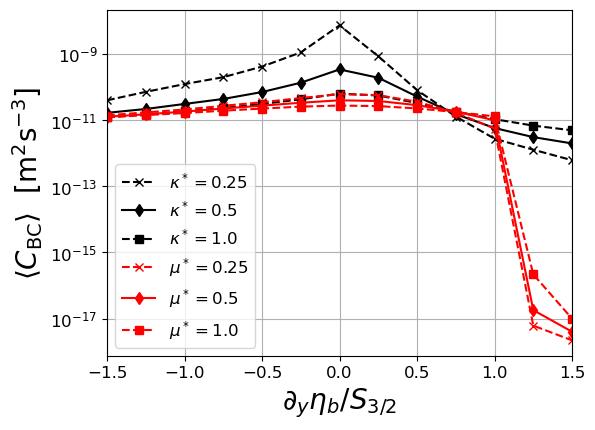

In [17]:
fig, ax1 = plt.subplots(1,1, figsize=(6,4.5))


lsize = 20
tsize = 12

x = h0s ./ S32



############################################################################
ax1.plot(x, 2 * BC_nu0_kap0p25, color="k", marker="x", linestyle="--", label=L"\kappa^* = 0.25")
ax1.plot(x, 2 * BC_nu0_kap0p5, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, 2 * BC_nu0_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")

ax1.plot(x, 2 * BC_nu0_mu0p25, color="r", marker="x", linestyle="--", label=L"\mu^* = 0.25")
ax1.plot(x, 2 * BC_nu0_mu0p5, color="r", marker="d", linestyle="-", label=L"\mu^* = 0.5")
ax1.plot(x, 2 * BC_nu0_mu1, color="r", marker="s", linestyle="--", label=L"\mu^* = 1.0")



# ax2.plot(x, TT_nu0_kap2 ./ BC_nu0_kap2, color="k", marker="o", linestyle="--", label=L"\kappa^* = 2.0")
# ax2.plot(x, TT_nu0_kap1 ./ BC_nu0_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax2.plot(x, TT_nu0_kap0p5 ./ BC_nu0_kap0p5, color="k", marker="d", linestyle="--", label=L"\kappa^* = 0.5")


ax1.set_ylabel(L"\langle C_\mathrm{BC} \rangle \ \ [ \mathrm{m}^2 \mathrm{s}^{-3} ]", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax1.legend(fontsize=tsize)
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax1.grid()

ax1.tick_params(labelsize=tsize, which="both")


ax1.set_yscale("log")

ax1.set_xlim(x[1], x[end])

savefig("./pres_drag_figs/C_BC_w_QD.pdf",bbox_inches="tight")



In [6]:
using Statistics

function modal_lengths(vars, params, grid, sol, ψ)

    nlayers = 2
    δ = params.H[1]/params.H[2]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at the interface
    μ = params.μ
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])

    vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    vars.ψh[:,:,2] = rfft(ψ[:,:,2])

    ψBC = 0.5 * (ψ[:,:,1] .- ψ[:,:,2])
    ψBT = 0.5 * (ψ[:,:,1] .+ ψ[:,:,2])

    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)

    ∂xψBC = irfft(im * grid.kr .* ψBCh, grid.ny)
    ∂xψBT = irfft(im * grid.kr .* ψBTh, grid.ny)

    ∂yψBC = irfft(im * grid.l .* ψBCh, grid.ny)
    ∂yψBT = irfft(im * grid.l .* ψBTh, grid.ny)
    
    # Linear modal transfer terms
    L_BC = sqrt(mean(∂xψBC.^2 .+ ∂yψBC.^2) / mean(ψBC.^2))  # BC
    L_BT = sqrt(mean(∂xψBT.^2 .+ ∂yψBT.^2) / mean(ψBT.^2))  # BC
    
    return L_BC, L_BT

end

modal_lengths(prob, ψ) = modal_lengths(prob.vars, prob.params, prob.grid, prob.sol, ψ)


modal_lengths (generic function with 2 methods)

In [12]:
using Statistics

function layer_lengths(vars, params, grid, sol, ψ)

    nlayers = 2
    δ = params.H[1]/params.H[2]
    g′ = params.g * (params.ρ[2] -   params.ρ[1]) / 1025. # reduced gravity at the interface
    μ = params.μ
    Ld1 = (params.f₀^2 / (g′ * params.H[1]))^-0.5
    ∂yηb = params.topographic_pv_gradient[2] / (params.f₀ / params.H[end])

    # vars.ψh[:,:,1] = rfft(ψ[:,:,1])
    # vars.ψh[:,:,2] = rfft(ψ[:,:,2])

    
    ψBC = ψ[:,:,1]
    ψBT = ψ[:,:,2]
    
    ψBCh = rfft(ψBC)
    ψBTh = rfft(ψBT)

    ∂xψBC = irfft(im * grid.kr .* ψBCh, grid.ny)
    ∂xψBT = irfft(im * grid.kr .* ψBTh, grid.ny)

    ∂yψBC = irfft(im * grid.l .* ψBCh, grid.ny)
    ∂yψBT = irfft(im * grid.l .* ψBTh, grid.ny)
    
    # Linear modal transfer terms
    L_BC = sqrt(mean(∂xψBC.^2 .+ ∂yψBC.^2) / mean(ψBC.^2))  # BC
    L_BT = sqrt(mean(∂xψBT.^2 .+ ∂yψBT.^2) / mean(ψBT.^2))  # BC
    
    return L_BC, L_BT

end

layer_lengths(prob, ψ) = layer_lengths(prob.vars, prob.params, prob.grid, prob.sol, ψ)


layer_lengths (generic function with 2 methods)

In [14]:
filt_order = 4
innerK= 2/3


function mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool, L, Nx, decomp)

    LS_out = zeros(length(h0s),2)

    if drag_bool==false
        mm = μstar * (U[1] / 2) / Ld
    else
        mm = μstar / Ld
    end
    
    for k in range(1,length(h0s))
        
        topographic_pv_gradient = (0, (f₀/H[end]) * h0s[k])
            
        prob = MultiLayerQG.Problem(nlayers, dev; nx=Nx, Lx=L, f₀, H, g, ρ, U, topographic_pv_gradient,
        μ=mm, β, dt, stepper, aliased_fraction=1/3,drag_bool, filt_order, innerK)

        sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

        GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool,L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        if μstar < 1.55
            N_yr = 90 # round(Int, (length(files)-2)/2)
        else
            N_yr = 90 #length(files)
        end

        
        # yrs = collect(range(1,N_yr))
            
        ## pre-allocate
        window = Int(round(250 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times
        nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output
        
        LS0 = zeros(nmax,2)

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)
            
            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in range(1,s)
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]

                if decomp=="modes"
                    L_BC, L_BT = modal_lengths(prob,ψ)
                elseif decomp=="layers"
                    L_BC, L_BT = layer_lengths(prob,ψ)
                else
                    println(L"Must specify decomposition as modal or layer-wise")
                end

                LS0[n,:] = [L_BC, L_BT]'           
                    
                n+=1
            end

            GC.gc()

        end

        LS_out[k,:] = mean(LS0[1:n-1,:],dims=1)

        GC.gc()

    end
    
    return LS_out
end


mode_lengths (generic function with 1 method)

In [15]:

μstar = 0.125   # 1.0 # 

LS_nu0_kap0p125 = mode_lengths(U,ρ,H,h0s[7:end],μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90


In [14]:

μstar = 0.25   # 1.0 # 

LS_nu0_kap0p25 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90
90
90
90
90
90
90


In [13]:

μstar = 0.5   # 1.0 # 

LS_nu0_kap0p5 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90
90
90
90
90
90
90


In [10]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

LS_nu0_kap1 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);



90
90
90
90
90
90
90
90
90
90
90
90
90


In [11]:

μstar = 2.0   # 1.0 # 

LS_nu0_kap2 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);



90
90
90
90
90
90
90
90
90
90
90
90
90


In [12]:

μstar = 4.0   # 1.0 # 

LS_nu0_kap4 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx);


90
90
90
90
90
90
90
90
90
90
90
90
90


In [24]:
using FileIO, JLD2

fn = data_dir*"LS_kappas.jld"

# jld_data = Dict("LS_nu0_kap0p125" => LS_nu0_kap0p125,
#     "LS_nu0_kap0p25" => LS_nu0_kap0p25,
#     "LS_nu0_kap0p5" => LS_nu0_kap0p5,
#     "LS_nu0_kap1" => LS_nu0_kap1,
#     "LS_nu0_kap2" => LS_nu0_kap2,
#     "LS_nu0_kap4" => LS_nu0_kap4)


# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


In [19]:
# using FileIO, JLD2

# fn = data_dir*"LS_kappas_no0p125_no0p25.jld"

# jld_data = Dict("LS_nu0_kap0p5" => LS_nu0_kap0p5,
#     "LS_nu0_kap1" => LS_nu0_kap1,
#     "LS_nu0_kap2" => LS_nu0_kap2,
#     "LS_nu0_kap4" => LS_nu0_kap4)


# jldsave(fn; jld_data)

In [13]:
μstar = 0.125   # 1.0 # 

LS_layered_nu0_kap0p125 = mode_lengths(U,ρ,H,h0s[7:end],μstar, νstar, drag_bool,L, Nx, "layers");


LoadError: UndefVarError: `mode_lengths` not defined

In [14]:
μstar = 0.25   # 1.0 # 

LS_layered_nu0_kap0p25 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx, "layers");


LoadError: UndefVarError: `mode_lengths` not defined

In [15]:
μstar = 0.5   # 1.0 # 

LS_layered_nu0_kap0p5 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx, "layers");


LoadError: UndefVarError: `mode_lengths` not defined

In [15]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

LS_layered_nu0_kap1 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx, "layers");


In [19]:
μstar = 2.0   # 1.0 # 

LS_layered_nu0_kap2 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx, "layers");


In [20]:
μstar = 4.0   # 1.0 # 

LS_layered_nu0_kap4 = mode_lengths(U,ρ,H,h0s,μstar, νstar, drag_bool,L, Nx, "layers");


In [19]:
using FileIO, JLD2

fn = data_dir*"LS_layered_kappas.jld"

# jld_data = Dict("LS_layered_nu0_kap0p125" => LS_layered_nu0_kap0p125,
#     "LS_layered_nu0_kap0p25" => LS_layered_nu0_kap0p25,
#     "LS_layered_nu0_kap0p5" => LS_layered_nu0_kap0p5,
#     "LS_layered_nu0_kap1" => LS_layered_nu0_kap1,
#     "LS_layered_nu0_kap2" => LS_layered_nu0_kap2,
#     "LS_layered_nu0_kap4" => LS_layered_nu0_kap4)


# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


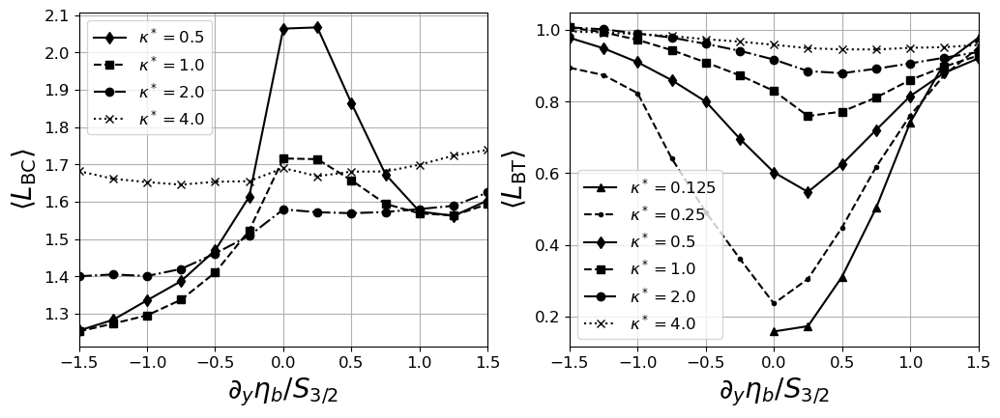

(-1.5, 1.5)

In [24]:
fig, ax = plt.subplots(1,2, figsize=(12,4.5))
ax1=ax[1]; ax2=ax[2];

lsize = 20
tsize = 12

x = h0s ./ S32
x2 = x[7:end]

############################################################################

############################################################################
# ax1.plot(x2, (LS_nu0_kap0p125[:,1] * Ld).^-1, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax1.plot(x, (LS_nu0_kap0p25[:,1] * Ld).^-1, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax1.plot(x, (LS_nu0_kap0p5[:,1] * Ld).^-1, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, (LS_nu0_kap1[:,1] * Ld).^-1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, (LS_nu0_kap2[:,1] * Ld).^-1, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax1.plot(x, (LS_nu0_kap4[:,1] * Ld).^-1, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax1.set_ylabel(L"\langle L_\mathrm{BC} \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax1.legend(fontsize=tsize)
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax1.grid()

ax1.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax1.set_xlim(x[1], x[end])



############################################################################

############################################################################

# # ax2.plot(x2, (LS_nu0_kap0p125[:,2] * Ld).^-1, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# # ax2.plot(x, (LS_nu0_kap0p25[:,2] * Ld).^-1, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
# ax2.plot(x, (LS_nu0_kap0p5[:,2] * Ld).^-1, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
# ax2.plot(x, (LS_nu0_kap1[:,2] * Ld).^-1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax2.plot(x, (LS_nu0_kap2[:,2] * Ld).^-1, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
# ax2.plot(x, (LS_nu0_kap4[:,2] * Ld).^-1, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax2.plot(x2, LS_nu0_kap0p125[:,2] ./ LS_nu0_kap0p125[:,1], color="k", marker="^", linestyle="-", label=L"\kappa^* = 0.125")
ax2.plot(x, LS_nu0_kap0p25[:,2] ./ LS_nu0_kap0p25[:,1], color="k", marker=".", linestyle="--", label=L"\kappa^* = 0.25")
ax2.plot(x, LS_nu0_kap0p5[:,2] ./ LS_nu0_kap0p5[:,1], color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax2.plot(x, LS_nu0_kap1[:,2] ./ LS_nu0_kap1[:,1], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax2.plot(x, LS_nu0_kap2[:,2] ./ LS_nu0_kap2[:,1], color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax2.plot(x, LS_nu0_kap4[:,2] ./ LS_nu0_kap4[:,1], color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax2.set_ylabel(L"\langle L_\mathrm{BT} \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax2.legend(fontsize=tsize)
ax2.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax2.grid()

ax2.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax2.set_xlim(x[1], x[end])





############################################################################

############################################################################

# savefig("./pres_drag_figs/modal_length_scales.pdf",bbox_inches="tight")



28325.036156089973

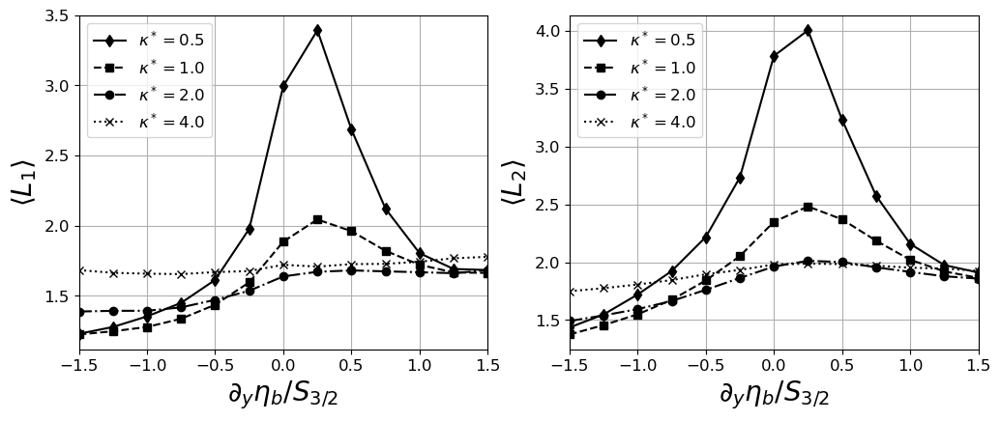

(-1.5, 1.5)

In [27]:
fig, ax = plt.subplots(1,2, figsize=(12,4.5))
ax1=ax[1]; ax2=ax[2];

lsize = 20
tsize = 12

x = h0s ./ S32
x2 = x[7:end]

############################################################################

############################################################################
# ax1.plot(x2, (LS_layered_nu0_kap0p125[:,1] * Ld).^-1, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax1.plot(x, (LS_layered_nu0_kap0p25[:,1] * Ld).^-1, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax1.plot(x, (LS_layered_nu0_kap0p5[:,1] * Ld).^-1, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, (LS_layered_nu0_kap1[:,1] * Ld).^-1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, (LS_layered_nu0_kap2[:,1] * Ld).^-1, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax1.plot(x, (LS_layered_nu0_kap4[:,1] * Ld).^-1, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax1.set_ylabel(L"\langle L_\mathrm{1} \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax1.legend(fontsize=tsize)
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax1.grid()

ax1.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax1.set_xlim(x[1], x[end])



############################################################################

############################################################################

# ax2.plot(x2, (LS_layered_nu0_kap0p125[:,2] * Ld).^-1, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax2.plot(x, (LS_layered_nu0_kap0p25[:,2] * Ld).^-1, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax2.plot(x, (LS_layered_nu0_kap0p5[:,2] * Ld).^-1, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax2.plot(x, (LS_layered_nu0_kap1[:,2] * Ld).^-1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax2.plot(x, (LS_layered_nu0_kap2[:,2] * Ld).^-1, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax2.plot(x, (LS_layered_nu0_kap4[:,2] * Ld).^-1, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax2.set_ylabel(L"\langle L_\mathrm{2} \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax2.legend(fontsize=tsize)
ax2.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax2.grid()

ax2.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax2.set_xlim(x[1], x[end])





############################################################################

############################################################################

# savefig("./pres_drag_figs/layered_length_scales.pdf",bbox_inches="tight")



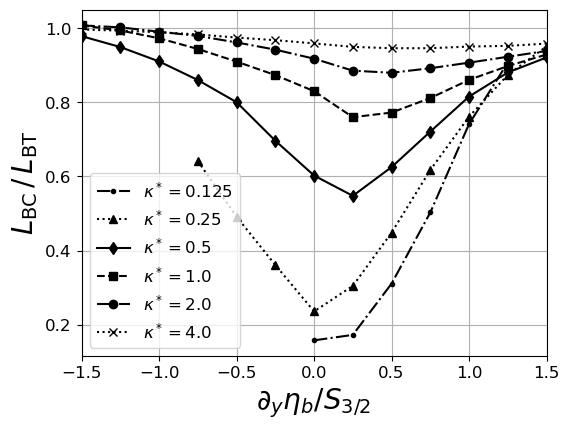

In [21]:
fig, ax2 = plt.subplots(1,1, figsize=(6,4.5))

lsize = 20
tsize = 12

x = h0s ./ S32
x2 = x[7:end-1]

############################################################################

############################################################################

ax2.plot(x2, LS_nu0_kap0p125[1:end-1,2] ./ LS_nu0_kap0p125[1:end-1,1], color="k", marker=".", linestyle="-.", label=L"\kappa^* = 0.125")
ax2.plot(x[4:end], LS_nu0_kap0p25[4:end,2] ./ LS_nu0_kap0p25[4:end,1], color="k", marker="^", linestyle="dotted", label=L"\kappa^* = 0.25")
ax2.plot(x, LS_nu0_kap0p5[:,2] ./ LS_nu0_kap0p5[:,1], color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax2.plot(x, LS_nu0_kap1[:,2] ./ LS_nu0_kap1[:,1], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax2.plot(x, LS_nu0_kap2[:,2] ./ LS_nu0_kap2[:,1], color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax2.plot(x, LS_nu0_kap4[:,2] ./ LS_nu0_kap4[:,1], color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax2.set_ylabel(L"L_\mathrm{BC}  \, / \, L_\mathrm{BT} ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax2.legend(fontsize=tsize)
ax2.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax2.grid()

ax2.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax2.set_xlim(x[1], x[end])





############################################################################

############################################################################

# savefig("./pres_drag_figs/modal_length_scales.pdf",bbox_inches="tight")



savefig("./drag_figs/BC_BT_scale_ratio.pdf",bbox_inches="tight")


# defining length scales as wavenumber centroid

In [6]:
using Statistics

function isotropic_mean(arr_in, grid)
    # arr_in: an nkr X nl array that is output of rfft
    # note that we only want real part of this
    
    dk = 2*pi/grid.Lx; dl = 2*pi/grid.Ly;
    
    dkr = sqrt(dk^2 + dl^2)
    
    wv = @. sqrt(grid.kr^2 + grid.l^2)
    
    iso = zeros(length(grid.kr))
    
    for i in range(1,length(grid.kr))
        # find 2D index values for a wavenumber magnitude
        if i==length(grid.kr)
            fkr = @. (wv>=grid.kr[i]) & (wv<=grid.kr[i]+dkr)
        else
            fkr = @. (wv>=grid.kr[i]) & (wv<grid.kr[i+1])
        end
        
        if sum(fkr) > 0
            iso[i] = mean(real(arr_in[fkr])) # this is average over all combinations of k_x and k_y that are the same, isotropic k
        end
        
    end

    return iso
end

isotropic_mean (generic function with 1 method)

In [7]:
function m1_spec(u, v, grid)
    
    uk = abs.(fft(u .- mean(u))) .* (2/grid.nx)
    vk = abs.(fft(v .- mean(v))) .* (2/grid.nx)
    
    dk = 2*pi/grid.Lx; dl = 2*pi/grid.Ly;
    
    dkr = sqrt(dk^2 + dl^2)
    
    wv = @. sqrt(grid.k^2 + grid.l^2)
    
    num = zeros(length(grid.k)); den = zeros(length(grid.k));
    
    for i in range(1,length(grid.k))
        # find 2D index values for a wavenumber magnitude
        if i==length(grid.k)
            fkr = @. (wv>=grid.k[i]) & (wv<=grid.k[i]+dkr)
        else
            fkr = @. (wv>=grid.k[i]) & (wv<grid.k[i+1])
        end
        
        if sum(fkr) > 0
            # this is mean Fourier amplitude of KE
#             if KE_b
#                 KEh = wv[i]^2 .* u
#                 den[i] = sum(KEh[fkr])/sum(fkr)
#             else
                den[i] = sum(uk[fkr].^2 .+ vk[fkr].^2) / sum(fkr) # this is avg. Fourier magnitude at given wavenumber magnitude
#             end
            
#             den[i] = maximum(uk[fkr].^2 .+ vk[fkr].^2)
            
#             ke = abs.(fft(u.^2 .+ v.^2))
#             den[i] = sum(ke[fkr])
        end
        
        num[i] = wv[i] * den[i]
        
    end
    
    m1_k = sum(num) / sum(den)
    
    return m1_k^-1 / 1000 * 2 * pi
    
end

m1_spec (generic function with 1 method)

In [8]:

function m1_yrs(U,ρ,H,μstar,h0s)
    if drag_bool==false
        mm = μstar * (U[1] / 2) / Ld
    else
        mm = μstar / Ld
    end
    
    L_upper = zeros(length(h0s))
    L_lower = zeros(length(h0s))

    L_BT = zeros(length(h0s))
    L_BC = zeros(length(h0s))
    
    prob = MultiLayerQG.Problem(nlayers, dev; nx=n, Lx=L, f₀, H, g, ρ, U, nν, ν, eta, topographic_pv_gradient,
    μ=mm, β, dt, stepper, aliased_fraction=1/3);

    sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

    for k in range(1,length(h0s))
        println(k)

        GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        N_yr = length(files)-2
        yrs = collect(range(1,N_yr))
            
        ## pre-allocate
        window = Int(round(250 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times
        # nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output

        Lu = 0.
        Ll = 0.
        LBT = 0.
        LBC = 0.

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)
                    
            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in [1, Int(ceil(s/2))]
                
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]
                        
                # ψh = fft(ψ)
                
                u = -irfft(im * grid.l .* rfft(ψ), grid.nx)
                v = irfft(im * grid.kr .* rfft(ψ), grid.nx)
                
                Lu+= m1_spec(u[:,:,1], v[:,:,1], grid) 

                Ll+= m1_spec(u[:,:,2], v[:,:,2], grid)   

                LBT+= m1_spec(0.5 * (u[:,:,1] .+ u[:,:,2]), 0.5 * (v[:,:,1] .+ v[:,:,2]), grid) 

                LBC+= m1_spec(0.5 * (u[:,:,1] .- u[:,:,2]), 0.5 * (v[:,:,1] .- v[:,:,2]), grid)  
                
                n+=1

            end
            
            GC.gc()
            
        end
        
        L_upper[k] = Lu/(n-1)
        L_lower[k] = Ll/(n-1)

        L_BT[k] = LBT/(n-1)
        L_BC[k] = LBC/(n-1)
        
    end
    
    return L_upper, L_lower, L_BT, L_BC
end



m1_yrs (generic function with 1 method)

In [20]:
μstar = 0.125   # 1.0 # 

L1_kap0p125, L2_kap0p125, LBT_kap0p125, LBC_kap0p125 = m1_yrs(U,ρ,H,μstar,h0s[7:end]);


In [21]:
μstar = 0.25   # 1.0 # 

L1_kap0p25, L2_kap0p25, LBT_kap0p25, LBC_kap0p25 = m1_yrs(U,ρ,H,μstar,h0s);


In [10]:
μstar = 0.5   # 1.0 # 

L1_kap0p5, L2_kap0p5, LBT_kap0p5, LBC_kap0p5 = m1_yrs(U,ρ,H,μstar,h0s);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [11]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

# L1_kap1, L2_kap1, LBT_kap1, LBC_kap1 = m1_yrs(U,ρ,H,μstar,h0s);


4.449286275031877e6

In [16]:
μstar = 2.0   # 1.0 # 

L1_kap2, L2_kap2, LBT_kap2, LBC_kap2 = m1_yrs(U,ρ,H,μstar,h0s);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [12]:
μstar = 4.0   # 1.0 # 

L1_kap4, L2_kap4, LBT_kap4, LBC_kap4 = m1_yrs(U,ρ,H,μstar,h0s);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [8]:
# using FileIO, JLD2

# fn = data_dir*"length_scales_centroid_modes_and_layers_kappas_even_more.jld"


# a = load(fn);

# for (k,v) in a["jld_data"]
#     @eval $(Symbol(k)) = $(v)
# end


In [26]:
using FileIO, JLD2

fn = data_dir*"length_scales_centroid_modes_and_layers_kappas.jld"

# jld_data = Dict("L1_kap0p125" => L1_kap0p125, "L2_kap0p125" => L2_kap0p125,
#     "LBT_kap0p125" => LBT_kap0p125, "LBC_kap0p125" => LBC_kap0p125,
#     "L1_kap0p25" => L1_kap0p25, "L2_kap0p25" => L2_kap0p25,
#     "LBT_kap0p25" => LBT_kap0p25, "LBC_kap0p25" => LBC_kap0p25,
#     "L1_kap0p5" => L1_kap0p5, "L2_kap0p5" => L2_kap0p5,
#     "LBT_kap0p5" => LBT_kap0p5, "LBC_kap0p5" => LBC_kap0p5,
#     "L1_kap1" => L1_kap1, "L2_kap1" => L2_kap1,
#     "LBT_kap1" => LBT_kap1, "LBC_kap1" => LBC_kap1,
#     "L1_kap2" => L1_kap2, "L2_kap2" => L2_kap2,
#     "LBT_kap2" => LBT_kap2, "LBC_kap2" => LBC_kap2,
#     "L1_kap4" => L1_kap4, "L2_kap4" => L2_kap4,
#     "LBT_kap4" => LBT_kap4, "LBC_kap4" => LBC_kap4)


# jldsave(fn; jld_data)

a = load(fn);

for (k,v) in a["jld_data"]
    @eval $(Symbol(k)) = $(v)
end


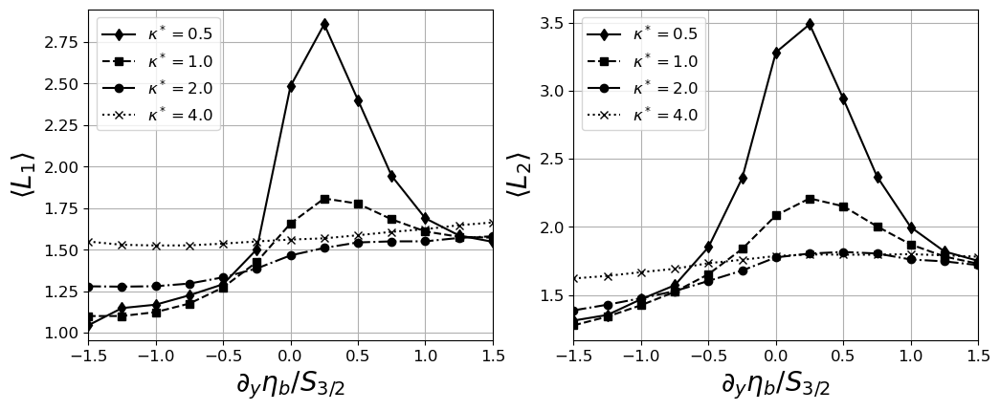

(-1.5, 1.5)

In [10]:
fig, ax = plt.subplots(1,2, figsize=(12,4.5))
ax1=ax[1]; ax2=ax[2];

lsize = 20
tsize = 12

x = h0s ./ S32
x2 = x[7:end]

norm = (Ld/1000 * 2 * pi)

############################################################################

############################################################################
# ax1.plot(x2, L1_kap0p125 ./ norm, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax1.plot(x, L1_kap0p25 ./ norm, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax1.plot(x, L1_kap0p5 ./ norm, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, L1_kap1 ./ norm, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, L1_kap2 ./ norm, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax1.plot(x, L1_kap4 ./ norm, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax1.set_ylabel(L"\langle L_\mathrm{1} \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax1.legend(fontsize=tsize)
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax1.grid()

ax1.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax1.set_xlim(x[1], x[end])



############################################################################

############################################################################

# ax2.plot(x2, L2_kap0p125 ./ norm, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax2.plot(x, L2_kap0p25 ./ norm, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax2.plot(x, L2_kap0p5 ./ norm, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax2.plot(x, L2_kap1 ./ norm, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax2.plot(x, L2_kap2 ./ norm, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax2.plot(x, L2_kap4 ./ norm, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax2.set_ylabel(L"\langle L_\mathrm{2} \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax2.legend(fontsize=tsize)
ax2.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax2.grid()

ax2.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax2.set_xlim(x[1], x[end])





############################################################################

############################################################################

# savefig("./drag_figs/layerwise_length_scales.pdf",bbox_inches="tight")



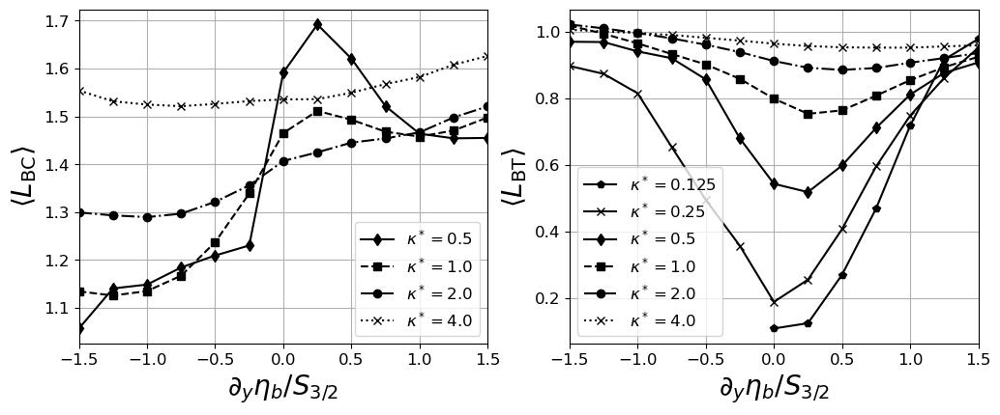

(-1.5, 1.5)

In [28]:
fig, ax = plt.subplots(1,2, figsize=(12,4.5))
ax1=ax[1]; ax2=ax[2];

lsize = 20
tsize = 12

x = h0s ./ S32
x2 = x[7:end]

norm = (Ld/1000 * 2 * pi)

############################################################################

############################################################################
# ax1.plot(x2, LBC_kap0p125 ./ norm, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax1.plot(x, LBC_kap0p25 ./ norm, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax1.plot(x, LBC_kap0p5 ./ norm, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, LBC_kap1 ./ norm, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, LBC_kap2 ./ norm, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax1.plot(x, LBC_kap4 ./ norm, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax1.set_ylabel(L"\langle L_\mathrm{BC} \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax1.legend(fontsize=tsize)
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax1.grid()

ax1.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax1.set_xlim(x[1], x[end])



############################################################################

############################################################################

# # ax2.plot(x2, LBT_kap0p125 ./ norm, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# # ax2.plot(x, LBT_kap0p25 ./ norm, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
# ax2.plot(x, LBT_kap0p5 ./ norm, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
# ax2.plot(x, LBT_kap1 ./ norm, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax2.plot(x, LBT_kap2 ./ norm, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
# ax2.plot(x, LBT_kap4 ./ norm, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")


# ax2.plot(x2, LBT_kap0p125 ./ LBC_kap0p125, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax2.plot(x, LBT_kap0p25 ./ LBC_kap0p25, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
# ax2.plot(x, LBT_kap0p5 ./ LBC_kap0p5, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
# ax2.plot(x, LBT_kap1 ./ LBC_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax2.plot(x, LBT_kap2 ./ LBC_kap2, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
# ax2.plot(x, LBT_kap4 ./ LBC_kap4, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

ax2.plot(x2, LBC_kap0p125 ./ LBT_kap0p125, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
ax2.plot(x, LBC_kap0p25 ./ LBT_kap0p25, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax2.plot(x, LBC_kap0p5 ./ LBT_kap0p5, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax2.plot(x, LBC_kap1 ./ LBT_kap1, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax2.plot(x, LBC_kap2 ./ LBT_kap2, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax2.plot(x, LBC_kap4 ./ LBT_kap4, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")


ax2.set_ylabel(L"\langle L_\mathrm{BT} \rangle ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax2.legend(fontsize=tsize)
ax2.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax2.grid()

ax2.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")

ax2.set_xlim(x[1], x[end])





############################################################################

############################################################################

# savefig("./drag_figs/modal_length_scales.pdf",bbox_inches="tight")



In [8]:

function mixing_length(U,ρ,H,μstar,h0s)
    if drag_bool==false
        mm = μstar * (U[1] / 2) / Ld
    else
        mm = μstar / Ld
    end
    
    L_mix = zeros(length(h0s))
    
    prob = MultiLayerQG.Problem(nlayers, dev; nx=n, Lx=L, f₀, H, g, ρ, U, nν, ν, eta, topographic_pv_gradient,
    μ=mm, β, dt, stepper, aliased_fraction=1/3);

    sol, clock, params, vars, grid = prob.sol, prob.clock, prob.params, prob.vars, prob.grid;

    for k in range(1,length(h0s))

        GC.gc()

        file1 = jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,1)
        files = glob(file1[34:end-5]*"*", data_dir)

        N_yr = length(files)-2
        yrs = collect(range(1,N_yr))
            
        ## pre-allocate
        window = Int(round(20 * (Ld / (U[1]/2)) / 3600 / 24 / 365.25))   # analyze last 250 eddy-turnover times
        # nmax = window*13  # assume 13 outputs per year, i.e., more than possible with monthly output

        Lmix = 0.

        n=1
        ##

        for i in range(N_yr-window+1,N_yr)
                    
            a = load(jld_name2(data_dir,μstar, νstar, drag_bool, L, h0s[k],ρ,U,Nx,H,i))

            s = size(a["jld_data"]["psi_ot"])

            if length(s)>3
                s=s[4]
            else
                s=1
            end

            for j in [1, Int(ceil(s/2))]
                
                ψ = a["jld_data"]["psi_ot"][:,:,:,j]
                        
                # ψh = fft(ψ)
                
                
                Lmix += sqrt(mean((ψ[:,:,1] .- ψ[:,:,2]).^2)) / 0.01
                
                n+=1

            end
            
            GC.gc()
            
        end
        
        L_mix[k] = Lmix/(n-1)
        
    end
    
    return L_mix
end



mixing_length (generic function with 1 method)

In [11]:
μstar = 0.125

L_mix_kap0p125 = mixing_length(U,ρ,H,μstar,h0s[7:end]);


In [10]:
μstar = 0.25   # 1.0 # 

L_mix_kap0p25 = mixing_length(U,ρ,H,μstar,h0s);


In [9]:
μstar = 0.5   # 1.0 # 

L_mix_kap0p5 = mixing_length(U,ρ,H,μstar,h0s);


In [7]:
νstar = 0.
μstar = 1.0   # 1.0 # 
drag_bool = false

Nx=1024

L=Lx=25*2*pi*Ld

L_mix_kap1 = mixing_length(U,ρ,H,μstar,h0s);


1
2
3
4
5
6
7
8
9
10
11
12
13


In [12]:
μstar = 2.0   # 1.0 # 

L_mix_kap2 = mixing_length(U,ρ,H,μstar,h0s);


In [13]:
μstar = 4.0   # 1.0 # 

L_mix_kap4 = mixing_length(U,ρ,H,μstar,h0s);


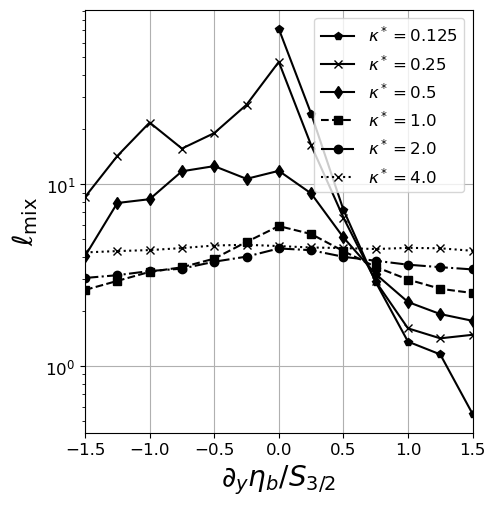

(-1.5, 1.5)

In [35]:
fig, ax1 = plt.subplots(1,1, figsize=(5,5.5))

lsize = 20
tsize = 12

x = h0s ./ S32
x2 = x[7:end]

norm = Ld


############################################################################
kstar = [0.125, 0.25, 0.5, 1., 2., 4.]


c1=4.0
c2=0.36

norm = Ld
# norm = @. Ld * (exp(-c2/kstar) /c1)^-1

# x  = @. x' * c1 * exp(c2 / kstar) / (log(c1 * exp(c2 / kstar))^1.5)


############################################################################
# ax1.plot(x[1,7:end], L_mix_kap0p125 ./ norm[1], color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax1.plot(x[2,:], L_mix_kap0p25 ./ norm[2], color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
# ax1.plot(x[3,:], L_mix_kap0p5 ./ norm[3], color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
# ax1.plot(x[4,:], L_mix_kap1 ./ norm[4], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax1.plot(x[5,:], L_mix_kap2 ./ norm[5], color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
# ax1.plot(x[6,:], L_mix_kap4 ./ norm[6], color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")


ax1.plot(x2, L_mix_kap0p125 ./ norm, color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
ax1.plot(x, L_mix_kap0p25 ./ norm, color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax1.plot(x, L_mix_kap0p5 ./ norm, color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, L_mix_kap1 ./ norm, color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, L_mix_kap2 ./ norm, color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax1.plot(x, L_mix_kap4 ./ norm, color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")

# ax1.plot(x2, L_mix_kap0p125 ./ L_mix_kap0p125[1], color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax1.plot(x, L_mix_kap0p25 ./ L_mix_kap0p25[7], color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
# ax1.plot(x, L_mix_kap0p5 ./ L_mix_kap0p5[7], color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
# ax1.plot(x, L_mix_kap1 ./ L_mix_kap1[7], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax1.plot(x, L_mix_kap2 ./ L_mix_kap2[7], color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
# ax1.plot(x, L_mix_kap4 ./ L_mix_kap4[7], color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")


ax1.set_ylabel(L"\ell_\mathrm{mix} ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax1.legend(fontsize=tsize)
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax1.grid()

ax1.tick_params(labelsize=tsize, which="both")

ax1.set_yscale("log")
# ax1.set_xscale("symlog")

ax1.set_xlim(x[1], x[end])



In [18]:
#
# plot for flat bottom alpha-gamma space

# load modules
# include("../LinStab/mjcl_stab.jl")
# using .LinStab

using PyPlot, LaTeXStrings, JLD2, FileIO, Statistics, Printf


# matplotlib[:rcParams]["axes.unicode_minus"]=false
# PyPlot.matplotlib[:rc]("hatch",linewidth=1.5)
# PyPlot.matplotlib[:rc]("hatch",color="red")

# PyPlot.matplotlib[:rc]("text", usetex=true) 
# PyPlot.matplotlib[:rc]("text.latex", preamble= "\\usepackage{amsmath,amsthm}")
# PyPlot.matplotlib[:rc]("figure", autolayout=false)

# pygui(true)

# physical params
Nx = Ny = 64
L = Lx = Ly = 1000.e3                   # domain size [m]
beta = β = 0 # 1e-11              # the y-gradient of planetary PV

nlayers = 2                 # number of layers
f0 = f₀= 8.3e-5            # Coriolis param [s^-1]
g = 9.81                    # gravity
H = [2000., 2000.]     # the rest depths of each layer;

Us = [0.01, 0.017634058790440166, 0.024]
rhos = 1025.75 .- [0.25,0.5775,0.85]

rho0 = 1025.        # Boussinesq reference density

# always zero for now, model can't even take this in as a parameter...
V = zeros(nlayers)

# Linear bottom drag
# μ0 = (86400*30)^-1

# running model

rho = ρ = [0., 1025.75]
rho[1] = ρ[1] = rhos[2]

U = [0.,0.]
U[1] = Us[1]

##################################################
gp = (g/rho0)*(ρ[2] - ρ[1])
Ldi2 = f0^2/gp/H[1]

Ld = sqrt(gp*sum(H))/2/f0

S32 = f0 * U[1] / gp

################################################
Lx = Ly = collect(range(0.25*Ld,4*Ld,100))

kx = ky = collect(range(Lx[end]^-1, Lx[1]^-1, 10000)) # Lx.^-1

h0s = collect(range(-1.5*S32,1.5*S32,13))

# h0s = [0,1]

h0 = 1.1 * S32

∂yQ1 = dyQ1 = (f0/H[1]) * S32
∂yQ2 = @. (f0/H[2]) * (h0s - S32)

# growth rate scales as U / sqrt{gr}, so if we triple u, we need to increase gr by 9x?

function find_bounds(kx,sigma_no_mu_imag,h0s)
    # finding border of inviscid region

    upper_bound = zeros(length(kx)) .* NaN
    lower_bound = zeros(length(kx)) .* NaN

    lb = zeros(length(kx))
    ub = zeros(length(kx))

    for i in range(1,length(kx))
        if i > 1 && i < length(kx)
            if sigma_no_mu_imag[i,1] != 0 && ((sigma_no_mu_imag[i-1,1] == 0 && sigma_no_mu_imag[i+1,1] == 0) || (sigma_no_mu_imag[i-1,1] != 0 && sigma_no_mu_imag[i+1,1] != 0))
                lower_bound[i] = NaN
                lb[i] = 1
            end
        end

        if sigma_no_mu_imag[i,end] != 0 
            upper_bound[i] = NaN
            ub[i] = 1
        end

        for j in range(1,length(h0s))
            if sigma_no_mu_imag[i,j] > 0. && lb[i] == 0
                lower_bound[i] = h0s[j] / S32
                lb[i] = 1
            end

            if sigma_no_mu_imag[i,length(h0s)-j+1] > 0. && ub[i] == 0
                upper_bound[i] = h0s[length(h0s)-j+1] / S32
                ub[i] = 1
            end

            # if i != length(kx)
            #     if lb[i]==1 && sigma_no_mu_imag[i+1,1] == 0 && ub[i] == 1
            #         upper_bound[i] = h0s[1]/S32
            #     end
            # end
        end


    end

    return hcat(lower_bound, upper_bound)
end


function growth_curve(f0,H,U,rho,kx,ky,h0s,μstar)

    k2 = @. kx^2 # + ky^2

    μ = μstar * (U[1]/2) / Ld

    sigma = zeros(length(kx), length(h0s))
    
    for (i, h0) in enumerate(h0s)
        dyQ2 = (f0/H[2]) * (h0 - S32)

        # a = @. k2 * (k2 + Ld^-2)
        # b = @. - U[1] * kx * k2 * (k2 + Ld^-2) + (k2 + 0.5 * Ld^-2) * (kx * (f0/H[2]) * h0 + 1im * μ * k2)
        # c = @. - U[1] * kx * k2 * (kx * dyQ2 + 1im * μ * k2) 

        # pr = @. imag(-b/2/a + sqrt(b^2 - 4*a*c)/2/a)
        # nr = @. imag(-b/2/a - sqrt(b^2 - 4*a*c)/2/a)

        a = @. k2 * (k2 + Ld^-2)
        b = @. - U[1] * k2 * (k2 + Ld^-2) + (k2 + 0.5 * Ld^-2) * ((f0/H[2]) * h0 + 1im * μ * sqrt(k2))
        c = @. - U[1] * k2 * ((f0/H[2]) * h0 - 0.5 * Ld^-2 *U[1] + 1im * μ * sqrt(k2)) 

        pr = @. sqrt(k2) * imag(-b/2/a + sqrt(b^2 - 4*a*c)/2/a)
        nr = @. sqrt(k2) * imag(-b/2/a - sqrt(b^2 - 4*a*c)/2/a)

        sigma[:,i] = maximum(hcat(pr,nr),dims=2) * 3600 * 24 * 7

        sigma[1,i] = 0.
    end

    return sigma
end



#############################################################
## Finding growth rate curves for different drag coefficients
# sigma0 = growth_curve(f0,H,U,rho,kx,ky,h0s_curve,0)
# bounds0 = find_bounds(kx,sigma0,h0s_curve)

# sigmahi = growth_curve(f0,H,U,rho,kx,ky,h0s_curve,1.0)
# sigmamid = growth_curve(f0,H,U,rho,kx,ky,h0s,(86400*95)^-1)
# sigmalo = growth_curve(f0,H,U,rho,kx,ky,h0s, 0.5)

#############################################################

#############################################################

# kappas = 2 .^collect(range(-10,2.0,250))
kappas = [0.125, 0.25, 0.5, 1.0, 2.0, 4.0]   # collect(range(0.001,4.0,250))


sigma_max = zeros(length(h0s), length(kappas))

kx_max = zeros(length(h0s), length(kappas))

global i=1

for kap in kappas
    global j=1
    for h0 in h0s
        sig_loc = growth_curve(f0,H,U,rho,kx,ky,[h0], kap)
        sigma_max[j,i] = maximum(sig_loc)

        k_ind = argmax(sig_loc)
        kx_max[j,i] = kx[k_ind] * Ld
        global j+=1
    end
    global i+=1
end


#############################################################

#############################################################
#############################################################
using PlotUtils

# cm = cgrad(:coolwarm);
# clrs = [cm[i] for i in range(0,1,100)]

# hc_range = collect(range(h0s[1],h0s[end],100))

# function h_color(h_in,hc_range,colors)
#     c_ind = argmin(abs.(h_in .- (hc_range)))

#     color_out = [red(clrs[c_ind]),green(clrs[c_ind]),blue(clrs[c_ind])]

#     if h_in==0
#         color_out = [0.,0.,0.]
#     end
#     return color_out
# end

############################################################

##########################################################################

x = @. kx * Ld # sqrt(kx^2 + ky^2) * Ld  # 



10000-element Vector{Float64}:
 0.25
 0.2503750375037504
 0.2507500750075008
 0.25112511251125114
 0.2515001500150015
 0.25187518751875193
 0.2522502250225023
 0.2526252625262526
 0.253000300030003
 0.2533753375337534
 0.25375037503750375
 0.25412541254125415
 0.2545004500450045
 ⋮
 3.995874587458746
 3.996249624962496
 3.9966246624662465
 3.996999699969997
 3.997374737473747
 3.997749774977498
 3.9981248124812483
 3.9984998499849986
 3.998874887488749
 3.9992499249924993
 3.9996249624962497
 4.0

In [35]:


L_BTs = hcat([hcat([zeros(6); LS_nu0_kap0p125[:,2]])'; LS_nu0_kap0p25[:,2]'; LS_nu0_kap0p5[:,2]';
        LS_nu0_kap1[:,2]'; LS_nu0_kap2[:,2]'; LS_nu0_kap4[:,2]'])'# L_BT

length_ratios = L_BTs .* kx_max .* Ld * 2 * pi





13×6 Matrix{Float64}:
 0.0       4.2256    5.35273   5.27135  3.99382  2.515
 0.0       3.68211   4.78736   4.80783  3.72236  2.43265
 0.0       3.1466    4.12455   4.31335  3.44627  2.32465
 0.0       2.27624   3.46576   3.73448  3.111    2.21098
 0.0       1.53935   2.7669    3.0928   2.72208  2.07604
 0.0       0.933628  1.94458   2.43848  2.34597  1.96419
 0.202333  0.357709  1.12894   1.78116  1.98056  1.83247
 0.207666  0.406119  0.879811  1.43892  1.79403  1.79537
 0.434886  0.683686  1.07065   1.47629  1.76814  1.77022
 0.868692  1.13857   1.42691   1.67631  1.8428   1.79622
 1.64567   1.70026   1.81412   1.90474  1.94544  1.82903
 2.05726   2.07501   2.07785   2.09303  2.055    1.86009
 2.41781   2.18997   2.20825   2.21535  2.1245   1.91094

In [32]:
kx_max

13×6 Matrix{Float64}:
 1.10996   1.10584   1.09233   1.04283   0.883438  0.675668
 1.04845   1.04395   1.03045   0.980573  0.830558  0.64754
 0.981698  0.977198  0.963321  0.914191  0.775803  0.618287
 0.909316  0.90444   0.889814  0.842184  0.718047  0.589034
 0.829058  0.823432  0.808806  0.763051  0.658416  0.560531
 0.738299  0.732298  0.717297  0.676793  0.598035  0.534653
 0.636664  0.629913  0.615662  0.586034  0.542529  0.514026
 0.544779  0.538404  0.528653  0.516652  0.506901  0.502025
 0.515902  0.512526  0.508026  0.504275  0.502025  0.500525
 0.530153  0.528653  0.527153  0.524152  0.517027  0.508026
 0.557156  0.557906  0.557156  0.552655  0.539529  0.520402
 0.589409  0.588659  0.586784  0.580033  0.563156  0.535779
 0.614536  0.613786  0.611911  0.604785  0.585284  0.551905

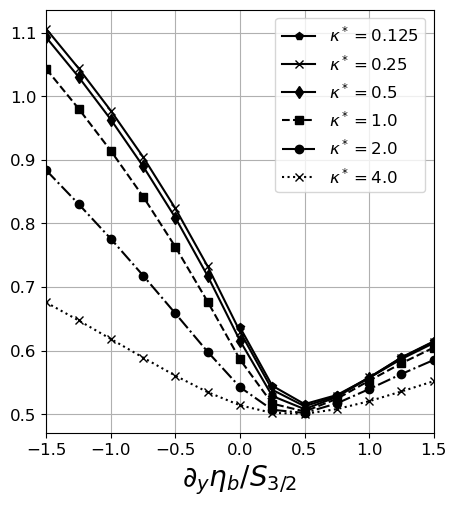

(-1.5, 1.5)

In [39]:
fig, ax1 = plt.subplots(1,1, figsize=(5,5.5))

lsize = 20
tsize = 12

x = h0s ./ S32
x2 = x[7:end]

norm = Ld


############################################################################
kstar = [0.125, 0.25, 0.5, 1., 2., 4.]


c1=4.0
c2=0.36

norm = Ld
# norm = @. Ld * (exp(-c2/kstar) /c1)^-1

# x  = @. x' * c1 * exp(c2 / kstar) / (log(c1 * exp(c2 / kstar))^1.5)


############################################################################
# ax1.plot(x2, length_ratios[7:end,1], color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
# ax1.plot(x, length_ratios[:,2], color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
# ax1.plot(x, length_ratios[:,3], color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
# ax1.plot(x, length_ratios[:,4], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
# ax1.plot(x, length_ratios[:,5], color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
# ax1.plot(x, length_ratios[:,6], color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")


ax1.plot(x2, kx_max[7:end,1], color="k", marker="p", linestyle="-", label=L"\kappa^* = 0.125")
ax1.plot(x, kx_max[:,2], color="k", marker="x", linestyle="-", label=L"\kappa^* = 0.25")
ax1.plot(x, kx_max[:,3], color="k", marker="d", linestyle="-", label=L"\kappa^* = 0.5")
ax1.plot(x, kx_max[:,4], color="k", marker="s", linestyle="--", label=L"\kappa^* = 1.0")
ax1.plot(x, kx_max[:,5], color="k", marker="o", linestyle="-.", label=L"\kappa^* = 2.0")
ax1.plot(x, kx_max[:,6], color="k", marker="x", linestyle="dotted", label=L"\kappa^* = 4.0")


# ax1.set_ylabel(L"\ell_\mathrm{mix} ", fontsize=lsize)
# ax3.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)
ax1.legend(fontsize=tsize)
ax1.set_xlabel(L"\partial_y \eta_b / S_{3/2}", fontsize=lsize)

ax1.grid()

ax1.tick_params(labelsize=tsize, which="both")

# ax1.set_yscale("log")
# ax1.set_xscale("symlog")

ax1.set_xlim(x[1], x[end])

